---
title: "Presentation"
subtitle: "Case Study: Cantilever beam"
date: today #25/04/2024
date-format: "D MMM, YYYY"
author: "Thyge Vinther Ludvigsen, s203591"
lang: en #en da  - sprog
#highlight-style: quarto_files/nord-dark-pro.theme # nord github-dark
highlight-style: nord # nord github-dark atom-one-dark
filters:
  - presentation_data/promote.lua
format:
  revealjs: 
    # slide-level: 3 # gives the heading level need to make an seperate slide
    slide-level: 2
    toc: true
    toc-title: "Overview"  # Customize the title of your TOC slide
    toc-depth: 1   # if 2 then it will include h2 and h3 in the TOC, if 1 then only h2
    # theme: dracula # dracula, dark, moon      Best white theme: serif, simple
    # theme: presentation_data/styles.scss
    theme: [dracula, presentation_data/styles.scss]
    slide-number: true
    incremental: false  # makes all lists incremental by default unless they have the .nonincremental class
    # chalkboard: 
    #   buttons: false
    navigation-mode: linear # this is also the default.
    preview-links: auto
    logo: presentation_data/img/DTU_logo.png
    css: presentation_data/styles.css
    footer: '[GitHub](https://github.com/Thygeminator/research-notebook)'
    # make all slides {.smaller .scrollable}
    smaller: true
    scrollable: true
    embed-resources: true
    # self-contained: true
    self-contained-math: true
    echo: false
    output: false
jupyter: python3

---

<!-- include-in-header:
  text: |
    <script src="https://cdn.plot.ly/plotly-3.0.1.min.js" charset="utf-8"></script> -->

::: {.content-hidden}
# Work plan

Step 1: generate model parameters

- Create data set of omega and phi 
  - Given distributions for damage state $\theta$ and a stiffness reduction factor $\delta E$, what are the modal parameters $\omega$ and $\phi$?
  - we also need $g(\theta, \delta E, e)$ to convert the stiffness reduction factor and damage state in to modal parameters

::: {.callout-note title="Note step 1"}
What $e$ configuration to chose??? 

Example / idea 1:

- calculate the covariance matrix for all the modal parameters
- Choose what quantile to for each for each parameter in the covariance matrix
- Sample form the quanti covariance matrix

Note: use that i have the knowledge of the variance in the covariance matrix, so i can fast sample the quantile fast if i make asumptions the mean value of the euler distance of the modeshapes.

idea 2: 

- sample form all sensor configurations. and use that data.

:::


Step 2: calculate features

- $y = g(\omega, \phi, e)$

Step 3.1: make an numerical estimate of $P(y |H)$

Step 3.2: Train the covariance matrix for the likelihood function for the features

Step 0: plot and visualize the data 
:::

::: {.content-hidden}
# Note for building the presentation

- [github example](https://github.com/quarto-dev/quarto-web/tree/main/docs/presentations/revealjs/demo)
    - [view of the slide show](https://quarto.org/docs/presentations/revealjs/demo/#/title-slide)

- [Quarto Documentation: Presentations](https://quarto.org/docs/presentations/)
    - note: that the revealjs — reveal.js (HTML) is the best options if i want to display heavy math
:::

::: {.content-hidden}
# Notes and ideas 

Physics → modal parameters → features → decisions

- Implicit likelihood vs explicit/exact likelihood  (Likelihoods are approximated or implicitly defined, e.g., through simulations, rather than explicitly formulated.)
  - have statistical models for the modal parameters, and then estimate the 

Evaluation:

- Bayesian risk
- ROC curves
- Overage [confusion matrix](https://en.wikipedia.org/wiki/Confusion_matrix)



Stochastic Subspace Identification (SSI)   
Value of Information (VoI)
Bayesian model updating (BMU)

prior decision analysis 
preposterior decision analysis

approximate Bayesian computation by subset simulation (ABC-SS)
Markov chain Monte Carlo (MCMC)

:::

::: {.content-hidden}
## How to simplify the integration of my analysis? 

[Linear and Quadratic Discriminant Analysis](https://scikit-learn.org/stable/modules/lda_qda.html)

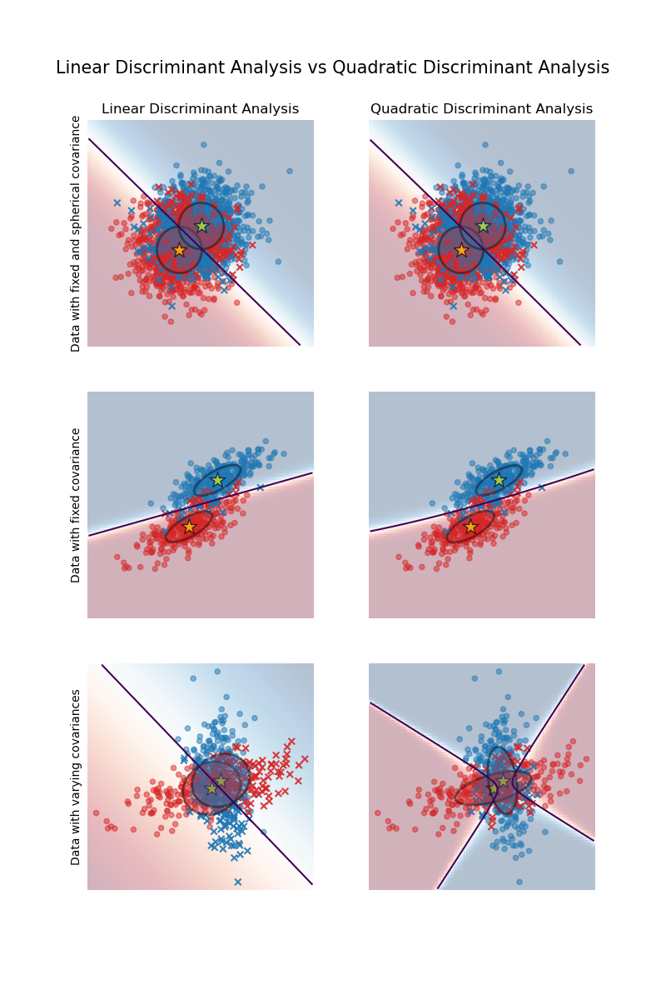{width=30%}


:::

In [327]:
import numpy as np
import matplotlib.pyplot as plt

::: {.content-hidden}
# Bayesian risk class &starf;
:::

In [328]:
#| echo: false
#| output: false
import numpy as np
from numpy.random import multivariate_normal

class BR:
  def __init__(self, omega_all, phi_all, CV_omega, sigma_phi, prior, N = 10**4, print_code = False):
    # all parameters for later use
    self.omega_all = omega_all
    self.phi_all = phi_all
    # No damage parameters
    self.omega_H0 = omega_all[0]
    self.phi_H0 = phi_all[0]
    # Damage parameters
    self.omega_H1 = omega_all[1:]
    self.phi_H1 = phi_all[1:] 
    
    # Coefficient of variation for omega and phi
    self.CV_omega = CV_omega
    self.sigma_phi = sigma_phi

    # number of Monte Carlo samples
    self.N = N
    
    # prior probabilities for theta
    self.prior = prior

    # print code
    self.print_code = print_code


  # def feature_vector(self, features_vector):

  #   return 

  # Statical parameters for the multivariate normal distribution 
  def covariance_matrix(self, S):
    # Sensor vector
    S = np.array(S)

    # Standard deviation
    sigma_omega = self.CV_omega * self.omega_H0 
    sigma_phi = self.sigma_phi * np.ones(self.phi_H0.shape[0]) 

    # modal observability
    mo = np.array([np.linalg.norm(np.multiply(S, phi_i)) for phi_i in self.phi_H0])

    # Variance Omega
    var_omega = sigma_omega**2 / (mo**2)

    # Variance Phi
    var_phi = sigma_phi**2 / (mo**2)

    # Diagonal covariance matrix
    # mu = np.concatenate([self.omega_H0, self.mask_and_normalize(self.phi_H0, S).flatten()])  # mean vector
    mu = self.mu_vector(self.omega_H0, self.phi_H0, S) # mean vector
    diagonal = np.concatenate([var_omega, np.repeat(var_phi, np.sum(S, dtype=int))])  # variances for omega and phi
    cov = np.diag(diagonal)  # covariance matrix
    
    # save for later use
    self.mu = mu
    self.cov = cov 
  
  def mu_vector(self, omega, phi, S):
    # Sensor vector
    S = np.array(S)
    # mean vector 
    mu = np.concatenate([omega, self.mask_and_normalize(phi, S).flatten()])  # mean vector
  
    return mu

  def mask_and_normalize(self,X, S):
    mask = S == 1

    # Step 1: apply mask on last axis
    filtered = X[..., mask]

    # Step 2: compute max along last axis
    max_vals = np.max(np.abs(filtered), axis=-1, keepdims=True)

    # Step 3: avoid division by zero
    max_vals[max_vals == 0] = 1

    # Step 4: normalize
    return filtered / max_vals


  def MCS_modal(self, S, prior_Importance = None):
    # S is the sensor vector
    S = np.array(S)

    # get covariance matrix and mean vector
    self.covariance_matrix(S)

    if prior_Importance is not None:
      # Imoportance sampling for structural states: theta ~ Q(theta) where Q is the importance distribution
      states = np.random.choice(range(len(self.prior)), size=self.N, p=prior_Importance)
      H_vec = (states > 0).astype(int)  # 0 if state == 0, else 1
      self.states = states
      self.H_vec = H_vec

    elif prior_Importance is None:
      # Generate all states and H labels at once: theta ~ P(theta)
      states = np.random.choice(range(len(self.prior)), size=self.N, p=self.prior)
      H_vec = (states > 0).astype(int)  # 0 if state == 0, else 1
      self.states = states
      self.H_vec = H_vec

    # generate errors for omega and phi
    # errors = np.random.multivariate_normal(mean=np.zeros(self.cov.shape[0]), cov=self.cov, size=self.N)

    # model properties 
    # lambda_star = np.random.multivariate_normal(mean=self.mu, cov=self.cov, size=self.N)
    lambda_star = np.random.multivariate_normal(mean=np.zeros(self.cov.shape[0]), cov=self.cov, size=self.N)
    lambda_star[:, :len(self.omega_H0)] += self.omega_all[states]
    lambda_star[:, len(self.omega_H0):] += self.mask_and_normalize(self.phi_all[states], S).reshape(self.N, -1)
    self.lambda_star = lambda_star

    # extract omega and phi from lambda_star
    omega_bar = lambda_star[:, :self.omega_H0.shape[0]]
    # phi_bar = lambda_star[:, self.omega_H0.shape[0]:]
    phi_bar = lambda_star[:, self.omega_H0.shape[0]:].reshape(self.N, self.phi_H0.shape[0], np.sum(S, dtype=int))
    self.phi_no_norm = phi_bar.copy() # save the non-normalized phi for later use
    # normize phi_bar by  by the maximum absolute value across all samples for each mode
    # normalize each mode-shape vector per sample (along the last axis)
    max_abs = np.max(np.abs(phi_bar), axis=2, keepdims=True)  # shape: (N, N_phi, 1)
    phi_bar = phi_bar / np.where(max_abs == 0, 1, max_abs)
    # phi_bar = self.mask_and_normalize(phi_bar, S)

    self.omega_bar = omega_bar
    self.phi_bar = phi_bar
    

  def MAC(self, phi1, phi2):
    # Compute the Modal Assurance Criterion (MAC) between two mode shapes
    numerator = np.abs(np.dot(phi1, phi2))**2
    denominator = np.dot(phi1, phi1) * np.dot(phi2, phi2)
    return numerator / denominator if denominator != 0 else 0

  def TMAC(self, phi_theta_1, phi_theta_2):
    N_samples = phi_theta_1.shape[0]
    TMAC_matrix = np.zeros((N_samples, N_samples))
    for i in range(N_samples):
        for j in range(N_samples):
            TMAC_matrix[i, j] = self.MAC(phi_theta_1[i], phi_theta_2[j])

    # sum of diagonal of the MAC 
    self.print2("TMAC matrix:\n", TMAC_matrix)  
    TMAC = np.sum(np.diag(TMAC_matrix)) / (N_samples)
    return TMAC
  
  # Modal Flexibility (MF)
  def MF(self, phi_vec, omega_vec):
    # Compute the Modal Flexibility (MF) for a given mode shape and natural frequency
    return sum(np.diag(np.abs(np.dot(phi_vec, phi_vec.T) / (omega_vec**2))))

  def print2(self, *args):
    if self.print_code:
        print(*args)
    

# Plan

## Time Plan

::: panel-tabset

### Gantt Chart

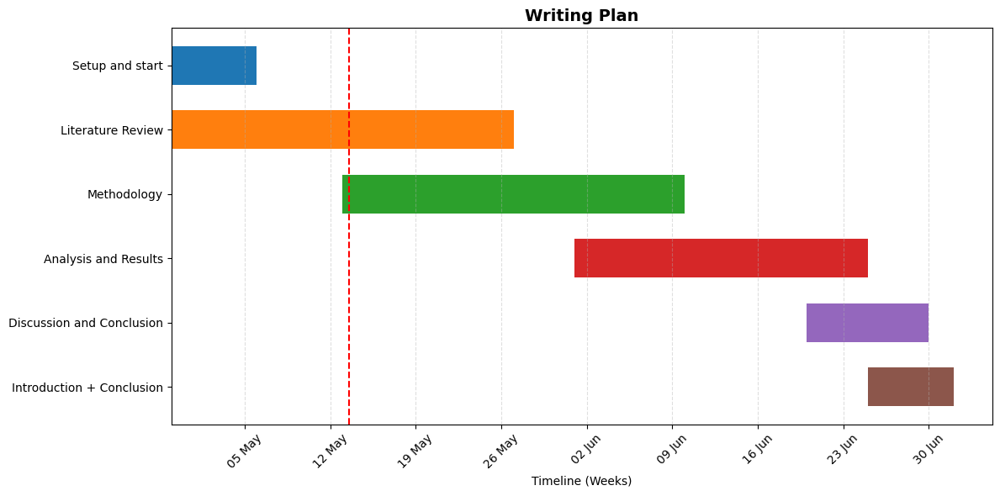

In [329]:
#| echo: false
#| output: false
from python_code.gantt_chart import create_gantt_chart

tasks = [
            ("Setup and start", "2026-04-29", "2026-05-06"),
            ("Literature Review", "2026-04-29", "2026-05-27"),
            ("Methodology", "2026-05-13", "2026-06-10"),
            ("Analysis and Results", "2026-06-01", "2026-06-25"),
            ("Discussion and Conclusion", "2026-06-20", "2026-06-30"),
            ("Introduction + Conclusion", "2026-06-25", "2026-07-02"),
        ]

create_gantt_chart(tasks = tasks, gant_name="Writing Plan")

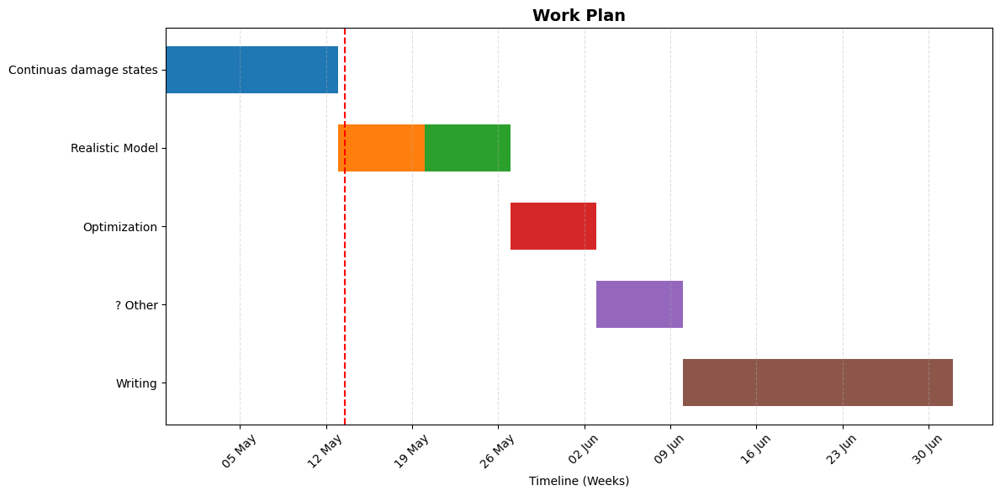

In [330]:
#| echo: false
#| output: true
from python_code.gantt_chart import create_gantt_chart

tasks = [
            ("Continuas damage states", "2026-04-29", "2026-05-13"),
            ("Realistic Model", "2026-05-13", "2026-05-20"),
            ("Realistic Model", "2026-05-20", "2026-05-27"),
            # ("Continuas damage states", "2026-04-29", "2026-05-06"),
            # ("Continuas damage states", "2026-04-29", "2026-05-06"),
            ("Optimization", "2026-05-27", "2026-06-3"),
            ("? Other", "2026-06-3", "2026-06-10"),
            # ("Questions", "2026-05-20", "2026-06-10"),
            ("Writing", "2026-06-10", "2026-07-02"),
        ]

create_gantt_chart(tasks = tasks, gant_name="Work Plan")

### cds. 

**Countinuous damage states**

- Make an funciton for given H1 what is the stiffness reduction factor for the damage state
- Make an rugth function there links the stiffness reduction factor to probability of failure? for the structure
- Use the 2 functions above to update the cost matrix for undetected damage 


### Relaistic model

- Upadate FEM model to an more realistic structure. (2D, more dof's, elments, modes etc.)
- Set up 2-3 cass whit realistic priors and cost matrix
    - read papers and method to set up the priors and cost matrix (Takes time)

### Optimization

- Implement optimization algorithm's to find the optimal decision cretiria for the optimal snosor placements
    - what is the given information ??


### Last 2 weeks

- Ilustative Work on Fream work for testing assumptions? (cut be fun?)
    - Make an sugestion for an surgate model for error in OMA (Not computabol ???)
- Thigtening up the othere work ?
- Comparison with traditional methods 
    - we do not have the samme ground truth to compare with ??? (Not that intresting)




:::

# Stiffness reduction 


## Stiffness reduction effect's

Stiffness reduction factor:
$$
    E_{damaged} = (1 - d) E_{undamaged}
$$

where:

- $E_{damaged}$ is the effective Young's modulus of the damaged structure.
- $E_{undamaged}$ is the Young's modulus of the undamaged structure.
- $d$ is the damage variable, which ranges from 0 (no damage) to 1 (complete failure).

::: {.callout-note title="Static loading"}
Lowering the stiffness leads to:

- $\uparrow \delta$ (higher displacements) and $\uparrow \epsilon$ (higher strains)  (SLS)
- Redistribution of loads in indeterminate systems, to stiffer elements. (ULS)
- $\downarrow P_{cr}$ lower buckling capacity, do to lower stiffness in out of plane buckling. (ULS)
:::

::: {.callout-note title="Dynamic loading"}
Lowering the stiffness leads to:

- $\downarrow \omega$ lower natural frequencies (Resonance effects)
- Large amplitude of the vibrations for the same loading (conservation of energy in equation of motion)
:::

::: {.callout-note title="Note"}
If the stiffness reduction is due to plastic deformations, then the ductility of the structure can be decreased for further loading. This has an effect on:

- Earthquakes where there are large cyclic loading, where the structure rely on ductility to dissipate energy.
:::

::: {.callout-tip title="FEM model for evaluating the effect of stiffness reduction"}
Static loading:

- Linear FEM model: to capture load redistribution in indeterminate systems. (if deformations are small)
- **Nonlinear FEM model**: to capture geometric instability (buckling), and non linear effects (if the deformations are not small.)
    - mostly geometric nonlinearity.

Dynamic loading:

- dynamic linear FEM model: to capture the effect of Modal parameters when the stiffness is reduced. (if deformations are small)
    - This is the case when we do OMA.
- **dynamic nonlinear FEM model**: to capture nonlinear effects, and buckling (if deformations are not small)
    - both matrial Nonlinearity and geometric nonlinearity can be captured in this model.

:::


::: {.notes}
Strain-controlled failure:

- Ultimate compressive strain capacity of concrete
- SLS: Serviceability limit states
     - Deflection limits
     - Crack width limits
- Buckling
- Fatigue: Controlled by strain/stress cycles, not single strength value
:::

# Continuous Damage States

## General idea

Probability of level of stiffness reduction:
$$
    P(\delta E \mid \theta)
$$

where: 

- $\delta E$ is the stiffness reduction factor

Probability of failure given damage state add stiffness reduction factor:
$$
P(\text{failure} \mid \delta E, \theta)
$$



::: {.callout-note title="Boundary conditions: stiffness reduction factor"}
No damage leads to no stiffness reduction:
$$
P(\delta E > 0 \mid \theta = \text{No damage}) = 0, \quad P(\delta E = 0 \mid \theta = \text{No damage}) =1
$$

Probability mass for damage state:
$$
 P(\delta E > 0\mid \theta = \text{damage}) = \int_0^1 P(\delta E \mid \theta = \text{damage}) d\delta E = 1
$$
:::



## Probability of level of stiffness reduction

$$
    P(\delta E \mid \theta)
$$

This is an function where we have no good way to estimate it, but we can make some assumptions about the shape of the function.

**Assumptions:**

1. The probability of stiffness reduction of close to 100% is very low? 
2. The probability of stiffness reduction of close to 0% is low?
     - Argument 1: There is no value of upserving small martrial degradations, even if they are present, they are only valuable if they leed to faster degradations there will have an effect on the probability of failure.
     - Argument 2: the prior are constructed on the basis of $H_1$ being that the structure is damaged, (If damage is defined as an stiffness change there leads to a significant change of probability of failure. )


## Probability of failure given stiffness reduction

$$
P(\text{failure} \mid \delta E, \theta) = P(g(X) < 0 \mid \delta E, \theta)
$$


variables:
$$
X = \{\delta E, \theta, F, f_y, \epsilon_{ult}, ...\}
$$

- $\delta E$ is the stiffness reduction factor
- $\theta$ is the damage state vector
- $F$ is the applied load
- $f_y$ is the yield strength of the steel
- $\epsilon_{ult}$ is the ultimate strain capacity of forexample the concrete

::: {.callout-note title="Note"}
- $\delta E$ is not an stochastic variable 
- $\theta$ is not an stochastic variable
- all the other variables are stochastic variables.
:::

limit state function:
$$
g(X)=R(X)−S(X)
$$

where:

- $R(X)$ is the resistance  / the capacity of the structure.
- $S(X)$ is the load effect / the response of the structure to the applied load
- Failure occurs when $g(X) < 0$

::: {.callout-note title="Clarification"}
This is a note that will appear as a colored box in your PDF.
:::


## Limit state function

![](presentation_data/img/P_failure.png)

## My expectations of the probability of failure

Relationship between stiffness reduction and probability of failure:

- $\downarrow \delta E \rightarrow \downarrow P_{cr}$: Liniar relationship in Static loading whit no redistribution of loads ($P_{cr} \propto E I$)
    - Eurlerar buckling formula: $P_{cr} = \frac{\pi^2 E I_z}{(K L)^2}$
        - $K$ is the effective length factor


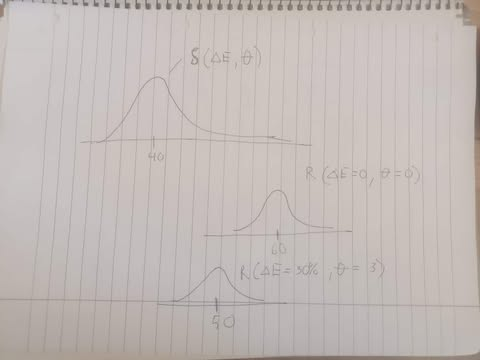

::: {.notes}
Eurlerar buckling:

if the 

:::

## Probability functions 

I am intrested in probability distributions in the interval [0,1].

- [Beta distribution](https://en.wikipedia.org/wiki/Beta_distribution), [np.random.beta](https://numpy.org/doc/stable/reference/random/generated/numpy.random.beta.html#numpy.random.beta), [scipy.stats.beta](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.beta.html#scipy.stats.beta)

Beta PDF:
$$
f(x; \alpha, \beta) = \frac{x^{\alpha-1} (1-x)^{\beta-1}}{B(\alpha, \beta)}
$$

where:

- $\beta$ is the beta function, defined as $B(\alpha, \beta) = \frac{\Gamma(\alpha) \Gamma(\beta)}{\Gamma(\alpha + \beta)}$
- $\Gamma$ is the gamma function.

Stiffness reduction probability distribution: 

- $a = 4$ and $b= 4$ (symmetric, mean = 0.5, low probability at tails)
- $a = 4$ and $b= 10$ (mean < 0.5, low probability at tails)

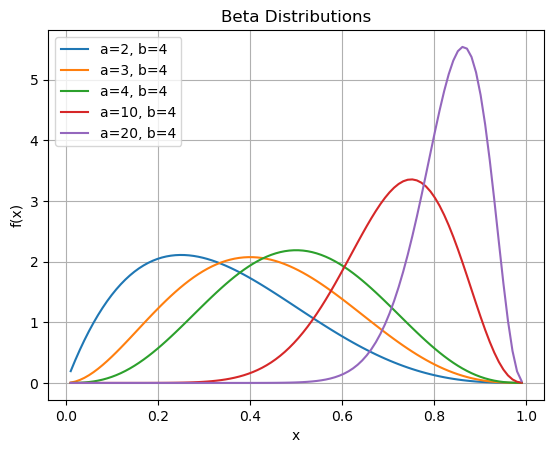

In [331]:
#| echo: false
#| output: true
from scipy.stats import beta

error = 0.01
error = 0.01
x = np.linspace(0+error, 1-error, 100)

a_list = [2,3,  4, 10, 20]

for a in a_list:
    b = 4
    y = beta.pdf(x, a=a, b=b)
    plt.plot(x, y)
plt.xlabel('x')
plt.ylabel('f(x)')
plt.title('Beta Distributions')
plt.legend([f'a={a}, b={b}' for a, b in zip(a_list, np.ones_like(a_list)*b)])
plt.grid()
plt.show()


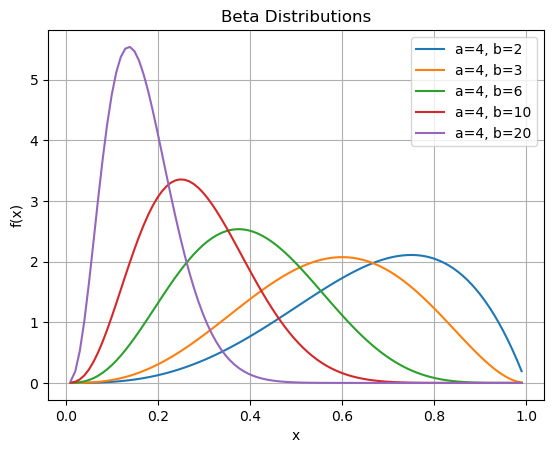

In [332]:
#| echo: false
#| output: true
from scipy.stats import beta

error = 0.01
error = 0.01
x = np.linspace(0+error, 1-error, 100)

b_list = [2, 3, 6, 10, 20]

for b in b_list:
    a = 4
    y = beta.pdf(x, a=a, b=b)
    plt.plot(x, y)
plt.xlabel('x')
plt.ylabel('f(x)')
plt.title('Beta Distributions')
plt.legend([f'a={a}, b={b}' for a, b in zip(np.ones_like(b_list)*a, b_list)])
plt.grid()
plt.show()

## Problem whit continuous damage states

::: {.callout-note title="Problem 1"}
Eigen value problem: 
$$
(K(\theta, \delta E) - \omega^2 M) \phi = 0
$$

- $\omega$ is the natural frequency, eigen values
- $\phi$ is the mode shape, eigen vectors 
- $K$ is the stiffness matrix
    - the static loading is also included in the stiffness matrix ??? 
- $M$ is the mass matrix

For the cantilever beam dos $10^4$ evaluations of the eigen value problem take 32s on my PC. 

Problem:

- It is some what expensive to evalueta the omega and phi for each evaluation

Solution 1: 

- Build an surrogate model of the modal prameters given the siffness reduction factor, and the damage state. 
    - Problem 1: the cost of building the surrogate model, increases fast whit the number of posibole damage states $\theta$.
    - Problem 2: For my structure is the relationship cose to linear, but i think that for more complex structures is the relationship not always close to linear.
    - Problem 3: changing of the order of modes and mode shapes, when the stiffness is reduced, can lead to problems with the surrogate model.

Solution 2:

- Use the Build FEM model maby it is fast enough

Sulution 3:

- Extract stiffness and mass matrices form the model and try to build an faster solver? 

:::

In [333]:
#| echo: true
#| output: true
import math as math
n = 10**3 # number of elements
k = 3 # size of combinations 

math.factorial(n) / (math.factorial(k) * math.factorial(n-k))

166167000.0

## Example for understanding

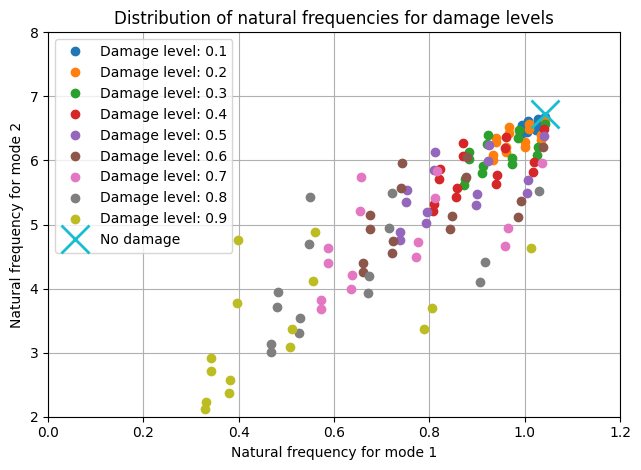{width=50%}

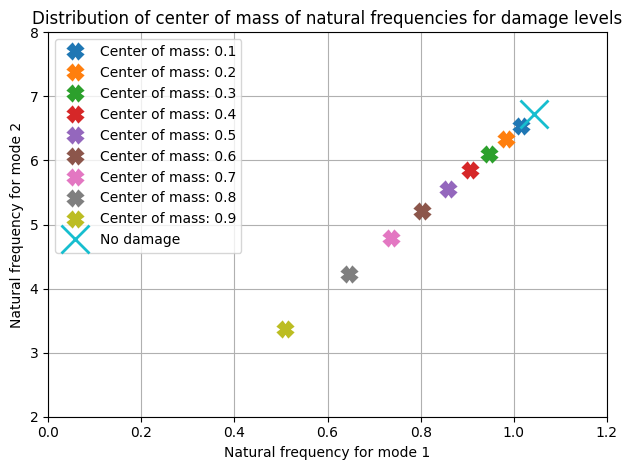{width=50%}

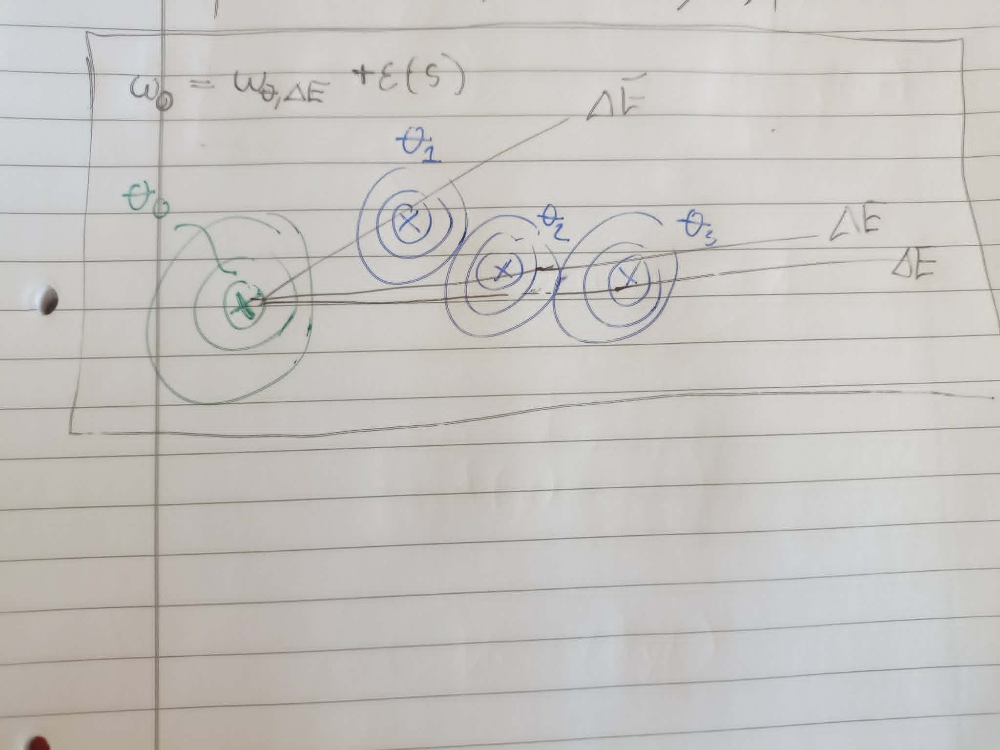{width=50%}

- $\omega_1$ for the first axis
- $\omega_2$ for the second axis

Stochastic modal parameters: 


$$
(\bar{\boldsymbol\omega}, \bar{\boldsymbol\phi}) \sim p(\boldsymbol\omega, \boldsymbol\phi \mid \theta)
$$

$$
(\bar{\boldsymbol\omega}, \bar{\boldsymbol\phi}) \sim g(\theta, e) + \epsilon(\theta, e)
$$

Where: 

- $g(\theta, e)$ is the deterministic part of the model, which depends on the structural state $\theta$ and the sensor configuration $e$.
- $\epsilon(\theta, e)  = \epsilon_0(\cdot) + ... + \epsilon_n(\cdot)$

Likelihood for the Level 1 SHM system:

$$
f(y \mid H_i)= \sum_{\theta \in H_i} \int f(y, \theta, \delta E \mid H_i) d\delta E =\sum_{\theta \in H_i} \int f(y \mid \theta, \delta E) P(\theta \mid H_i) f(\delta E|\theta) \, d\delta E
$$

Posterior distribution (level 1 SHM system):

$$
P(H_i \mid y) = \frac{f(y \mid H_i) P(H_i)}{f(y)}
$$

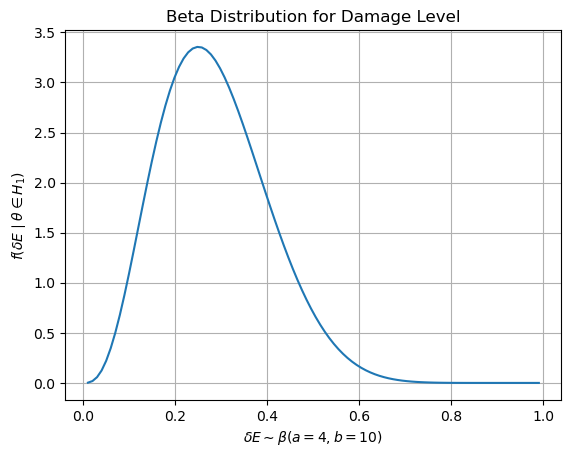

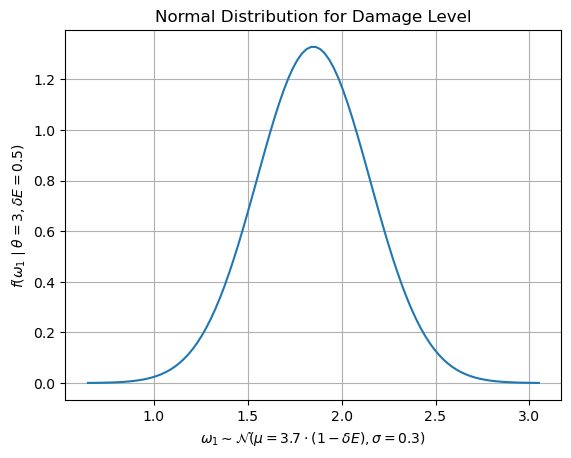

In [334]:
#| echo: false
#| output: true
from scipy.stats import beta 
from scipy.stats import norm

x = np.linspace(0+error, 1-error, 100)

a = 4
b = 10
y = beta.pdf(x, a=a, b=b)
plt.plot(x, y)
plt.ylabel(r'$f(\delta E \mid \theta \in H_1)$')
plt.xlabel(r'$\delta E \sim \beta(a=4, b=10)$')
plt.title('Beta Distribution for Damage Level')
plt.grid()
plt.show()

delta_E = 0.5
mu = 3.7 * (1 - delta_E)
sigma= 0.3
x = np.linspace(mu - 4*sigma, mu + 4*sigma, 100)
y = norm.pdf(x, loc=mu, scale=sigma)
plt.plot(x, y)
plt.ylabel(rf'$f(\omega_1 \mid \theta = 3, \delta E = {delta_E} )$')
plt.xlabel(r'$\omega_1 \sim \mathcal{N}(\mu=3.7 \cdot (1- \delta E), \sigma=0.3)$')
plt.title('Normal Distribution for Damage Level')
plt.grid()
plt.show()



Joint distribution of $\omega_1$ and $\delta E$ given the damage state $\theta$:

$$
  f_{\omega_1}(\omega_1, \delta E|\theta) =  f_{\omega_1}(\omega_1 \mid \theta, \delta E)f_{\delta E}(\delta E|\theta)
$$

Marginal distribution of $\omega_1$ given the damage state $\theta$:
$$
f_{\omega_1}(\omega_1 \mid \theta) = \int f_{\omega_1}(\omega_1 \mid \theta, \delta E)f_{\delta E}(\delta E|\theta) d\delta E
$$

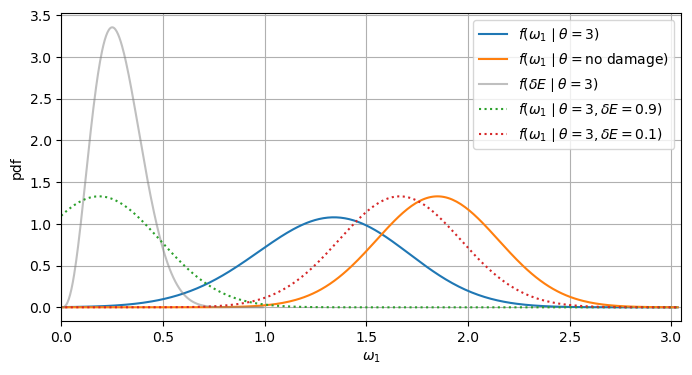

In [335]:
#| echo: false
#| output: true

# Numerical marginal p(omega1 | theta) by integrating out deltaE
# uses existing variables: BRinf, CV_omega, beta, norm, error

# grid for deltaE
delta = np.linspace(error, 1-error, 300)
a, b = 4, 10  # beta parameters chosen earlier
pdf_delta = beta.pdf(delta, a=a, b=b)

# conditional mean & std for omega1 given deltaE (simple model: omega scales with (1-deltaE))
mu0 = mu              # undamaged first natural frequency
mu_delta = mu0 * (1 - delta)
sigma_delta = np.ones_like(delta) * sigma      # CV-based std

# omega grid for plotting
minw = np.min(mu_delta - 4*sigma_delta)
maxw = np.max(mu_delta + 4*sigma_delta)
omega_grid = np.linspace(minw, maxw, 400)

# compute marginal: f(omega) = \int f(omega | delta) f_delta(delta) ddelta
# shape: norm.pdf -> (len(omega_grid), len(delta))
cond_pdf = norm.pdf(omega_grid[:, None], loc=mu_delta[None, :], scale=sigma_delta[None, :])
integrand = cond_pdf * pdf_delta[None, :]
f_marginal_damage = np.trapezoid(integrand, delta, axis=1)

# H0 (no damage): deltaE = 0 w.p.1 -> conditional is the marginal
f_H0 = norm.pdf(omega_grid, loc=mu0, scale=sigma)

# plot results
plt.figure(figsize=(8,4))
plt.plot(omega_grid, f_marginal_damage, label=r'$f(\omega_1\mid \theta= 3)$')
plt.plot(omega_grid, f_H0, label=r'$f(\omega_1\mid \theta=\text{no damage})$')
# plot deltaE distribution for reference
# plt.twinx()
plt.plot(delta, pdf_delta, color='gray', alpha=0.5, label=r'$f(\delta E \mid \theta=3)$')
plt.xlim(0, mu0 + 4*sigma)

# plot f(omega_1, deltaE = 0.9 | theta=3) for reference
delta_ref = 0.9
mu_ref = mu0 * (1 - delta_ref)
sigma_ref = sigma
y_ref = norm.pdf(omega_grid, loc=mu_ref, scale=sigma_ref)
plt.plot(omega_grid, y_ref, ':', label=r'$f(\omega_1 \mid \theta=3, \delta E = 0.9)$')
# plot f(omega_1, deltaE = 0.1 | theta=3) for reference
delta_ref2 = 0.1
mu_ref2 = mu0 * (1 - delta_ref2)
sigma_ref2 = sigma
y_ref2 = norm.pdf(omega_grid, loc=mu_ref2, scale=sigma_ref2)
plt.plot(omega_grid, y_ref2, ':', label=r'$f(\omega_1 \mid \theta=3, \delta E = 0.1)$')

plt.xlabel(r'$\omega_1$')
plt.ylabel('pdf')
plt.legend()
plt.grid(True)
plt.show()


::: {.callout-note title="Note for plot"}
- this is only an ilustration of one damage state $\theta = 3$.
:::

# Nice Book

## Structural Reliability Analysis and Prediction

- Se table 2.5 to 2.8. “Acceptable Risk Criterion” ([“Structural Reliability Analysis and Prediction”, 2017, p. 50](zotero://select/library/items/WAR7AJ3L)) ([pdf](zotero://open-pdf/library/items/YBLST87B?page=69&annotation=GSQIE3DG)) (Can be used to formulate priors, and cost matrix)

# Questions ? 

## Work plan

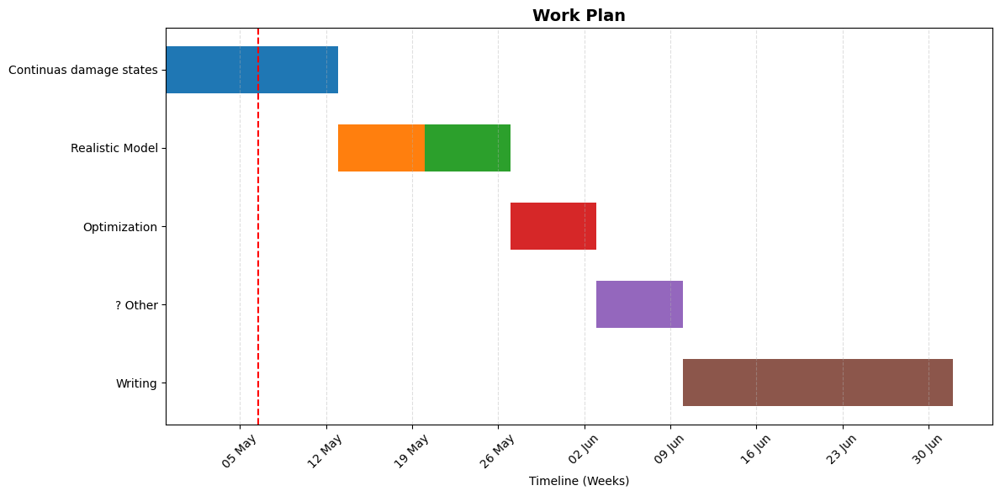

- Am i missing something important in the work plan ?
- Is it oaky that i dont do comparison with traditional methods ? (it is form the procject plan)

## Other

- good ideas for building an surrogate model for the mapping $\Delta E$ to the modal parameters ?
- good ideas for seting up the ralationship between the stiffness reduction factor and the probability of failure ? 
- what do you think about the stiffness reduction function? 

Note: 

- can you send the bridge model so i can see it? 

## Idear's

Train the covariance matrix on the modal data, so i don't need to know the parameters for the covariance matrix in the OMA error function? 

# Meting 2 (14/07)

Overview of last weeks meting:

- Understanding of what stiffness reduction effect's (static and dynamic loading).
- Understanding of how to compute the probability of failure.
- Presentation of curent problems and ideas for solving them.

Note: new procject name and disription

::: {.notes}
- evangolos suggested nice companyes there use reliability analysis and probability's
:::

## Presentation overview {.scrollable}

- Generate data with an continuous stiffness reduction factor, and damage state. **(Step 1)** (Wensday-friday)
    - Set up
        - FEM model
        - Priors $\theta, H$ 
        - distribution of the stiffness reduction factor
    - What covariance matrix to use? given e sensor configuration, and damage state? 
    - Make surrogate model for the mapping from stiffness reduction factor to modal parameters?
        - investigate the relationship between the stiffness reduction factor and the modal properties.
        - plot all this infromation
        - make the surrogate model
    - Generate Modal parameter data set
- Calculate features **(Step 2)** (friday)
    - $y = [\omega_1, ... , \omega_n, MAC_{1,1}, ... , MAC_{n,n}, TMAC, MF]$ 
    - print features
- Feature selection and dimensionality reduction **(Step 3)** (friday-Monday)
    - Feature selection
    - Feature selection with the inclustion of cunsequences (cost matrix)
        - Assume link between stiffness reduction factor and probability of failure.
- Training of decision model **(Step 4)** (Monday-Tuesday)
    - Train and Test (80/20)
        - Gaussian Mixture Model (GMM)
        - Logistic regression
    - Evaluation of decision model
        - Bayesian risk
        - ROC curves
        - [confusion matrix](https://en.wikipedia.org/wiki/Confusion_matrix)
- Make full case study with the decision models **(Step 5)** (Tuesday)



::: {.content-hidden}
- Monday: write report 
- Thousday: Work on next weeks problems
    - Get overwiew
    - Planing
- Wednesday: Prepere questions, and what's next
:::

# Questions ? 

## Questions for this week:

::: {.callout-caution title="Question 1: Probability of failure?"}
What shot i Asume the link function to be between the $\Delta E$, $\theta$ and the probability of failure?


**Solutions**:

Level 0: 

- Asumme an some what abetrary link function.

Level 1:

- Asume that the Probability of failure is dominated by static loading, That can be discribed by an linear elastic FEM model.

Level 2:

- Asume that the Probability of failure is dominated by static loading, That can be discribed by an Geometric Nonlinear FEM model.

Level 3-4:

- Combiantion of matrial and geometric nonlinear dynamics FEM model, where the probability of failure.

:::

<!-- ## What is mising in my work for continuous damage states? 

- The link between probability of failure and the stiffness reduction factor in damage cass $\theta$.
- Full model run whit this new link function, and my new decision models. -->

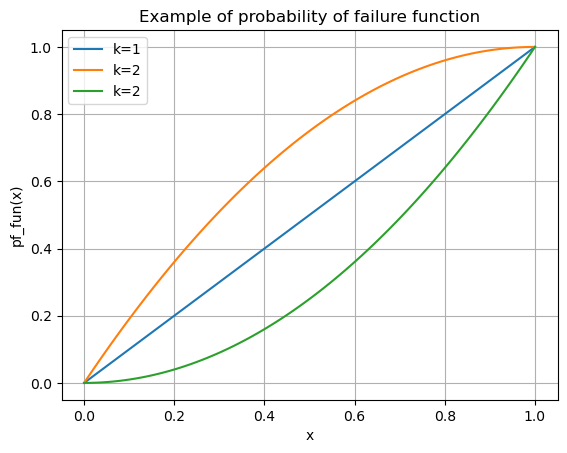

In [336]:
#| output: true
def pf_fun_1(x, a, b, k=1):
    return a + (b - a) * (1 - (1 - x) ** k)

def pf_fun_2(x, a, b, k=1):
    return a + (b - a) * (x ** k)

x = np.linspace(0, 1, 100)
plt.plot(x, pf_fun_1(x, 0, 1, k=1), label='k=1')
plt.plot(x, pf_fun_1(x, 0, 1, k=2), label='k=2')
plt.plot(x, pf_fun_2(x, 0, 1, k=2), label='k=2')
plt.xlabel('x')
plt.ylabel('pf_fun(x)')
plt.title('Example of probability of failure function')
plt.legend()
plt.grid()

## Questions for writing the report:

::: {.callout-caution title="Question 1: literature review"}
I have not written a literature review before, and could use some inputs.

- Do you have some tips?
- Do you have guidelines for writing a good literature review?
- Do you have an example of a good literature review that I can look at?
:::

::: {.callout-caution title="Question 2: Level of detail?"}
- Asume An thnical reader, with a good understanding of probability and Machine learning, but no understanding of structural health monitoring? 
:::

::: {.callout-caution title="Question 3: Structure of my report"}
Is this an nice structure for my report?

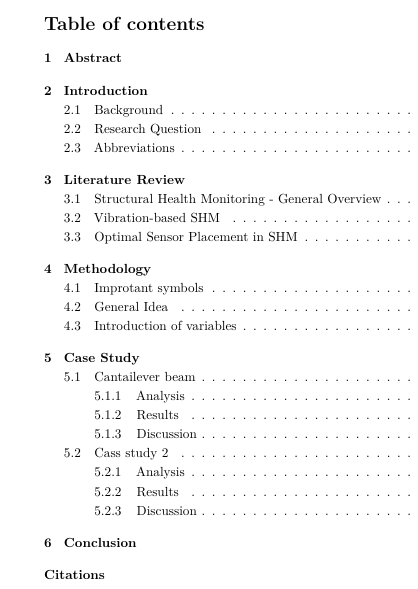
:::

## Questions next week:

::: {.callout-caution title="Question 1: Prior probability's of damage?"}
- How can i set up good priors for $P(H_1)$ and $P(H_0)$?
    - Is it okay to use uniform priors for $P(\theta)$?
:::

::: {.callout-caution title="Question 2: Cost per sensor placement?"}
- How can i build a good cost per sensor function? 
:::

::: {.callout-caution title="Question 3: Cost matrix"}
- How do i set up an realistic cost matrix
    - Expected cost of repair ? 
    - Expected cost of un-detected failure ?
    - Expected cost of inspection ?
:::

# FEM model

In [337]:
from python_code.FEM_class import FEM_class
# clear previous OpenSees model
# ops.wipe()

import numpy as np
import openseespy.opensees as ops


Running: build_model()
Creating node 1 at (0.0, 0.0)
Creating node 2 at (0.0, 5.0)
Creating node 3 at (0.0, 10.0)
Creating node 4 at (0.0, 15.0)
Creating node 5 at (0.0, 20.0)
Applying boundary condition at node 1: fix_x=1, fix_y=1, fix_rotation=1
Creating element 1 between nodes 1 and 2 with material 0
Creating element 2 between nodes 2 and 3 with material 0
Creating element 3 between nodes 3 and 4 with material 0
Creating element 4 between nodes 4 and 5 with material 0
Assigning mass of 1000.0 kg to node 2.0
Assigning mass of 1000.0 kg to node 3.0
Assigning mass of 1000.0 kg to node 4.0
Assigning mass of 1000.0 kg to node 5.0


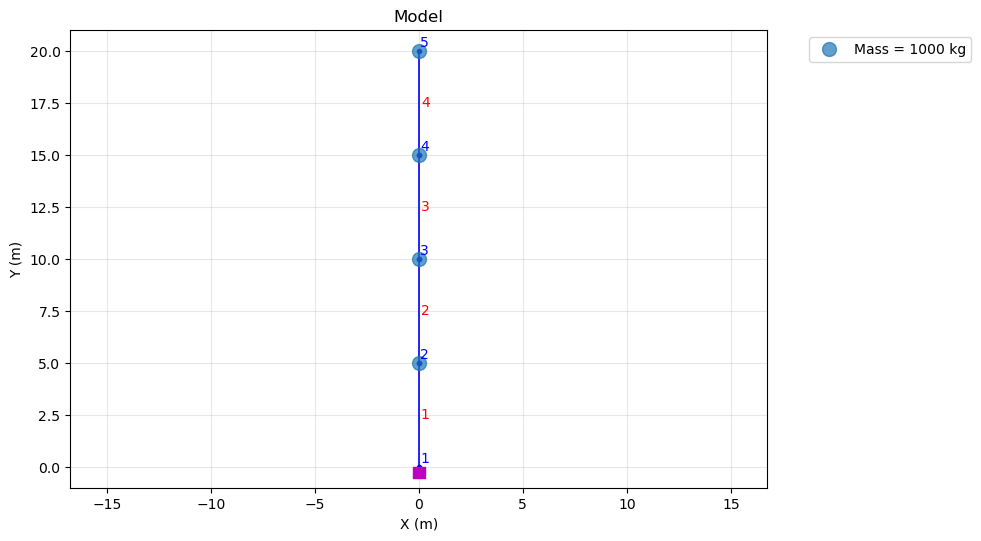

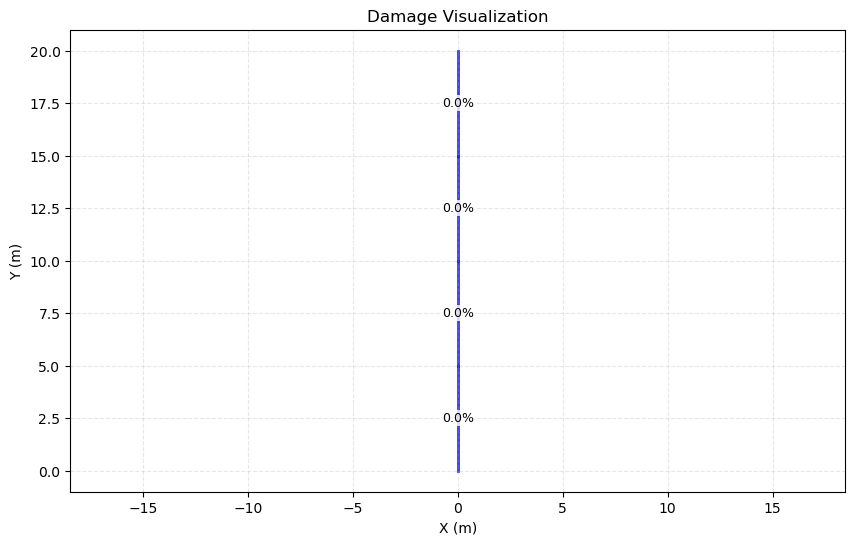


Running: gravity_analysis()
    !Error in applying element loads: iteration over a 0-d array
Applying nodal load of (0.0, -9810.0, 0.0) N to node 2.0
Applying nodal load of (0.0, -9810.0, 0.0) N to node 3.0
Applying nodal load of (0.0, -9810.0, 0.0) N to node 4.0
Applying nodal load of (0.0, -9810.0, 0.0) N to node 5.0
Using sfac = 8.563e+03


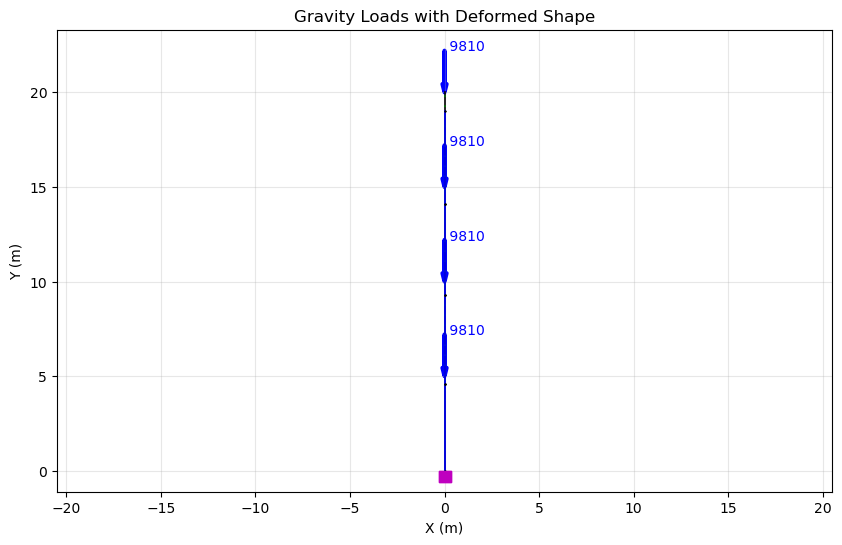

-----------------gravity analysis successfully run--------------------

Running: get_modal_periods()
Number of modes not specified, using n_modes = 4
Mode 1 - period T1 = 0.958 seconds
       - modal participation factor (X direction) = 69.6273
Mode 2 - period T2 = 0.149 seconds
       - modal participation factor (X direction) = 21.0241
Mode 3 - period T3 = 0.053 seconds
       - modal participation factor (X direction) = 6.9392
Mode 4 - period T4 = 0.029 seconds
       - modal participation factor (X direction) = 2.4024


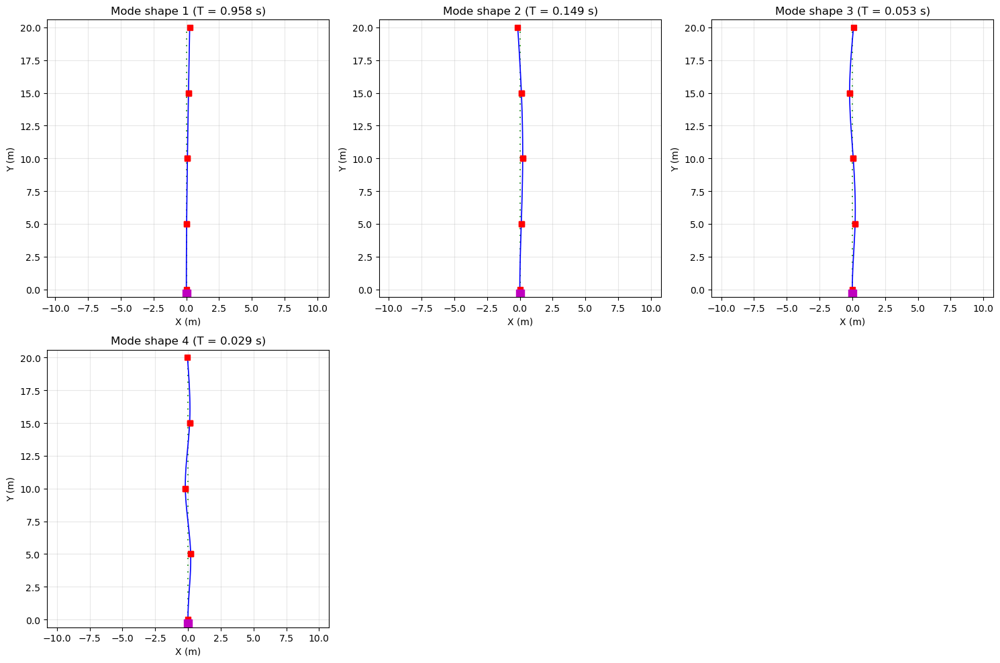

Modal periods (s): [0.95816562 0.14876015 0.0526906  0.02924239]
Modal frequencies (Hz): [ 1.04366091  6.72223044 18.97871864 34.1969293 ]
Modal frequencies (rad/s): [  6.55751487  42.23701954 119.24680614 214.86564374]


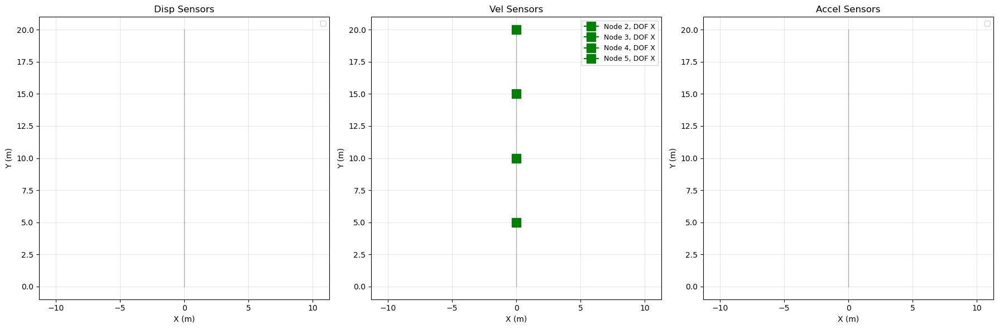

In [338]:
# x, y coordinates of nodes
X = [
    [0,0],
    [0,5],
    [0,10],
    [0,15],
    [0, 20]
]

# node_i, node_j, material_property_index
IX = [
    [0,1,0],
    [1,2,0], # beam = 1
    [2,3,0],
    [3,4,0]
]

# E, A, I, rho
mprop = [
    # E,     A,    I,     rho
    # [210e9, 0.01, 8.3e-6, 7850], # column
    [210e9, 0.02, 8.3e-4, 7850]  # beam

]

# nodal masses: node_id, mass (kg)
nodeMass = [
    [1, 1000], 
    [2, 1000], 
    [3, 1000],
    [4, 1000]
]


# element loads: element_id, load (N/m),    - load is in the negative y direction (gravity load)
# elementLoad = [
#     [1, -1000]
# ]
elementLoad = None

# nodal loads: node_id, load_x, load_y, load_z
nodeLoad = [
    [1, 0, -1000*9.81, 0], 
    [2, 0, -1000*9.81, 0], 
    [3, 0, -1000*9.81, 0], 
    [4, 0, -1000*9.81, 0],

]
# nodeLoad = None


# node_id, fix_x, fix_y, fix_rotation
bounds = [
    [0,1,1,1],
]

### setup model
# model = SHMStructure(X, IX, mprop, nodeMass, elementLoad, nodeLoad, bounds, print_code=False, plot_code=False)
# FEM = FEM_class(X, IX, mprop, nodeMass, elementLoad, nodeLoad, bounds, print_code=True, plot_code=False)
FEM = FEM_class(X, IX, mprop, nodeMass, elementLoad, nodeLoad, bounds, print_code=True, plot_code=True)

## Stiffness reduction
# model.set_damage(elem_ids=[0], level=0.01)
# model.set_damage(elem_ids=[1], level=0.2)
# model.set_damage(elem_ids=[2], level=0.4)

# add ground motion data
filename = 'data/ambient_excitation_10min.npz'
data = np.load(filename)
dt = data['dt']
acc_filtered = data['acc']
FEM.add_ground_motion(acc_filtered, dt, load_factor=40)



## Build the model
# model.build_model(plot_code=True)
FEM.build_model(plot_code=False) 
FEM.plot_damage()

## Run gravity analysis
# model.gravity_analysis(n_steps=10, plot_code=True)
FEM.gravity_analysis(n_steps=10, plot_code=False)


## Run dynamic analysis with ground motion
FEM.get_modal_periods()
print("Modal periods (s):", FEM.modal_periods)
print("Modal frequencies (Hz):", 1/np.array(FEM.modal_periods))
print("Modal frequencies (rad/s):", 2*np.pi/np.array(FEM.modal_periods))

# plot sensor locations on the structure


# add sensors
# dof: 0=x, 1=y, 2=rotation
# type: 0=disp, 1=vel, 2=acc
# FEM.add_sensor(node=0, dof=0, type=2)
FEM.add_sensor(node=1, dof=0, type=1) 
FEM.add_sensor(node=2, dof=0, type=1) 
FEM.add_sensor(node=3, dof=0, type=1) 
FEM.add_sensor(node=4, dof=0, type=1) 

FEM.plot_sensors_on_structure()


## Geometry 

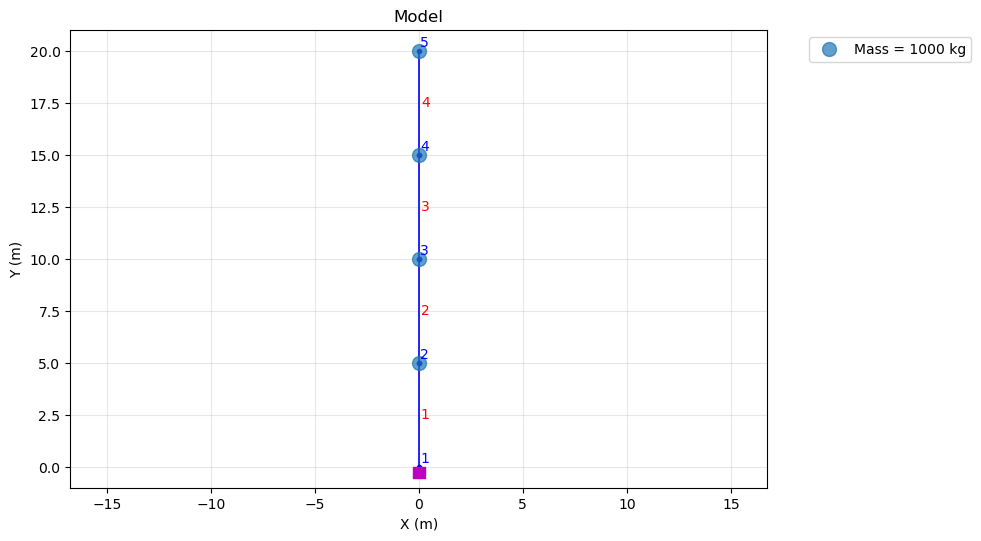

In [339]:
#| output: True
FEM.plot_model()


## Mode Shapes

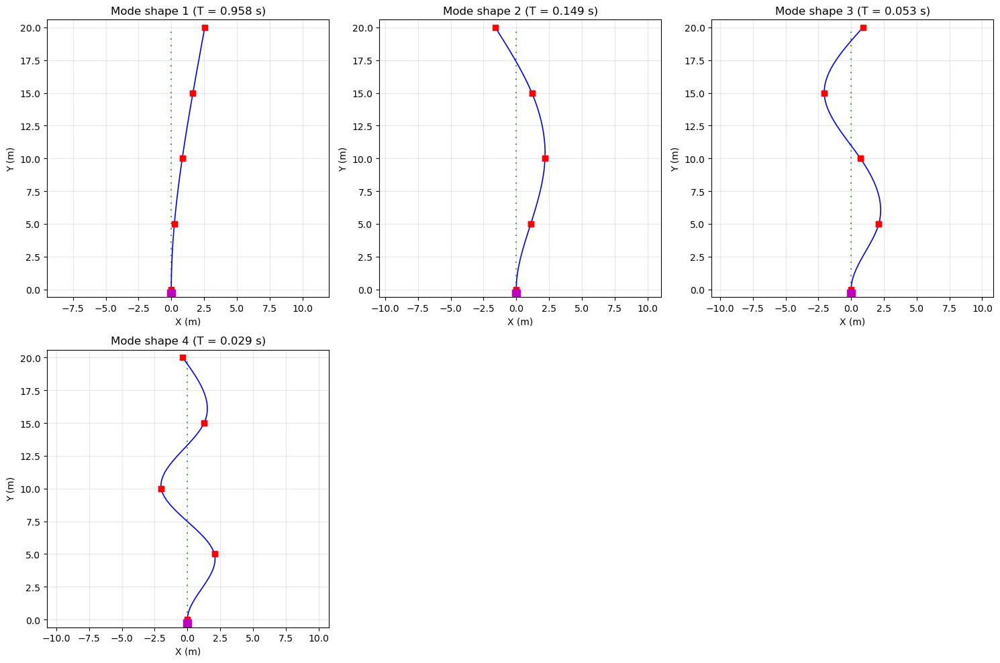

In [340]:
#| output: True

# plot the first 4 mode shapes for the undamaged and damaged cases
FEM.plot_mode_shapes(n_modes=4, scale = 10)

## Damaged scenarios

In [341]:
from python_code.OMA_class import OMA_class
OMA = OMA_class(print_code=False, plot_code=False)

for i in range(2):
    OMA.extract_all_feature_cases(FEM, damage_level=0.5, name="damage_scenarios.npz", save_to_file=False)

# 10**4 evalutions take 32s on my PC with

OMA.true_natural_frequencies, OMA.true_mode_shapes

([array([ 1.04366091,  6.72223044, 18.97871864, 34.1969293 ]),
  array([ 1.04016946,  6.37408214, 16.94141413, 32.69718732]),
  array([ 1.00798185,  5.70080569, 17.35875549, 30.8807843 ]),
  array([ 1.00473399,  5.49341868, 15.90808363, 29.88390605]),
  array([ 0.92507043,  6.23371597, 17.46866929, 29.94624496]),
  array([ 0.92258776,  5.98730864, 15.53564471, 28.45986456]),
  array([ 0.89964709,  5.47467477, 15.84453593, 27.52478695]),
  array([ 0.89730897,  5.30595967, 14.55257746, 26.51025891]),
  array([ 0.81195442,  6.13035947, 17.10851368, 31.24638691]),
  array([ 0.8103798 ,  5.84807262, 15.44423139, 29.33255978]),
  array([ 0.79530858,  5.19322953, 15.73551334, 27.80517814]),
  array([ 0.79379421,  5.01930311, 14.58691439, 26.49373766]),
  array([ 0.75271929,  5.54133756, 15.97818712, 27.94024187]),
  array([ 0.75143744,  5.35573313, 14.35609552, 26.10050471]),
  array([ 0.73921667,  4.8848373 , 14.48859379, 25.43674128]),
  array([ 0.7379797 ,  4.75333473, 13.41998065, 24.1808

Damage scenarios: 
[(0, 0, 0, 0), (0, 0, 0, 1), (0, 0, 1, 0), (0, 0, 1, 1), (0, 1, 0, 0), (0, 1, 0, 1), (0, 1, 1, 0), (0, 1, 1, 1), (1, 0, 0, 0), (1, 0, 0, 1), (1, 0, 1, 0), (1, 0, 1, 1), (1, 1, 0, 0), (1, 1, 0, 1), (1, 1, 1, 0), (1, 1, 1, 1)]
size of theta: 16
Plot of case: (1, 1, 1, 1): 


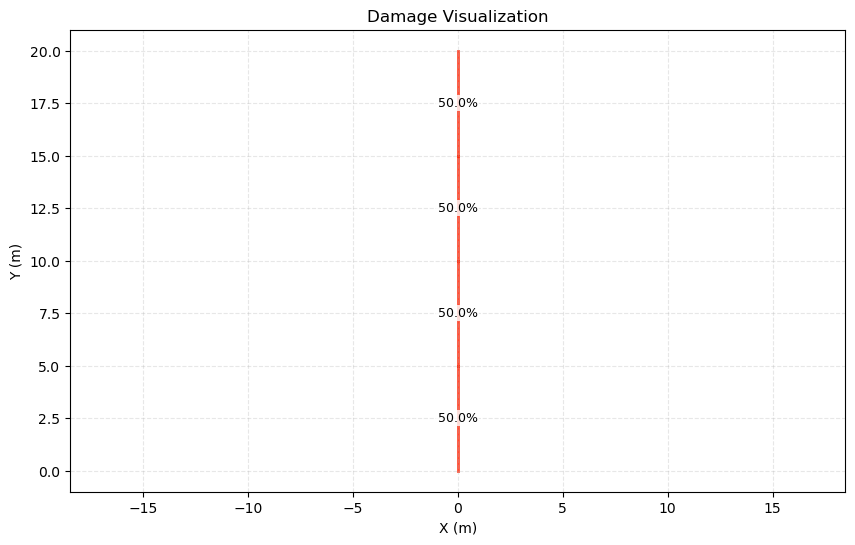

In [342]:
#| output: True

# see the damage scenarios
print(f"Damage scenarios: \n{OMA.theta}")
print(f"size of theta: {len(OMA.theta)}")
print(f"Plot of case: {OMA.theta[-1]}: ")
FEM.plot_damage()


## Sensor configurations

In [343]:
#| echo: true
#| output: true
# nodes  
e_sensor = np.arange(len(X))

# list of fixed nodes
fixed_nodes = [bounds[i][0] for i in range(len(bounds))]

# remove fixed nodes
e_sensor = e_sensor[~np.isin(e_sensor, fixed_nodes)] # ~ is the logical NOT operator, which inverts the boolean array returned by np.isin
print(f"Sensor nodes: {e_sensor}")

# make an list whit all possible combinations of sensor placements
import itertools # generate the solution space of all possible combinations.
# e_configuration = list(itertools.combinations(e_sensor.tolist(), 3))
e_configuration =  np.array(list(itertools.product([0, 1], repeat=len(e_sensor)))) # all combinations of 0 and 1 for each sensor node
e_configuration = e_configuration 
print(f"Number of sensor configurations: {len(e_configuration)}")
for i in range(len(e_configuration)):
    print(f"Configuration {i} given in nodes with sensors: {e_configuration[i]}")

Sensor nodes: [1 2 3 4]
Number of sensor configurations: 16
Configuration 0 given in nodes with sensors: [0 0 0 0]
Configuration 1 given in nodes with sensors: [0 0 0 1]
Configuration 2 given in nodes with sensors: [0 0 1 0]
Configuration 3 given in nodes with sensors: [0 0 1 1]
Configuration 4 given in nodes with sensors: [0 1 0 0]
Configuration 5 given in nodes with sensors: [0 1 0 1]
Configuration 6 given in nodes with sensors: [0 1 1 0]
Configuration 7 given in nodes with sensors: [0 1 1 1]
Configuration 8 given in nodes with sensors: [1 0 0 0]
Configuration 9 given in nodes with sensors: [1 0 0 1]
Configuration 10 given in nodes with sensors: [1 0 1 0]
Configuration 11 given in nodes with sensors: [1 0 1 1]
Configuration 12 given in nodes with sensors: [1 1 0 0]
Configuration 13 given in nodes with sensors: [1 1 0 1]
Configuration 14 given in nodes with sensors: [1 1 1 0]
Configuration 15 given in nodes with sensors: [1 1 1 1]


## Modal parameters

In [344]:
load = np.load("data/damage_scenarios.npz")
print("Damage scenarios:")
for key in load:
    print(key)

Damage scenarios:
combinations
periods
natural_frequencies
mode_shapes
damage_level


In [345]:
load["natural_frequencies"].shape

(16, 4)

In [346]:
#| output: True
print("damgae levels:", load["damage_level"])

# print the first 4 natural frequencies for the undamaged and damaged cases
print("Undamaged case:")
print("Natural frequencies (Hz = s^-1):", load["natural_frequencies"][0, :24])

print("\nDamaged cases:")
print("Natural frequencies (Hz = s^-1):")
print(load["natural_frequencies"][1:, :4])

damgae levels: 0.3
Undamaged case:
Natural frequencies (Hz = s^-1): [ 1.04366091  6.72223044 18.97871864 34.1969293 ]

Damaged cases:
Natural frequencies (Hz = s^-1):
[[ 1.04216338  6.56894051 17.97260186 33.36640405]
 [ 1.02799282  6.20647943 18.19002272 32.52728664]
 [ 1.02654082  6.08678703 17.35734585 31.84512003]
 [ 0.9876046   6.48179787 18.17156891 32.0975739 ]
 [ 0.98632241  6.35293945 17.19574029 31.27577051]
 [ 0.97420484  6.04205401 17.36939322 30.69378986]
 [ 0.97295864  5.93749723 16.57569948 30.01492728]
 [ 0.92280709  6.40000981 18.06925207 32.60328291]
 [ 0.92179618  6.26272527 17.16269637 31.66438994]
 [ 0.91208959  5.90803922 17.33299977 30.91652302]
 [ 0.91110134  5.79986249 16.58856536 30.14137201]
 [ 0.88355697  6.12967195 17.36389673 30.78595305]
 [ 0.88266002  6.0165504  16.47636762 29.86645007]
 [ 0.87406728  5.71685271 16.596748   29.37136892]
 [ 0.87318936  5.6242215  15.87873525 28.61120378]]


In [347]:
#| echo: true
#| output: true
"""Only horizontal dof's and then normalize the mode shapes"""
# normiles the node shapes 
mode_shapes = load["mode_shapes"][:, :, 0::3].astype(float)


# Remove fixed nodes from mode_shapes (last axis = node index)
mode_shapes = mode_shapes[:, :, e_sensor]
print(f"Kept sensor nodes in mode_shapes: {e_sensor}")


# Normalize each mode shape by its maximum absolute value
max_abs = np.max(np.abs(mode_shapes), axis=-1, keepdims=True)
max_abs[max_abs == 0] = 1
mode_shapes = mode_shapes / max_abs


# 
mode_shapes.shape, mode_shapes[0, :]

Kept sensor nodes in mode_shapes: [1 2 3 4]


((16, 4, 4),
 array([[ 0.09252781,  0.32807894,  0.64695444,  1.        ],
        [ 0.50514687,  1.        ,  0.54397217, -0.72646916],
        [ 1.        ,  0.33469417, -0.97230886,  0.42654924],
        [ 1.        , -0.96793156,  0.61740502, -0.17421531]]))

# Generate data (Step 1)

## Prior distibution

::: {.notes}
I have chosen to use uniformed priors for the damage states? 
:::

In [348]:
#| echo: fallse
#| output: true
H_1 = 0.01
H_0 = 1-H_1

# uninformed prior
N_prior = 2**4
prior_H = np.array([H_0, H_1])
prior_theta = np.concatenate(([H_0], np.repeat(H_1 / (N_prior - 1), N_prior - 1)))

print(f"Prior probabilities for H: {prior_H}")
print(f"\nPrior probabilities for θ: {np.round(prior_theta, 4)}")

Prior probabilities for H: [0.99 0.01]

Prior probabilities for θ: [9.9e-01 7.0e-04 7.0e-04 7.0e-04 7.0e-04 7.0e-04 7.0e-04 7.0e-04 7.0e-04
 7.0e-04 7.0e-04 7.0e-04 7.0e-04 7.0e-04 7.0e-04 7.0e-04]


## f($\delta E$)

I am intrested in probability distributions in the interval [0,1].

- [Beta distribution](https://en.wikipedia.org/wiki/Beta_distribution), [np.random.beta](https://numpy.org/doc/stable/reference/random/generated/numpy.random.beta.html#numpy.random.beta), [scipy.stats.beta](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.beta.html#scipy.stats.beta)

<!-- Beta PDF:
$$
f(x; \alpha, \beta) = \frac{x^{\alpha-1} (1-x)^{\beta-1}}{B(\alpha, \beta)}
$$

where:

- $\beta$ is the beta function, defined as $B(\alpha, \beta) = \frac{\Gamma(\alpha) \Gamma(\beta)}{\Gamma(\alpha + \beta)}$
- $\Gamma$ is the gamma function.

Stiffness reduction probability distribution: 

- $a = 1$ and $b= 1$ (uniform distribution, mean = 0.5, high probability at tails)
- $a = 4$ and $b= 4$ (symmetric, mean = 0.5, low probability at tails)
- $a = 4$ and $b= 10$ (mean < 0.5, low probability at tails) -->

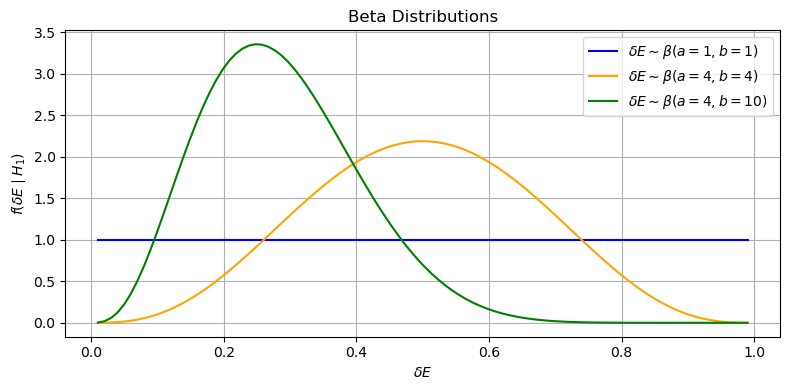

In [349]:
#| echo: false
#| output: true
from scipy.stats import beta as beta_dist

error = 0.01
error = 0.01
x = np.linspace(0+error, 1-error, 100)

plt.figure(figsize=(8,4))
plt.plot(x, beta_dist.pdf(x, a = 1, b = 1), label=r'$\delta E \sim \beta(a=1, b=1)$', color='blue')
plt.plot(x, beta_dist.pdf(x, a = 4, b = 4), label=r'$\delta E \sim \beta(a=4, b=4)$', color='orange')
plt.plot(x, beta_dist.pdf(x, a = 4, b = 10), label=r'$\delta E \sim \beta(a=4, b=10)$', color='green')
plt.xlabel(r'$\delta E$')
plt.ylabel(r'$f(\delta E \mid H_1)$')
plt.title('Beta Distributions')
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()


## Covariance matrix OMA error

- I assume that the coefficient of variation is 0.01 for the natural frequency estimations. 
- I also assume that the standard deviations is 0.1 for mode shape estimation.

::: {.callout-note title="Note"}
this coficient of variation and standard deviation is what i expect for an vell deifined Sensor configuration.
:::



In [350]:
#| echo: false
#| output: true
from python_code.BR_class import BR

# frequencyes and mode shapes
omega_all = load["natural_frequencies"]
phi_all = mode_shapes

# Coefficient of variation (CV)
CV_omega = 0.01*1.3
sigma_phi = 0.1*1.3

# Prior probabilities for the states (theta)
prior_theta = prior_theta 

# Number of Samples 
N = 10**4

# Instantiate the BR class
BRinf = BR(omega_all, phi_all, CV_omega, sigma_phi, prior_theta, N)

# construct the covariance matrix 
S = np.array( [1, 1, 1, 1])

BRinf.covariance_matrix(S)
BRinf.cov.diagonal(),
np.sqrt(BRinf.cov.diagonal())

array([0.01095177, 0.06061032, 0.16487293, 0.29009585, 0.1049361 ,
       0.1049361 , 0.1049361 , 0.1049361 , 0.090164  , 0.090164  ,
       0.090164  , 0.090164  , 0.08687253, 0.08687253, 0.08687253,
       0.08687253, 0.08483097, 0.08483097, 0.08483097, 0.08483097])

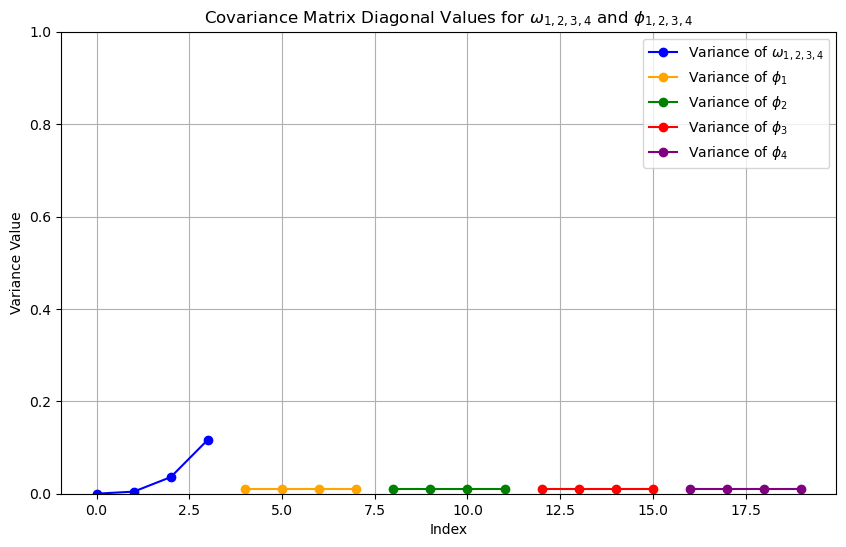

In [351]:
#| echo: false
#| output: true
S = np.array( [1, 1, 1, 1])
CV_omega_data = 0.01 # use *1.3 for the real model 
std_omega_data = 0.1

# frequencyes and mode shapes
omega_all = load["natural_frequencies"]
phi_all = mode_shapes



cov_dig = (np.concatenate([
    omega_all[0] * CV_omega_data,
    np.repeat(np.ones(np.sum(S, dtype=int)) * std_omega_data, np.sum(S, dtype=int))
]))**2

covariance_matrix = np.diag(cov_dig)

# plot the covariance matrix

plt.figure(figsize=(10, 6))
plt.title(r'Covariance Matrix Diagonal Values for $\omega_{1,2,3,4}$ and $\phi_{1,2,3,4}$')
plt.plot(covariance_matrix.diagonal()[:omega_all.shape[1]], marker='o', label=r'Variance of $\omega_{1,2,3,4}$', color='blue')
plt.plot(range(omega_all.shape[1], omega_all.shape[1] +np.sum(S, dtype=int)), covariance_matrix.diagonal()[omega_all.shape[1]:omega_all.shape[1] + np.sum(S, dtype=int)], marker='o', label=r'Variance of $\phi_1$', color='orange')
plt.plot(range(omega_all.shape[1] + np.sum(S, dtype=int), omega_all.shape[1] + 2* np.sum(S, dtype=int)), covariance_matrix.diagonal()[omega_all.shape[1] + np.sum(S, dtype=int):omega_all.shape[1] + 2* np.sum(S, dtype=int)], marker='o', label=r'Variance of $\phi_2$', color='green')
plt.plot(range(omega_all.shape[1] + 2* np.sum(S, dtype=int), omega_all.shape[1] + 3* np.sum(S, dtype=int)), covariance_matrix.diagonal()[omega_all.shape[1] + 2* np.sum(S, dtype=int):omega_all.shape[1] + 3* np.sum(S, dtype=int)], marker='o', label=r'Variance of $\phi_3$', color='red')
plt.plot(range(omega_all.shape[1] + 3* np.sum(S, dtype=int), omega_all.shape[1] + 4* np.sum(S, dtype=int)), covariance_matrix.diagonal()[omega_all.shape[1] + 3* np.sum(S, dtype=int):omega_all.shape[1] + 4* np.sum(S, dtype=int)], marker='o', label=r'Variance of $\phi_4$', color='purple')
plt.xlabel('Index')
plt.ylabel('Variance Value')
plt.ylim(0, 1)
plt.legend()
plt.grid()
plt.show()

## Delta E to modal parameters mapping

- Generate data form the FEM model

In [352]:
omega_all.shape, phi_all.shape

((16, 4), (16, 4, 4))

In [353]:
#| echo: true
# code_run = True
code_run = False
N= 10**4
# generate delta E samples from the beta distribution
# delta_E_samples = np.random.beta(a=1, b=1, size=N)
delta_E_samples = np.linspace(0, 0.99999, N) # use a grid of delta E values instead of random samples for better visualization
if code_run:

    from python_code.OMA_class import OMA_class
    OMA = OMA_class(print_code=False, plot_code=False)

    omega_samples = np.zeros((N, omega_all.shape[0], omega_all.shape[1]))
    phi_samples = np.zeros((N, phi_all.shape[0], phi_all.shape[1], phi_all.shape[2]))

    for i in range(N):
        OMA.extract_all_feature_cases(FEM, damage_level=delta_E_samples[i], name="damage_scenarios.npz", save_to_file=False)
        omega_samples[i, :] = OMA.true_natural_frequencies
        # (OMA.true_mode_shapes[:, :, 0::3].astype(float))[:, :, e_sensor]
        true_mode_shapes = np.asarray(OMA.true_mode_shapes, dtype=float)
        mode_shapes = true_mode_shapes[:, :, 0::3][:, :, e_sensor]
        # Normalize each mode shape by its maximum absolute value
        max_abs = np.max(np.abs(mode_shapes), axis=-1, keepdims=True)
        max_abs[max_abs == 0] = 1
        mode_shapes = mode_shapes / max_abs

        phi_samples[i, :, :, :] = mode_shapes

    # 10**4 evalutions take 33.5s on my PC with
    # save omega_samples and phi_samples to a file for later use
    np.savez("data/omega_phi_samples_deltaE.npz", omega_samples=omega_samples, phi_samples=phi_samples)

# load omega_samples and phi_samples from file
data = np.load("data/omega_phi_samples_deltaE.npz")
omega_samples = data["omega_samples"]
phi_samples = data["phi_samples"]


# OMA.true_natural_frequencies, OMA.true_mode_shapes


In [354]:
OMA.theta

[(0, 0, 0, 0),
 (0, 0, 0, 1),
 (0, 0, 1, 0),
 (0, 0, 1, 1),
 (0, 1, 0, 0),
 (0, 1, 0, 1),
 (0, 1, 1, 0),
 (0, 1, 1, 1),
 (1, 0, 0, 0),
 (1, 0, 0, 1),
 (1, 0, 1, 0),
 (1, 0, 1, 1),
 (1, 1, 0, 0),
 (1, 1, 0, 1),
 (1, 1, 1, 0),
 (1, 1, 1, 1)]

### Data visualization omega {.level2}

- discontinuous functions for mode 4

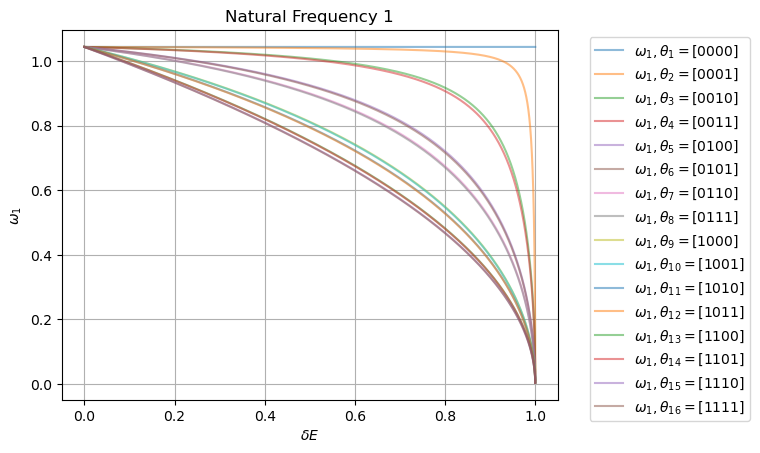

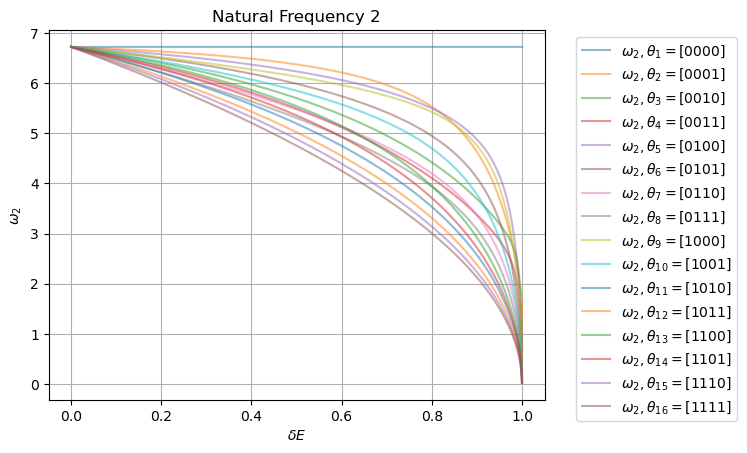

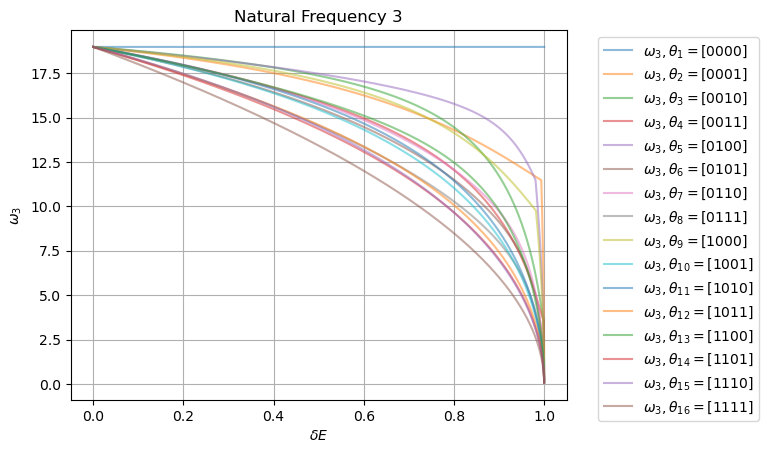

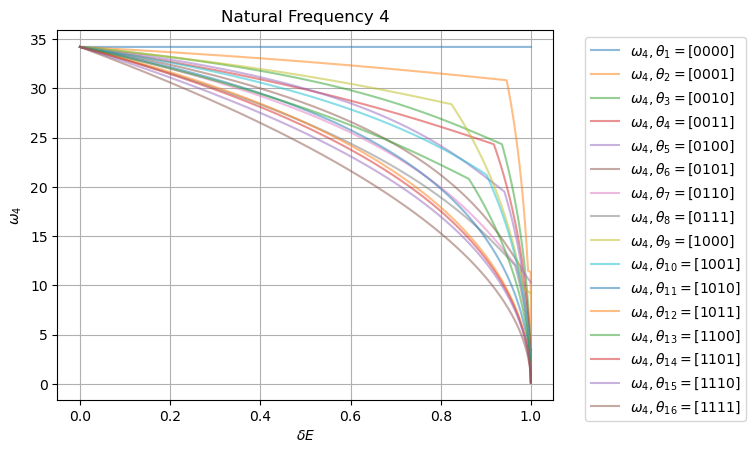

In [355]:
#| echo: false
#| output: true

## make an plot for all variables ass an function of delta E in the x axsis and the variable in the y axisis? 

# sort delta_e_samples form lovest to higest and sort omega in the same way
index = np.argsort(delta_E_samples)
delta_E_samples_sorted = delta_E_samples[index]
for i in range(omega_samples.shape[2]):
    plt.figure()
    for ii in range(omega_samples.shape[1]):
        plt.plot(delta_E_samples_sorted, omega_samples[:, ii, i][index], alpha=0.5, label=fr'$\omega_{i+1}, \theta_{{{ii+1}}} = {e_configuration[ii]}$')

    plt.xlabel(r'$\delta E$')
    plt.ylabel(fr'$\omega_{i+1}$')
    plt.title(f'Natural Frequency {i+1}')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid()
    plt.show()

### Data visualization Mode shape 1 {.level2}

- See the collapse of the natural frequencies for modeshape 4 in damage scenario [2-10, 13]

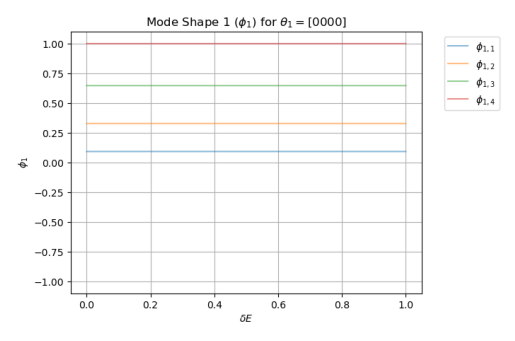

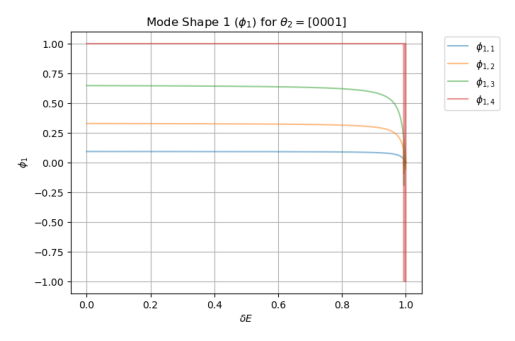

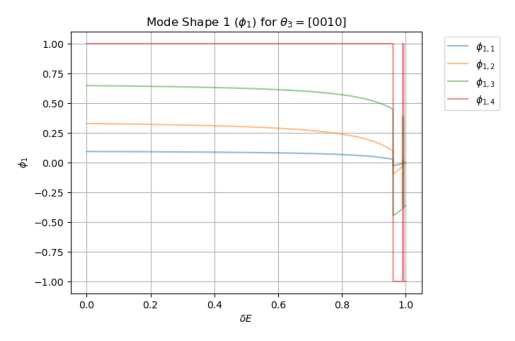

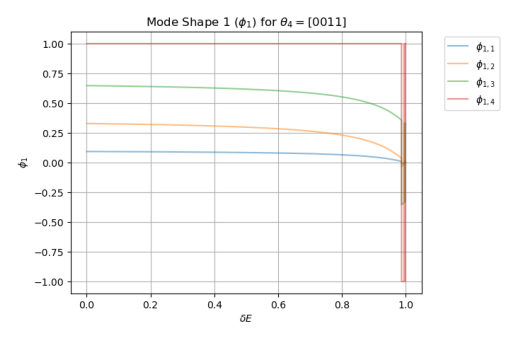

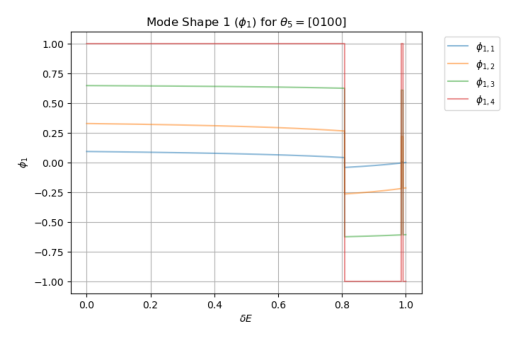

...

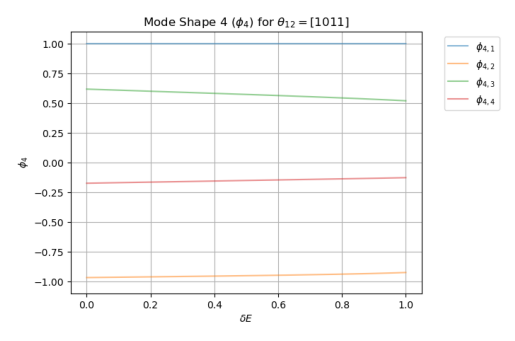

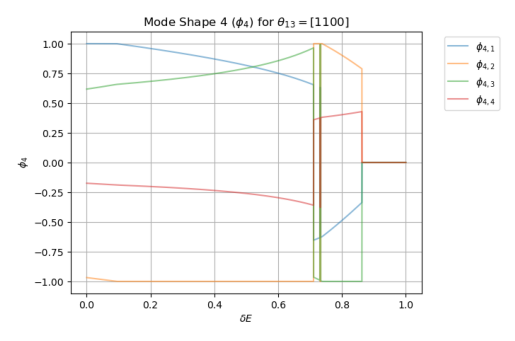

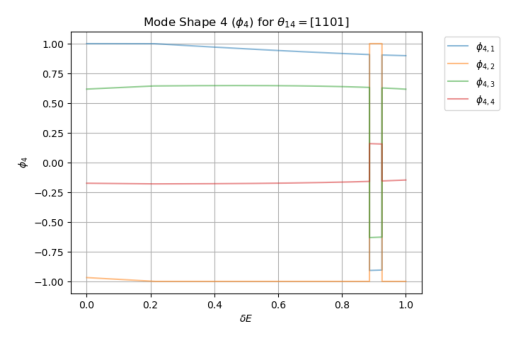

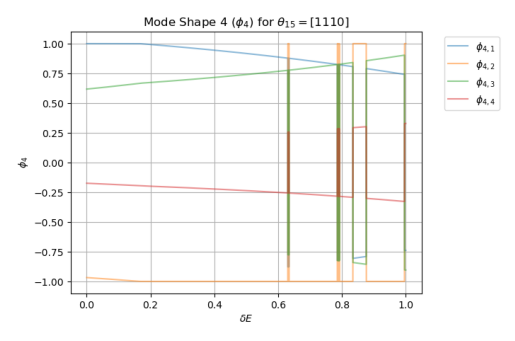

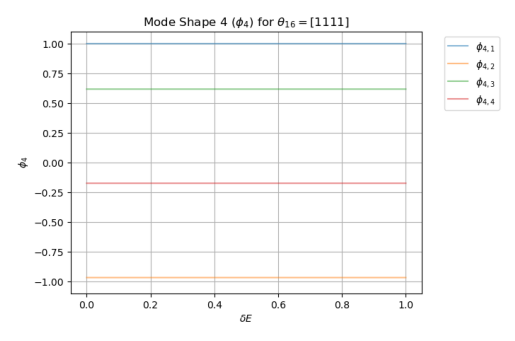

In [356]:
#| echo: false
#| output: true
# code_run = True
code_run = False 
if code_run:
    # sort delta_e_samples form lovest to higest and sort omega in the same way
    mode = 0
    index = np.argsort(delta_E_samples)
    delta_E_samples_sorted = delta_E_samples[index]
    for i in range(phi_samples.shape[1]): # 
        plt.figure()
        for ii in range(phi_samples.shape[2]): # phi
            plt.plot(delta_E_samples_sorted, phi_samples[:, i, mode, ii][index], alpha=0.5, label=fr'$\phi_{{{mode+1},{ii+1}}}$')
        
        plt.xlabel(r'$\delta E$')
        plt.ylabel(fr'$\phi_{mode+1}$')
        plt.title(fr'Mode Shape {mode+1} ($\phi_{{{mode+1}}}$) for $\theta_{{{i+1}}} = {e_configuration[i]}$')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.ylim(-1.1, 1.1)
        plt.grid()
        plt.savefig(f"data/plots/phi_mode_{mode+1}_theta_{i+1}_vs_deltaE.png", bbox_inches='tight')
        plt.show()


    # sort delta_e_samples form lovest to higest and sort omega in the same way
    mode = 1
    index = np.argsort(delta_E_samples)
    delta_E_samples_sorted = delta_E_samples[index]
    for i in range(phi_samples.shape[1]): # 
        plt.figure()
        for ii in range(phi_samples.shape[2]): # phi
            plt.plot(delta_E_samples_sorted, phi_samples[:, i, mode, ii][index], alpha=0.5, label=fr'$\phi_{{{mode+1},{ii+1}}}$')
        
        plt.xlabel(r'$\delta E$')
        plt.ylabel(fr'$\phi_{mode+1}$')
        plt.title(fr'Mode Shape {mode+1} ($\phi_{{{mode+1}}}$) for $\theta_{{{i+1}}} = {e_configuration[i]}$')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.ylim(-1.1, 1.1)
        plt.grid()
        plt.savefig(f"data/plots/phi_mode_{mode+1}_theta_{i+1}_vs_deltaE.png", bbox_inches='tight')
        plt.show()


    # sort delta_e_samples form lovest to higest and sort omega in the same way
    mode = 2
    index = np.argsort(delta_E_samples)
    delta_E_samples_sorted = delta_E_samples[index]
    for i in range(phi_samples.shape[1]): # 
        plt.figure()
        for ii in range(phi_samples.shape[2]): # phi
            plt.plot(delta_E_samples_sorted, phi_samples[:, i, mode, ii][index], alpha=0.5, label=fr'$\phi_{{{mode+1},{ii+1}}}$')
        
        plt.xlabel(r'$\delta E$')
        plt.ylabel(fr'$\phi_{mode+1}$')
        plt.title(fr'Mode Shape {mode+1} ($\phi_{{{mode+1}}}$) for $\theta_{{{i+1}}} = {e_configuration[i]}$')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.ylim(-1.1, 1.1)
        plt.grid()
        plt.savefig(f"data/plots/phi_mode_{mode+1}_theta_{i+1}_vs_deltaE.png", bbox_inches='tight')
        plt.show()

    # sort delta_e_samples form lovest to higest and sort omega in the same way
    mode = 3
    index = np.argsort(delta_E_samples)
    delta_E_samples_sorted = delta_E_samples[index]
    for i in range(phi_samples.shape[1]): # 
        plt.figure()
        for ii in range(phi_samples.shape[2]): # phi
            plt.plot(delta_E_samples_sorted, phi_samples[:, i, mode, ii][index], alpha=0.5, label=fr'$\phi_{{{mode+1},{ii+1}}}$')
        
        plt.xlabel(r'$\delta E$')
        plt.ylabel(fr'$\phi_{mode+1}$')
        plt.title(fr'Mode Shape {mode+1} ($\phi_{{{mode+1}}}$) for $\theta_{{{i+1}}} = {e_configuration[i]}$')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.ylim(-1.1, 1.1)
        plt.grid()
        plt.savefig(f"data/plots/phi_mode_{mode+1}_theta_{i+1}_vs_deltaE.png", bbox_inches='tight')
        plt.show()
else:
    # plot the saved plots
    for mode in range(4):
        for i in range(phi_samples.shape[1]):
            plt.figure()
            img = plt.imread(f"data/plots/phi_mode_{mode+1}_theta_{i+1}_vs_deltaE.png")
            plt.imshow(img)
            plt.axis('off')
            plt.show()


### MAC mode to mode {.level2}

- MAC of mode 4 to 4 colapse in damage scenario [2-10, 13]

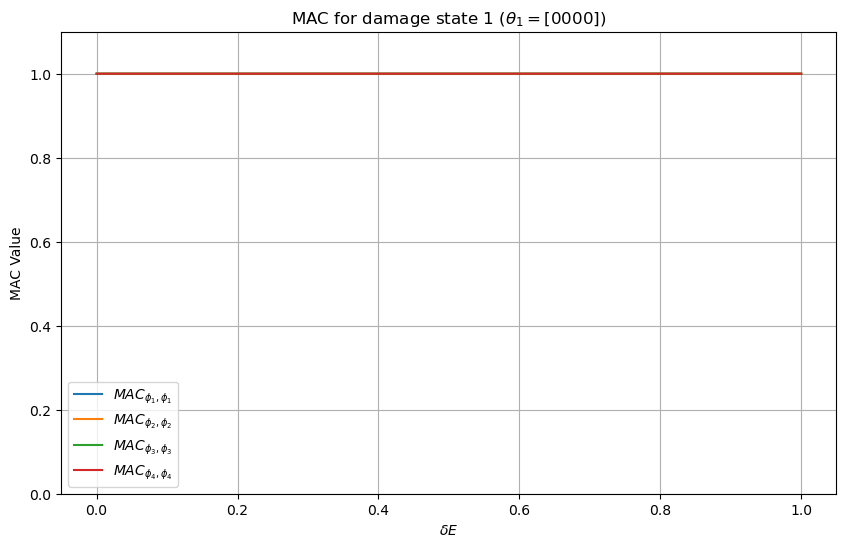

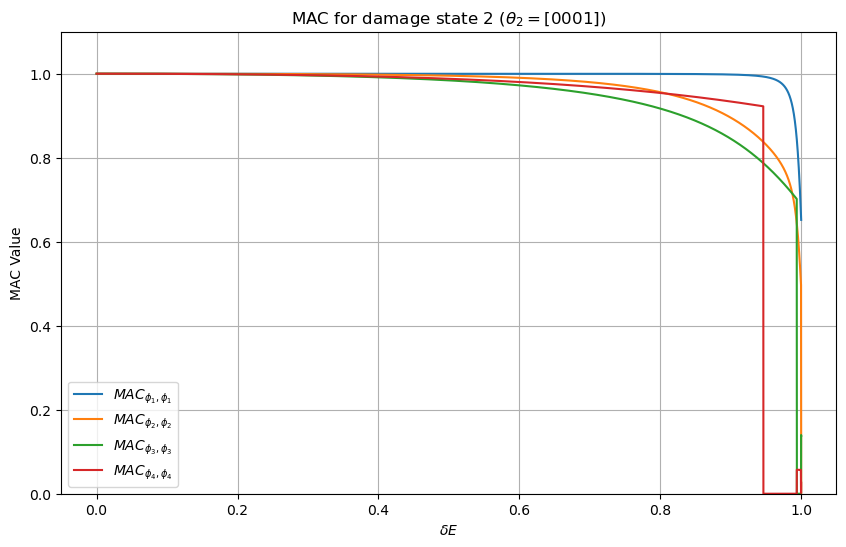

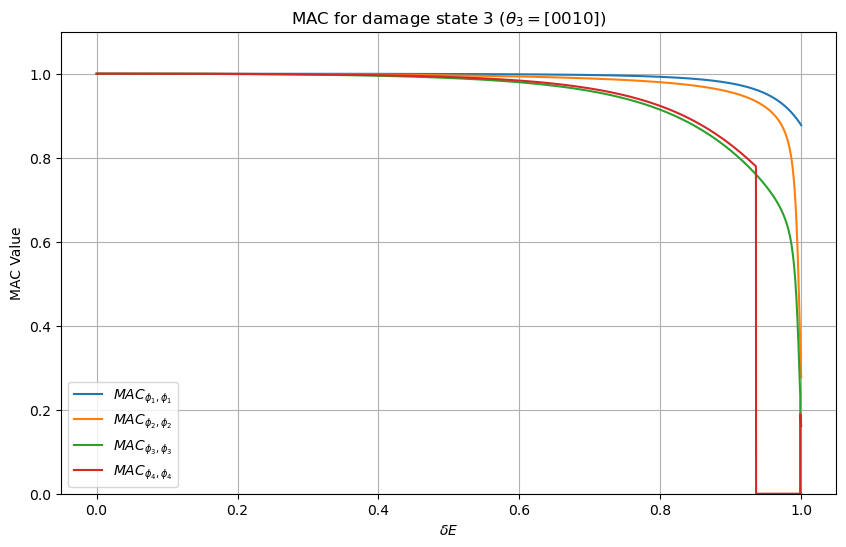

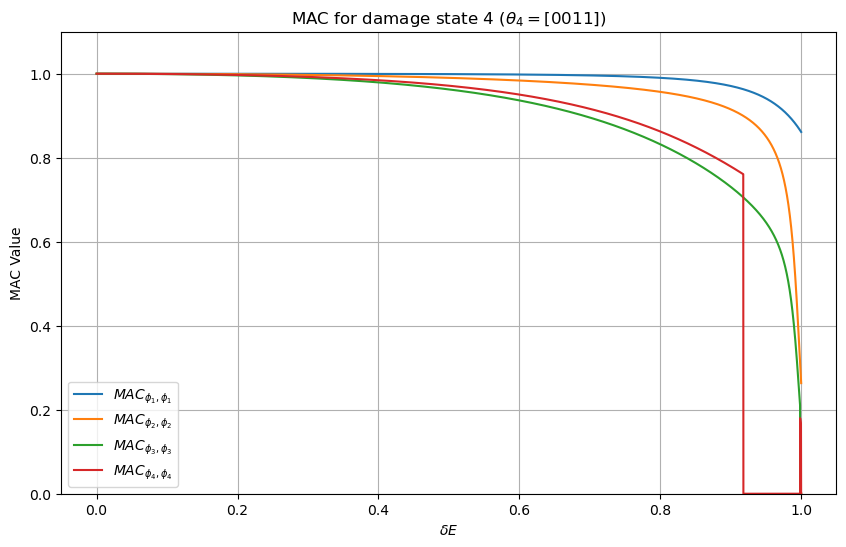

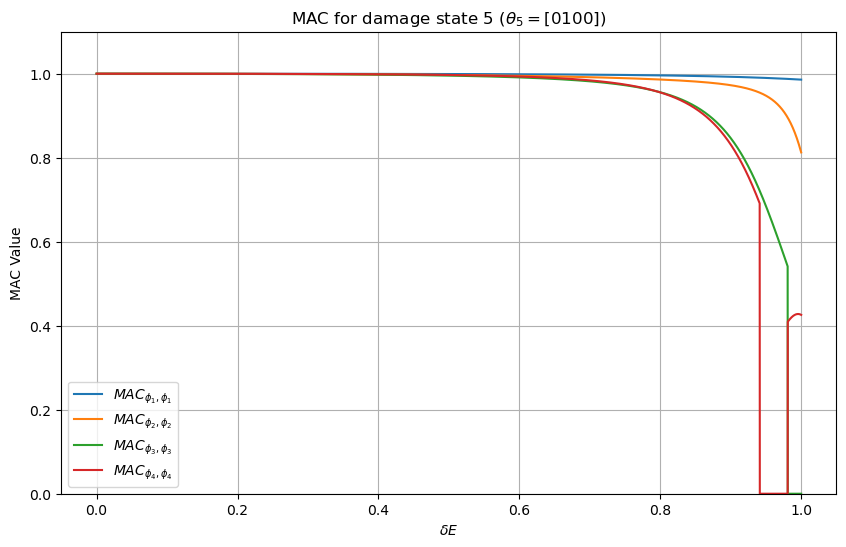

...

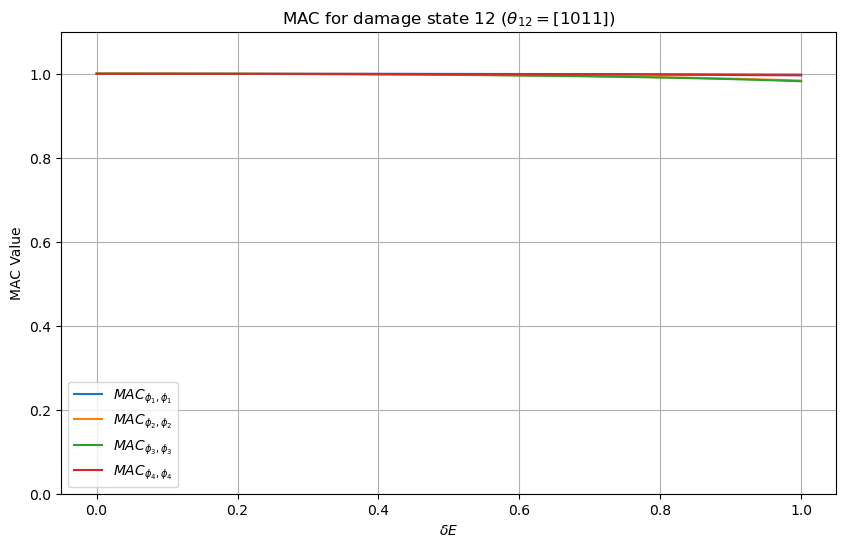

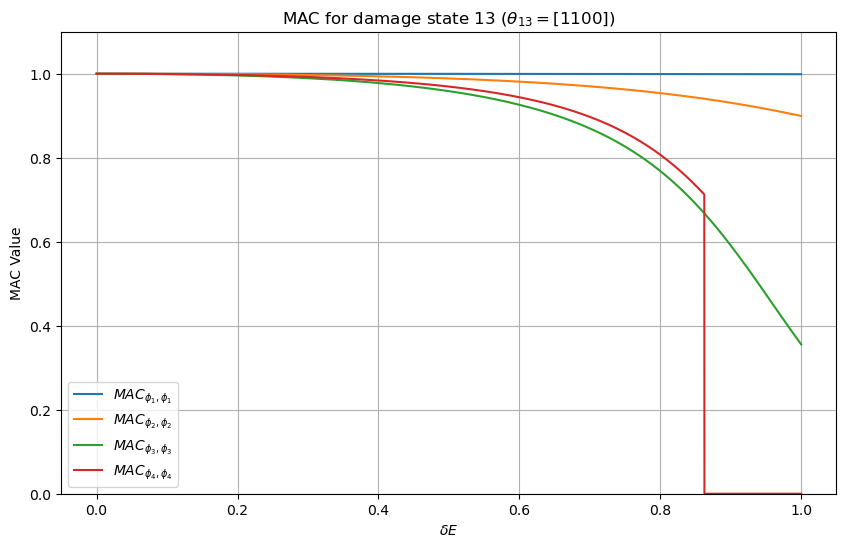

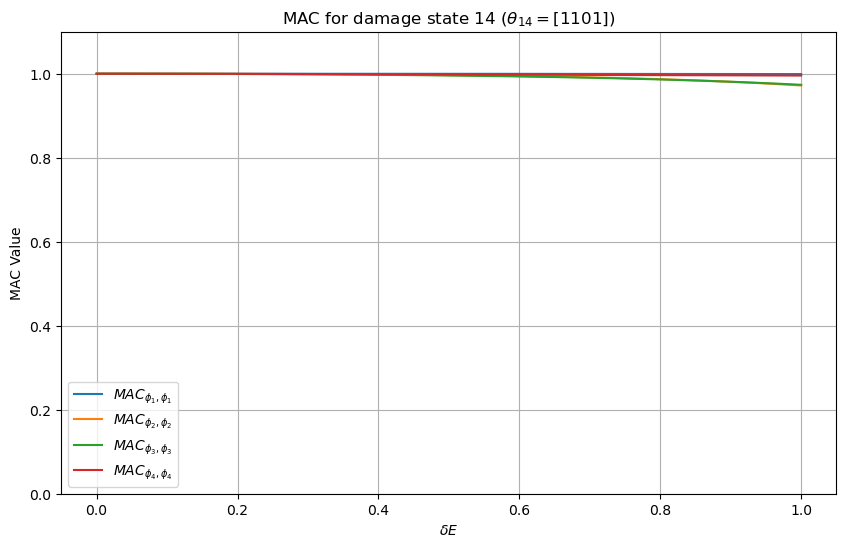

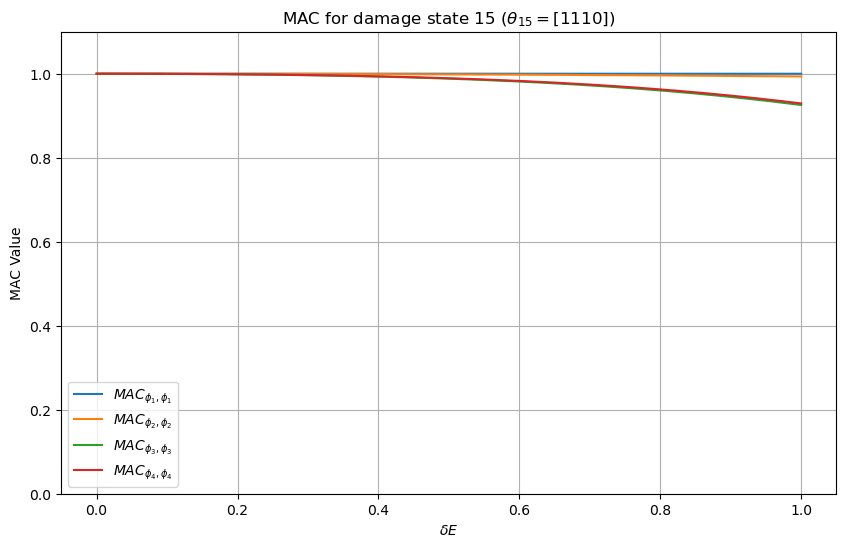

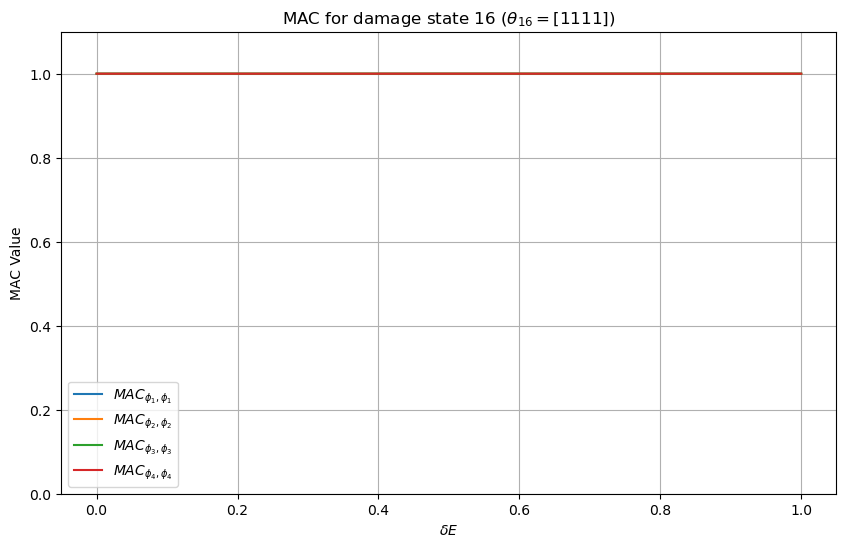

In [357]:
#| echo: false
#| output: true
for i in range(phi_samples.shape[1]):

    theta_now = i
    MAC_11 = np.array( [BRinf.MAC(phi_samples[0,0,0], val) for val in phi_samples[:,theta_now,0]])[index]
    MAC_22 = np.array( [BRinf.MAC(phi_samples[0,0,1], val) for val in phi_samples[:,theta_now,1]])[index]
    MAC_33 = np.array( [BRinf.MAC(phi_samples[0,0,2], val) for val in phi_samples[:,theta_now,2]])[index]
    MAC_44 = np.array( [BRinf.MAC(phi_samples[0,0,3], val) for val in phi_samples[:,theta_now,3]])[index]



    plt.figure(figsize=(10, 6))
    plt.plot(delta_E_samples_sorted, MAC_11, label=r'$MAC_{{\phi_1, \phi_1}}$')
    plt.plot(delta_E_samples_sorted, MAC_22, label=r'$MAC_{{\phi_2, \phi_2}}$')
    plt.plot(delta_E_samples_sorted, MAC_33, label=r'$MAC_{{\phi_3, \phi_3}}$')
    plt.plot(delta_E_samples_sorted, MAC_44, label=r'$MAC_{{\phi_4, \phi_4}}$')
    plt.xlabel(r'$\delta E$')
    plt.ylabel('MAC Value')
    plt.title(fr'MAC for damage state {theta_now+1} ($\theta_{{{theta_now+1}}} = {e_configuration[theta_now]}$)')
    plt.ylim(0, 1.1)
    plt.grid()
    plt.legend()
    plt.show()

### TMAC {.level2}

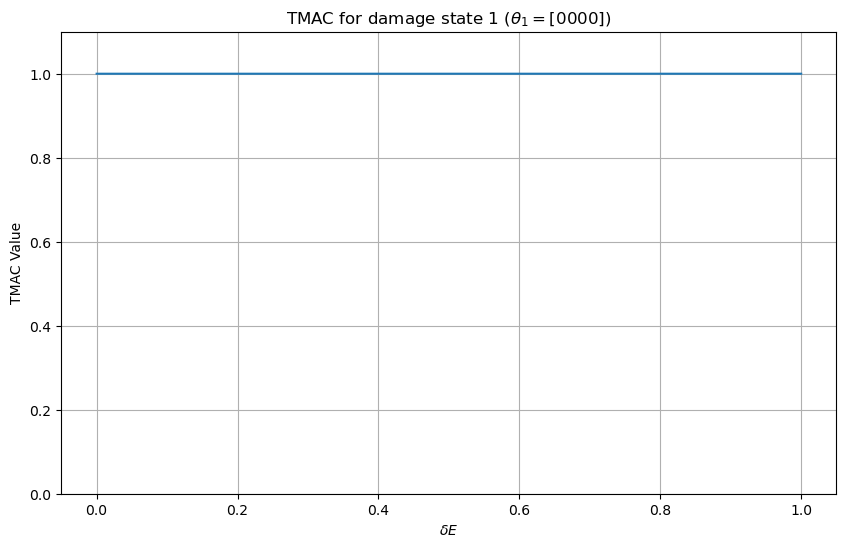

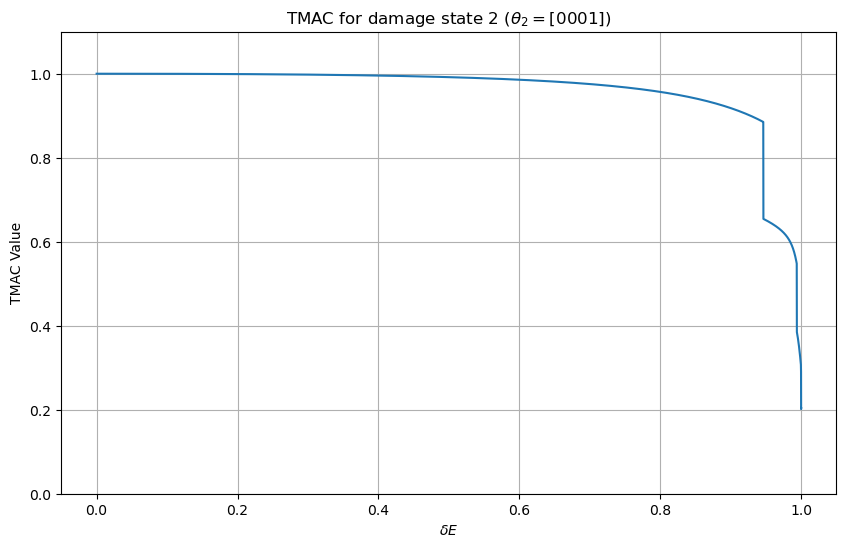

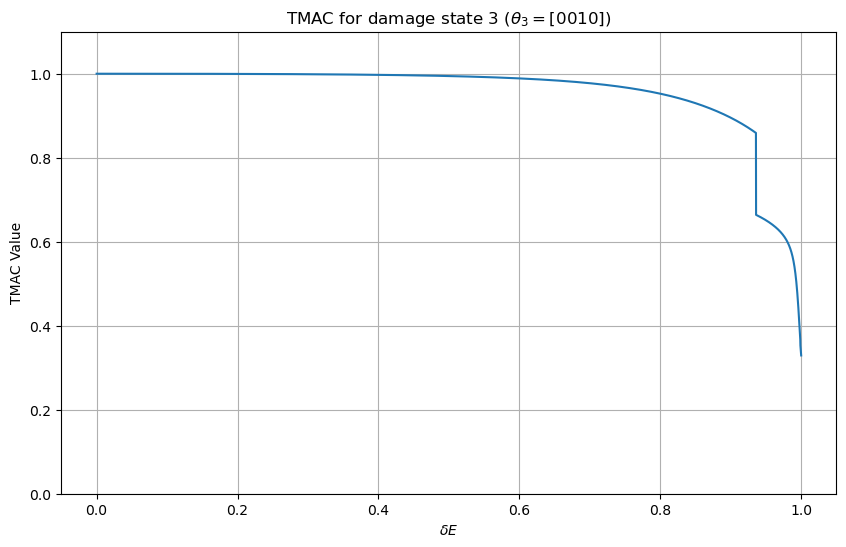

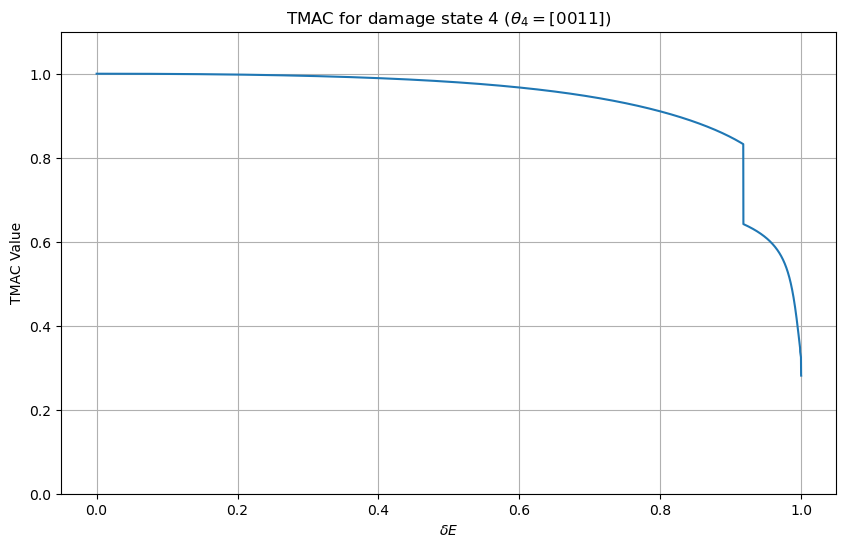

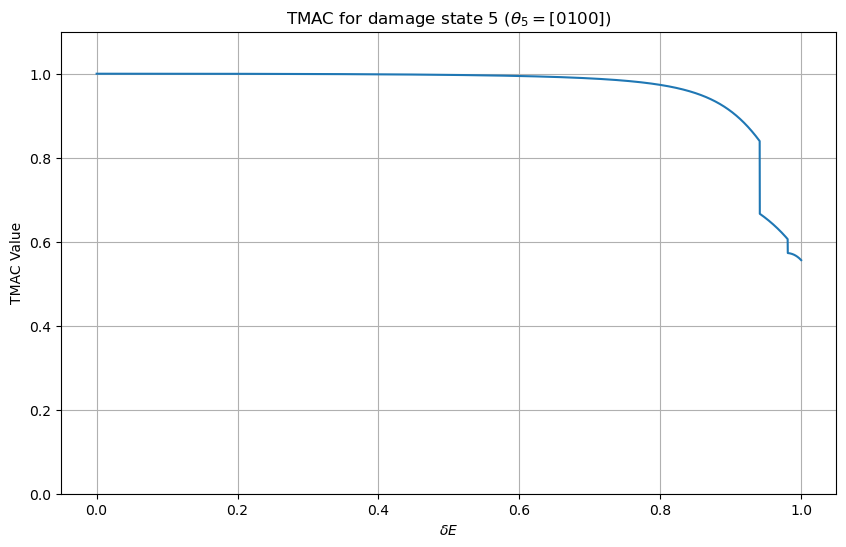

...

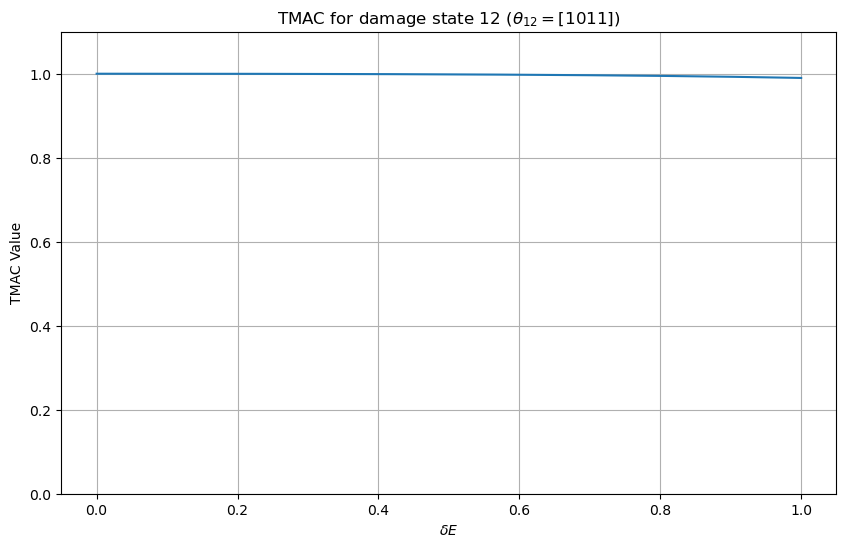

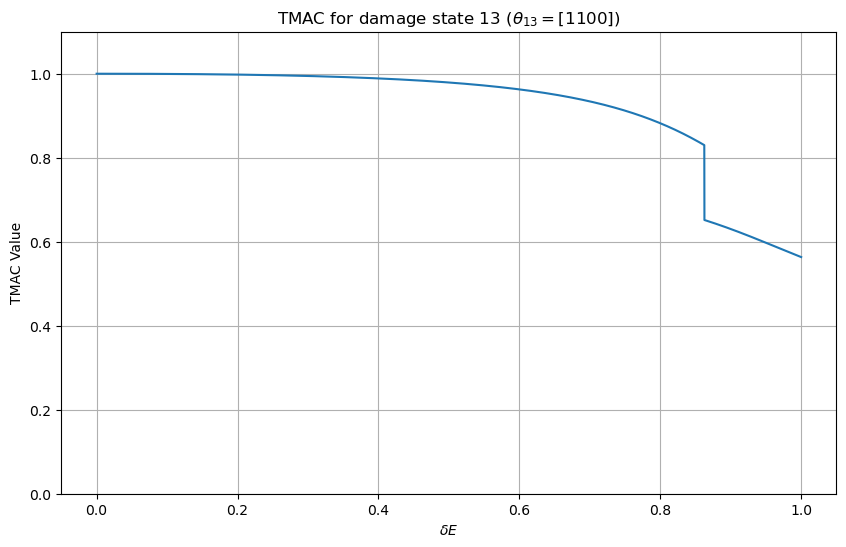

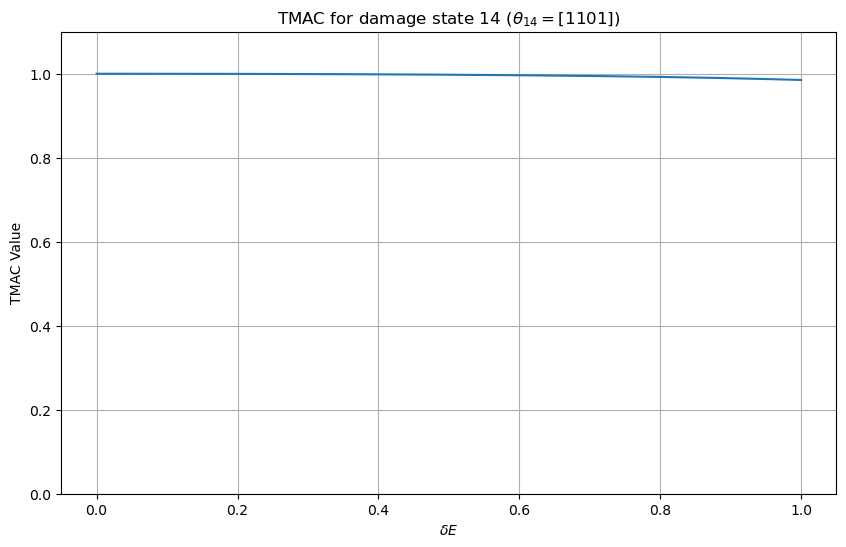

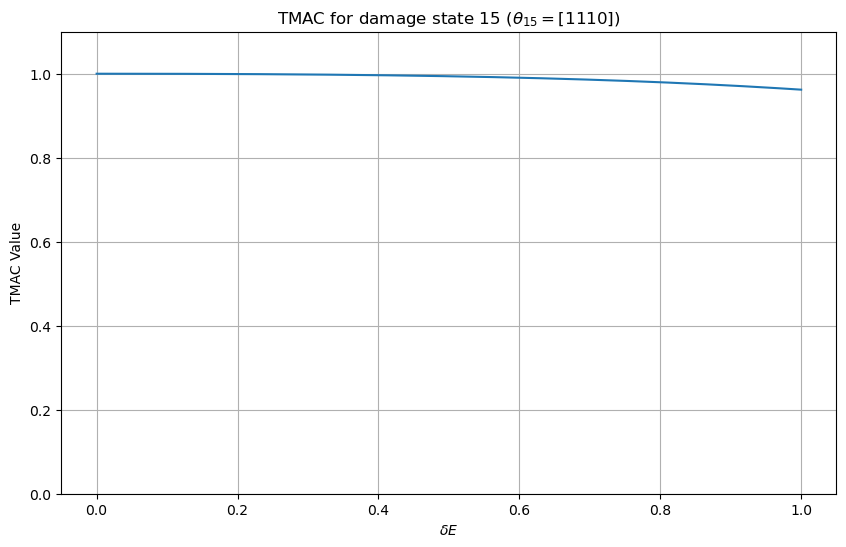

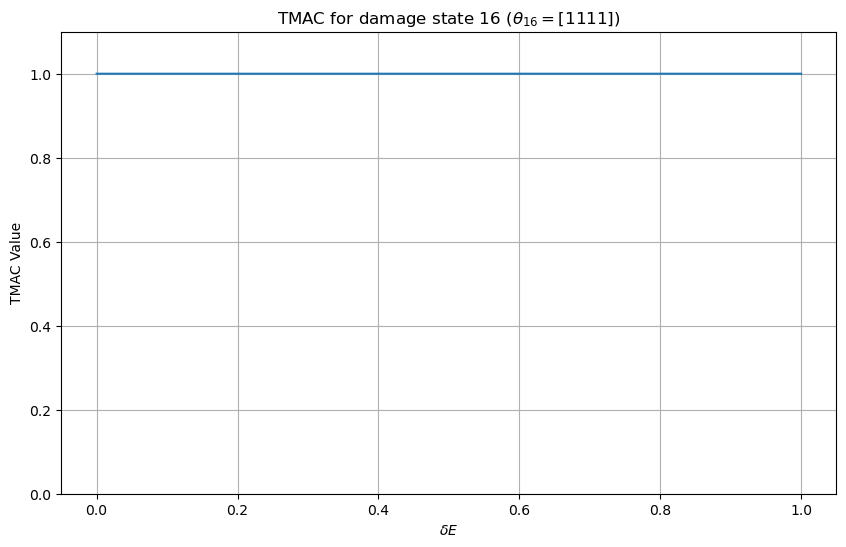

In [358]:
#| echo: false
#| output: true
for i in range(phi_samples.shape[1]):

    theta_now = i
    TMAC = np.array( [BRinf.TMAC(phi_samples[0,0], val) for val in phi_samples[:,theta_now]])[index]
    # MAC_22 = np.array( [BRinf.MAC(phi_samples[0,0,1], val) for val in phi_samples[:,theta_now,1]])[index]
    # MAC_33 = np.array( [BRinf.MAC(phi_samples[0,0,2], val) for val in phi_samples[:,theta_now,2]])[index]
    # MAC_44 = np.array( [BRinf.MAC(phi_samples[0,0,3], val) for val in phi_samples[:,theta_now,3]])[index]



    plt.figure(figsize=(10, 6))
    plt.plot(delta_E_samples_sorted, TMAC, label=r'$TMAC$')
    # plt.plot(delta_E_samples_sorted, MAC_11, label=r'$MAC_{{\phi_1, \phi_1}}$')
    # plt.plot(delta_E_samples_sorted, MAC_22, label=r'$MAC_{{\phi_2, \phi_2}}$')
    # plt.plot(delta_E_samples_sorted, MAC_33, label=r'$MAC_{{\phi_3, \phi_3}}$')
    # plt.plot(delta_E_samples_sorted, MAC_44, label=r'$MAC_{{\phi_4, \phi_4}}$')
    plt.xlabel(r'$\delta E$')
    plt.ylabel('TMAC Value')
    plt.title(fr'TMAC for damage state {theta_now+1} ($\theta_{{{theta_now+1}}} = {e_configuration[theta_now]}$)')
    plt.ylim(0, 1.1)
    plt.grid()
    plt.show()

### Modal flexibility {.level2}

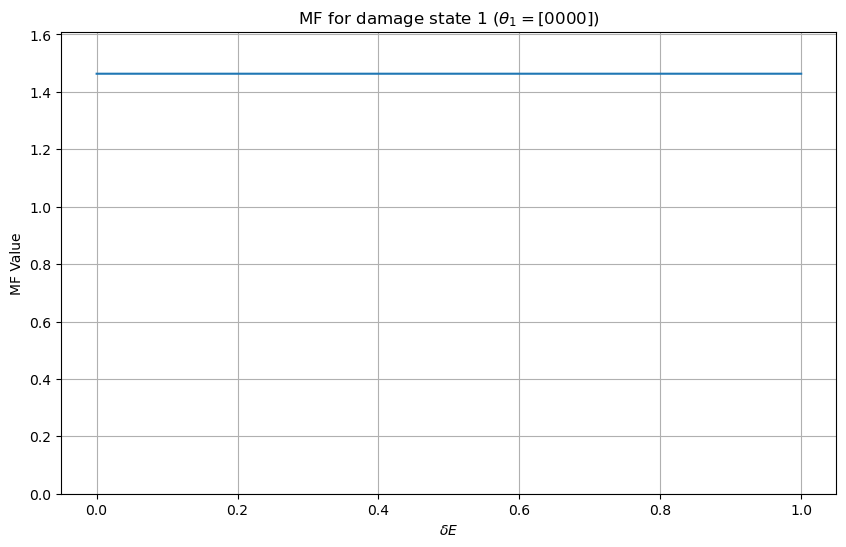

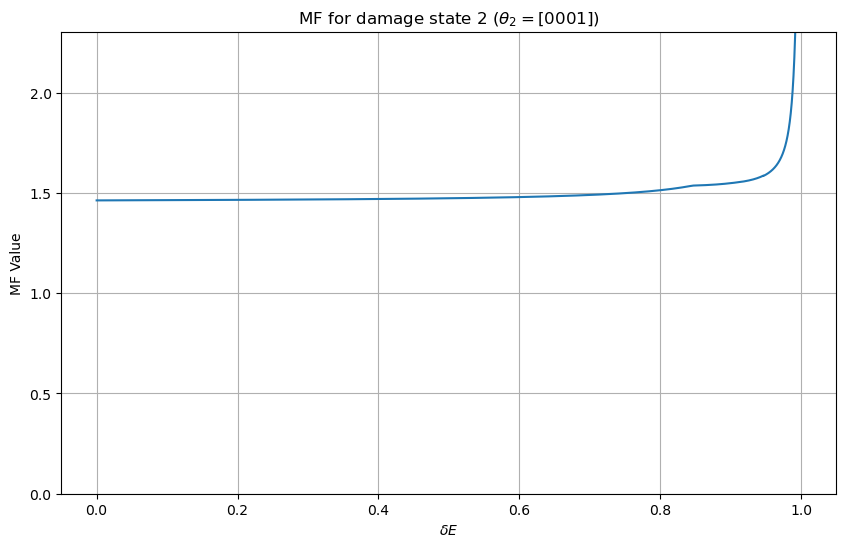

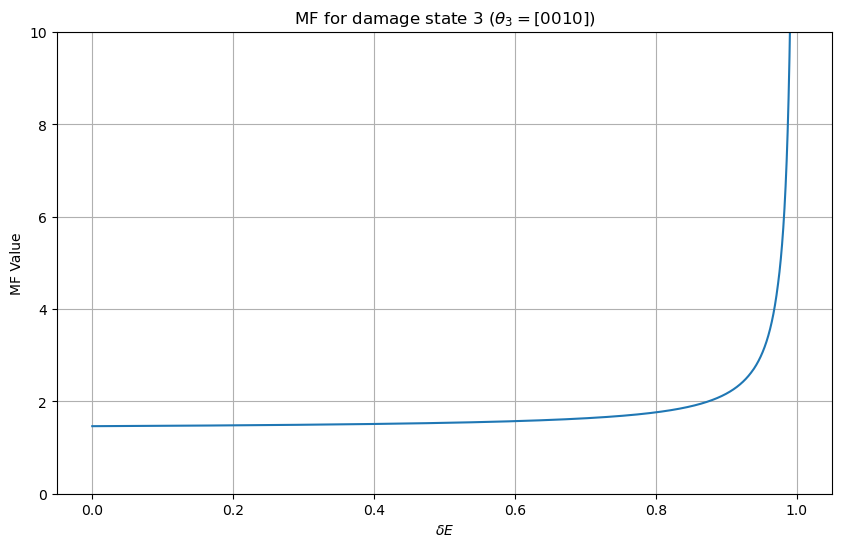

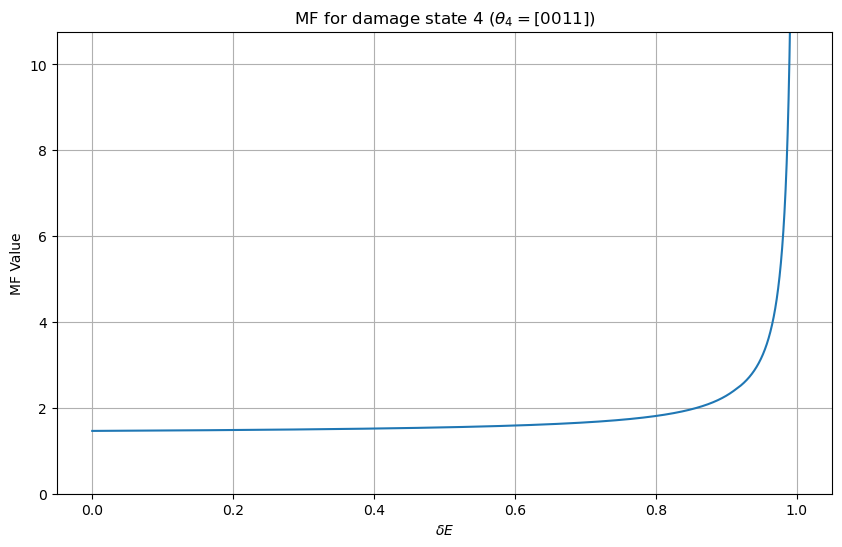

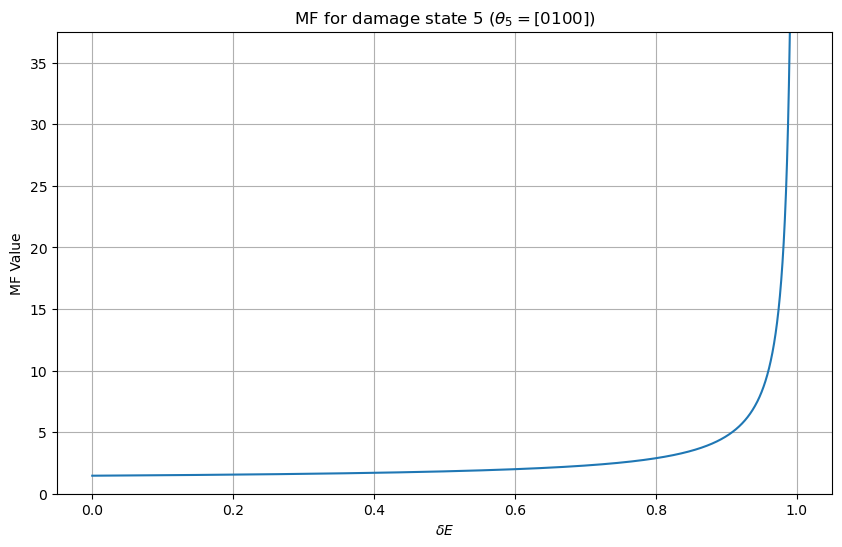

...

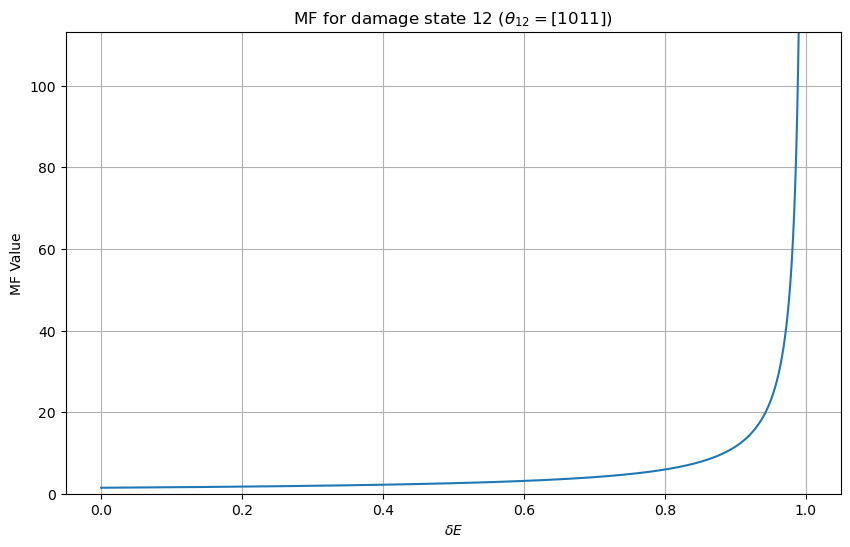

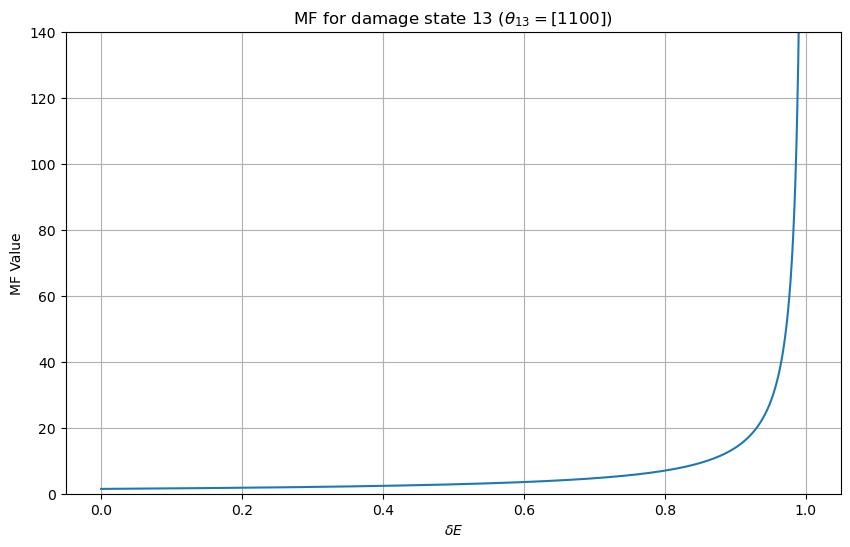

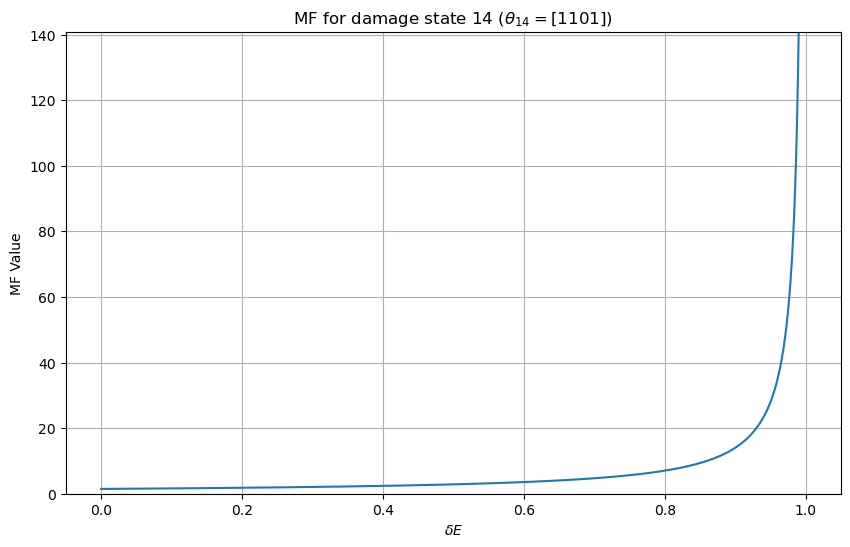

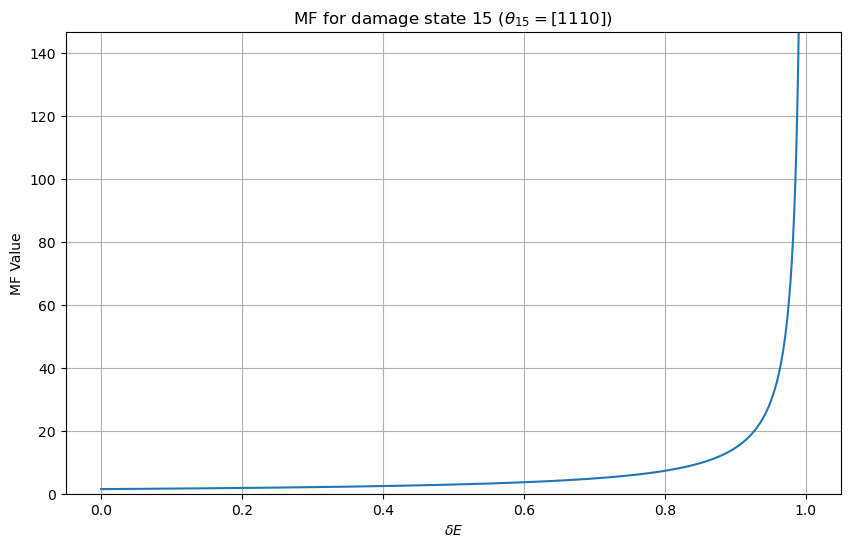

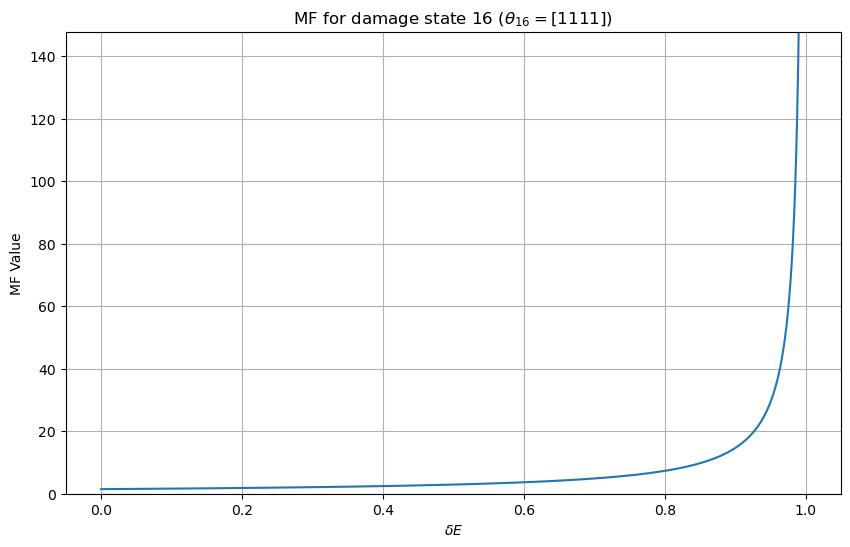

In [359]:
#| echo: false
#| output: true

for i in range(phi_samples.shape[1]):

    theta_now = i
    MF = np.zeros(phi_samples.shape[0])
    for ii in range(phi_samples.shape[0]):
        MF[ii] = BRinf.MF(phi_samples[ii,i], omega_samples[ii,i])

    plt.figure(figsize=(10, 6))
    plt.plot(delta_E_samples_sorted, MF, label=r'$MF$')

    plt.xlabel(r'$\delta E$')
    plt.ylabel('MF Value')
    plt.title(fr'MF for damage state {theta_now+1} ($\theta_{{{theta_now+1}}} = {e_configuration[theta_now]}$)')
    # plt.ylim(0, MF[int(0.9*len(MF)) ]) # set y limit to 90% of the max MF value for better visualization
    plt.ylim(0, 0.1*MF[0]+MF[int(0.99*len(MF)) ]) # set y limit to 90% of the max MF value for better visualization
    plt.grid()
    plt.show()

## Surrogate model for $\delta E$

The surrogate model works as follows:

1. $(\theta)$ selects a precomputed modal parameter dataset.
2. $(\delta E)$ is used to locate the two nearest neighboring samples in that dataset.
3. Linear interpolation between those neighboring modal parameter vectors gives the estimated modal parameters for the requested $(\delta E)$.
    - $y(\delta E)=y_0+\frac{\delta E-\delta E_0}{\delta E_1-\delta E_0}(y_1-y_0)$
        - $y$ is the colapsed modal parameter vector, there include the natural frequencies and mode shapes.

Time comparison:

- FEM model: 32s for $10^4$ evaluations
- Surrogate model: 3.13 ms or 0.00313 s for $10^4$ evaluations



::: {.callout-important title="Surrogate model for $\delta E$"}
do to the colapse of mode shape 4 in damage scenario [2-10, 13] have i 2 good options:

1. only do stiffness reduction up to 80%, so i do not hit the colapsing areas
2. don't include mode shape 4 in the model

Note: i think that i will hit problems in many structures when i reduce the stiffness a lot. that my model is not able to compute the modal parameters??? but it is strange that i setil get perfect eigenvalues but no eigenvectors??? why is that need bigger understanding of the eigen value problem ore the way that we compute the eigen value problem in the FEM model. Ithink taht we have some matrix restictions on the stiffness and mass matrix to be able to compute them fast / numerically? but is thos restictions dependent on the difrense in stiffness between ellements?? 
:::


::: {.callout-tip title="Note"}
- I make the surrogate model for the hole space and then after that can i cose to only use some of the stifennes reduction factor if i want
:::

::: {.content-hidden}
| Situation                  | Use                       |
| -------------------------- | ------------------------- |
| 1 input                    | `interp1d`                |
| 2+ inputs on regular grid  | `RegularGridInterpolator` |
| 2+ inputs scattered points | `LinearNDInterpolator`    |
| Smooth spline surface      | `RectBivariateSpline`     |
| Fast nearest lookup        | `NearestNDInterpolator`   |


:::

In [360]:
from scipy.interpolate import interp1d
# interp1d(x, y, kind='linear')
# interp1d(x, y, kind='cubic')
# interp1d(x, y, kind='nearest')

class surogate_dE_model:
    def __init__(self, phi_samples, omega_samples, theta, delta_E_samples):
        self.phi_samples = phi_samples
        self.omega_samples = omega_samples
        self.theta = theta
        self.delta_E_samples = delta_E_samples

        # initialize a dictionary to store the surrogate models for each theta
        self.models = {}

    def train(self):
        # phi_samples_reshaped[sample_index in delta E, theta],            phi_samples_reshaped.shape = 1000 x 16 x 16
        phi_samples_reshaped = self.phi_samples[:].reshape(self.phi_samples.shape[0], self.phi_samples.shape[1], -1)
        y = np.concatenate((self.omega_samples, phi_samples_reshaped), axis=2)

        for i in range(self.theta.shape[0]):
            model_id = i
            self.models[model_id] = interp1d(
                self.delta_E_samples, # x values (delta E), the input variable for the surrogate model
                y[:, model_id], # output [omega, phi]
                axis=0, 
                kind='linear' # 'linear', 'cubic', 'nearest'
            )
    
    def out(self, delta_E, theta=None, theta_index=None):
        # return the surrogate model output for a given delta E and theta
        if theta is not None:
            if isinstance(theta, int):
                model_id = theta
            else:
                model_id = np.where(self.theta == theta)[0][0]
        elif theta_index is not None:
            model_id = theta_index
        else:
            raise ValueError("Either 'theta' or 'theta_index' must be provided.")

        return self.models[model_id](delta_E)
    
    # def out_matrix(self, delta_E_vec, theta_index_vec):
        
    def out_to_omega_phi(self, delta_E, theta=None, theta_index=None):
        output = self.out(delta_E, theta=theta, theta_index=theta_index)
        omega = output[:self.omega_samples.shape[2]]
        phi = output[self.omega_samples.shape[2]:].reshape(self.phi_samples.shape[1], self.phi_samples.shape[2], self.phi_samples.shape[3])
        return omega, phi


class surogate_dE_model_fast:
    def __init__(self, phi_samples, omega_samples, theta, delta_E_samples):
        self.phi_samples = phi_samples
        self.omega_samples = omega_samples
        self.theta = theta
        self.delta_E_samples = delta_E_samples

        phi_samples_reshaped = self.phi_samples[:].reshape(self.phi_samples.shape[0], self.phi_samples.shape[1], -1)
        self.y = np.concatenate((self.omega_samples, phi_samples_reshaped), axis=2)

    def train(self):

        phi_samples_reshaped = self.phi_samples.reshape(
            self.phi_samples.shape[0],
            self.phi_samples.shape[1],
            -1
        )

        self.y = np.concatenate(
            (self.omega_samples, phi_samples_reshaped),
            axis=2
        )

        self.x = self.delta_E_samples

    def out_matrix(self, delta_E_vec, theta_index_vec):

        x = self.x
        y = self.y

        delta_E_vec = np.asarray(delta_E_vec)
        theta_index_vec = np.asarray(theta_index_vec)

        # find interval indices
        idx = np.searchsorted(x, delta_E_vec) - 1

        # clamp to valid range
        idx = np.clip(idx, 0, len(x) - 2)

        x0 = x[idx]
        x1 = x[idx + 1]

        # interpolation weights
        t = (delta_E_vec - x0) / (x1 - x0)

        # shape:
        # (batch, output_dim)
        y0 = y[idx, theta_index_vec]
        y1 = y[idx + 1, theta_index_vec]

        # vectorized linear interpolation
        out = y0 + (y1 - y0) * t[:, None]

        return out

In [361]:
# sur_dE = surogate_dE_model(phi_samples, omega_samples, np.array(OMA.theta), delta_E_samples)
# # sur_dE.theta = np.arange(sur_dE.omega_samples.shape[1], dtype=int)
# sur_dE.train()

# # omega_sur, phi_sur = sur_dE.out_to_omega_phi(delta_E_samples, theta_index=1)
# for _ in range(10**5):
#     sur_dE.out(delta_E = 0.13 , theta_index=1)

# sur_dE.out(delta_E = 0.13 , theta_index=1)

In [362]:
#| echo: true
#| output: true
"""3.13 ms ± 244 μs per loop (mean ± std. dev. of 7 runs, 100 loops each) vs 32.5 s for the true FEM mdoel"""
sur_dE = surogate_dE_model_fast(phi_samples, omega_samples, np.array(OMA.theta), delta_E_samples)
sur_dE.train()

delta_E_test = np.random.rand(10**4) * 0.99
theta_index_test = np.random.randint(0, sur_dE.y.shape[1], size=10**4)
theta_index_test = np.zeros(10**4, dtype=int) + 2 # test only for theta_index = 2 for now
# %timeit sur_dE.out_matrix(delta_E_test, theta_index_test)
test_data = sur_dE.out_matrix(delta_E_test, theta_index_test)

sur_dE.out_matrix(delta_E_test, theta_index_test)

sur_dE.out_matrix( np.array([0.139]) ,  np.array([1]))

array([[ 1.04309659,  6.66379311, 18.57191988, 33.83556437,  0.09236701,
         0.32751754,  0.64586596,  1.        ,  0.50181554,  1.        ,
         0.56128953, -0.73610705,  1.        ,  0.37558852, -0.99829447,
         0.4292274 ,  1.        , -0.94228131,  0.57818057, -0.15700558]])

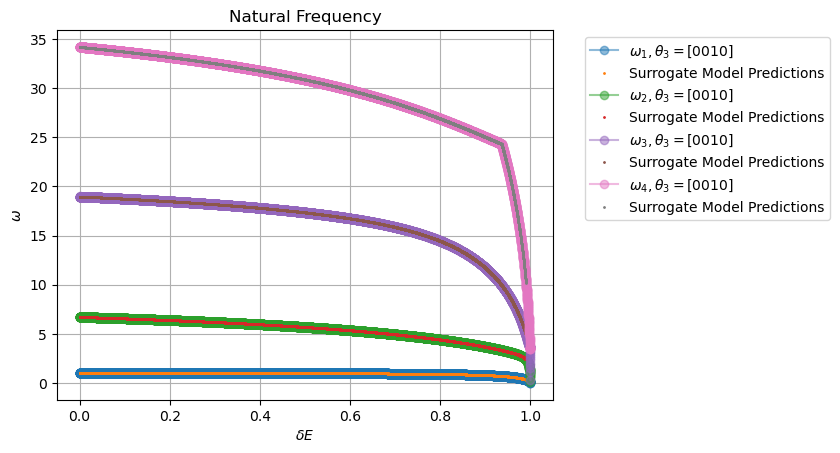

In [363]:
#| output: true
plt.figure()
ii = 2
for i in range(omega_samples.shape[2]):
    # i = 3
    plt.plot(delta_E_samples_sorted, omega_samples[:, ii, i][index], alpha=0.5, marker='o', label=fr'$\omega_{i+1}, \theta_{{{ii+1}}} = {e_configuration[ii]}$')
    plt.plot(delta_E_test, test_data[:, i], '.', alpha=1, markersize=2, label='Surrogate Model Predictions')
plt.xlabel(r'$\delta E$')
plt.ylabel(fr'$\omega$')
plt.title(f'Natural Frequency')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid()
plt.show()

## Generate data

I have chosen to use the uniformed beta distribution so the uniformed distribution.

I also use the surrogate model to reduce the computational cost of generating data 


<!-- ::: {.callout-note title="Note"}
- the OMA error for the natural frequencies is generated form an normal distribution, this means thet it is possible to get negative values for the natural frequencies, This is not phisical.
     - I have sat an flor of 0.01 for the natural frequencies if the negative values 
::: -->

In [364]:
def normalize_mode_shapes(model, phi_n):
        # Also only return vertical dofs
        e_sensor = np.arange(len(model.X))

        # list of fixed nodes
        fixed_nodes = [model.bounds[i][0] for i in range(len(model.bounds))]

        # remove fixed nodes
        e_sensor = e_sensor[~np.isin(e_sensor, fixed_nodes)] # ~ is the logical NOT operator, which inverts the boolean array returned by np.isin

        # normiles the node shapes 
        if phi_n.ndim == 2:
            mode_shapes = phi_n[:, 0::3].astype(float)
        elif phi_n.ndim == 3:
            mode_shapes = phi_n[:, :, 0::3].astype(float)
        else:
            print("phi_n must be either 3D or 4D array")
            return None


        # Remove fixed nodes from mode_shapes (last axis = node index)
        if phi_n.ndim == 2:
            mode_shapes = mode_shapes[:, e_sensor]
        elif phi_n.ndim == 3:
            mode_shapes = mode_shapes[:, :, e_sensor]
        
        
        # Normalize each mode shape by its maximum absolute value
        max_abs = np.max(np.abs(mode_shapes), axis=-1, keepdims=True)
        max_abs[max_abs == 0] = 1
        mode_shapes = mode_shapes / max_abs
        return mode_shapes


"""Test extraction of modeal properties?? """
FEM.print_code = False
FEM.plot_code = False
DeltaE = 0.9
S = np.array( [1, 1, 1, 0])
S_N = np.where(np.all(np.asarray(OMA.theta) == S, axis=1))[0][0]



mu_omega, mu_phi = OMA.extract_feature_given_ThetaAndDeltaE(FEM, Theta=[1, 1, 1, 0], DeltaE=DeltaE)
mu_phi = OMA.normalize_mode_shapes(FEM, mu_phi)

data_sur = sur_dE.out_matrix(np.array([DeltaE]), np.array([S_N])) # theta_index = 14 corresponds to Theta=[1, 1, 1, 0]
mu_omega_sur = data_sur[0, :omega_samples.shape[2]]
mu_phi_sur = data_sur[0, 4:].reshape(mu_phi.shape)

In [365]:
#| echo: true
"""Generate data set"""
N = 10**6
prior_theta = prior_theta
covariance_matrix = covariance_matrix 
omega_all = omega_all
phi_all = phi_all
omega_H0 = omega_all[0]
S = np.array( [1, 1, 1, 1])

code_run = True
code_run = False
if code_run:
    # improtance sampling prior for the states (theta) H_0 = 0.5 and H_1 = 0.5
    prior_H_Importance = np.array([0.5, 0.5])
    prior_Importance = np.concatenate(([prior_H_Importance[0]], np.repeat(prior_H_Importance[1] / (len(prior_theta) - 1), len(prior_theta) - 1)))

    # Imoportance sampling for structural states: theta ~ Q(theta) where Q is the importance distribution
    states = np.random.choice(range(len(prior_theta)), size=N, p=prior_Importance)
    H_vec = (states > 0).astype(int)  # 0 if state == 0, else 1

    # generate Delta E samples from the beta distribution
    delta_E_samples = np.random.beta(a=1, b=1, size=N)


    # sample OMA error
    lambda_star = np.random.multivariate_normal(mean=np.zeros(covariance_matrix.shape[0]), cov=covariance_matrix, size=N)


    # find the the mean values 
    data_sur = sur_dE.out_matrix(delta_E_samples, np.array(states)) # theta_index = 14 corresponds to Theta=[1, 1, 1, 0]
    mu_omega_sur = data_sur[:, :omega_samples.shape[2]]
    # mu_phi_sur = data_sur[0, 4:].reshape(mu_phi.shape)
    mu_phi_sur = data_sur[:, 4:]

    lambda_star[:, :len(omega_H0)] += mu_omega_sur
    lambda_star[:, len(omega_H0):] += mu_phi_sur
    # lambda_star = lambda_star

    # extract omega and phi from lambda_star
    omega_bar = lambda_star[:, :omega_H0.shape[0]]
    # phi_bar = lambda_star[:, omega_H0.shape[0]:].reshape(mu_phi.shape)
    phi_bar = lambda_star[:, omega_H0.shape[0]:].reshape(N, phi_all.shape[1], phi_all.shape[1])

    # Normalize each mode shape by its maximum absolute value
    max_abs = np.max(np.abs(phi_bar), axis=-1, keepdims=True)
    max_abs[max_abs == 0] = 1
    phi_bar = phi_bar / max_abs

    # save data to file
    np.savez("data/training_data.npz", omega_bar=omega_bar, phi_bar=phi_bar, H_vec=H_vec, delta_E_samples=delta_E_samples, states=states, prior_theta=prior_theta, prior_Importance=prior_Importance)

loaded_data = np.load("data/training_data.npz")
omega_bar = loaded_data["omega_bar"]
phi_bar = loaded_data["phi_bar"]
H_vec = loaded_data["H_vec"]
delta_E_samples = loaded_data["delta_E_samples"]
states_bar = loaded_data["states"]
states = states_bar.copy()
prior_theta = loaded_data["prior_theta"]
prior_Importance = loaded_data["prior_Importance"]


# Calculate features (Step 2)

## Calculate features 

$$
y = [\omega_1, ... , \omega_n, MAC_{1,1}, ... , MAC_{n,n}, TMAC, MF]
$$

In [366]:
#| echo: true
#| output: false
# code_run = True
code_run = False
if code_run:
    MAC_11 = np.array( [BRinf.MAC(phi_samples[0,0,0], val) for val in phi_bar[:, 0]] )
    MAC_22 = np.array( [BRinf.MAC(phi_samples[0,0,1], val) for val in phi_bar[:, 1]] )
    MAC_33 = np.array( [BRinf.MAC(phi_samples[0,0,2], val) for val in phi_bar[:, 2]] )
    MAC_44 = np.array( [BRinf.MAC(phi_samples[0,0,3], val) for val in phi_bar[:, 3]] )

    TMAC = (MAC_11 + MAC_22 + MAC_33 + MAC_44) / 4

    MF = np.array([BRinf.MF(phi_bar[i], omega_bar[i]) for i in range(N)])

    y = np.column_stack((omega_bar, MAC_11, MAC_22, MAC_33, MAC_44, TMAC, MF))

    # save features 
    np.savez("data/features.npz", y=y, H_vec=H_vec, delta_E_samples=delta_E_samples, states=states, prior_theta=prior_theta, prior_Importance=prior_Importance)

# load features from file
features_data = np.load("data/features.npz")
y = features_data["y"]
y_features = y.copy()

## Simple Plots of the features 

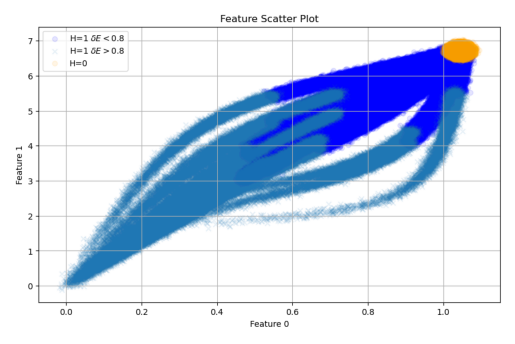

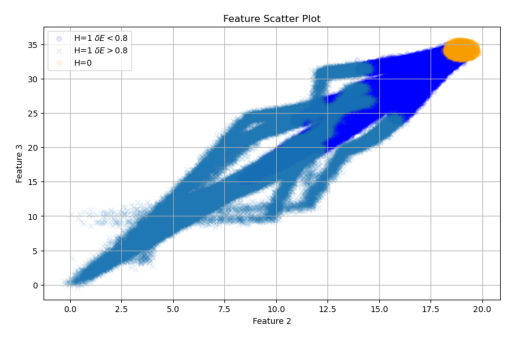

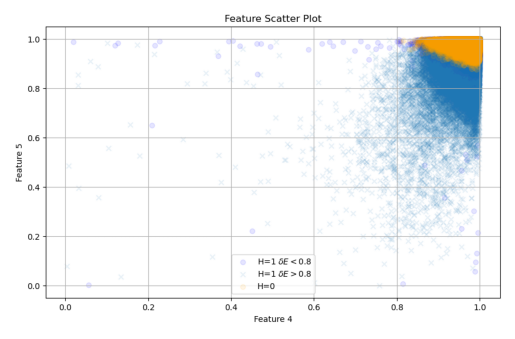

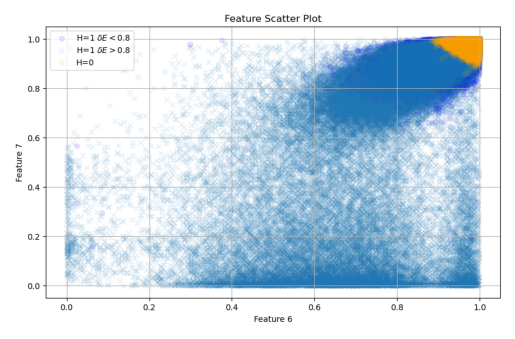

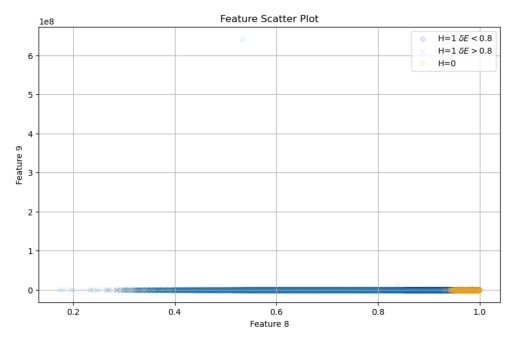

In [367]:
#| output: true
def plot_now(i, ii, shift_DE, save_file_name = None):
    plt.figure(figsize=(10, 6))
    plt.scatter(y[(H_vec==1) & (delta_E_samples<=shift_DE), i], y[(H_vec==1) & (delta_E_samples<=shift_DE), ii], alpha=0.1, label=fr'H=1 $\delta E < {shift_DE}$', color='blue')
    plt.scatter(y[(H_vec==1) & (delta_E_samples>shift_DE), i], y[(H_vec==1) & (delta_E_samples>shift_DE), ii], alpha=0.1, marker='x', label=fr'H=1 $\delta E > {shift_DE}$')
    plt.scatter(y[H_vec==0, i], y[H_vec==0, ii], alpha=0.1, label='H=0', color='orange')
    plt.xlabel(fr'Feature {i}')
    plt.ylabel(fr'Feature {ii}')
    plt.title('Feature Scatter Plot')
    plt.legend()
    plt.grid()
    if save_file_name:
        plt.savefig(save_file_name, bbox_inches='tight')
    plt.show()

code_run = True
code_run = False
if code_run:
    # make an plot of the features where it is gruped into the two classes H = 0 and H = 1
    shift_DE = 0.8
    i, ii = 0, 1
    plot_now(i, ii, shift_DE, save_file_name=f"data/plots/feature_{i}_vs_{ii}_shiftDE_{shift_DE}.png")

    i, ii = 2, 3
    plot_now(i, ii, shift_DE, save_file_name=f"data/plots/feature_{i}_vs_{ii}_shiftDE_{shift_DE}.png")

    i, ii = 4, 5
    plot_now(i, ii, shift_DE, save_file_name=f"data/plots/feature_{i}_vs_{ii}_shiftDE_{shift_DE}.png")

    i, ii = 6, 7
    plot_now(i, ii, shift_DE, save_file_name=f"data/plots/feature_{i}_vs_{ii}_shiftDE_{shift_DE}.png")

    i, ii = 8, 9
    plot_now(i, ii, shift_DE, save_file_name=f"data/plots/feature_{i}_vs_{ii}_shiftDE_{shift_DE}.png")

else:
    # plot the saved plots
    for i, ii in [(0, 1), (2, 3), (4, 5), (6, 7), (8, 9)]:
        shift_DE = 0.8
        img = plt.imread(f"data/plots/feature_{i}_vs_{ii}_shiftDE_{shift_DE}.png")
        plt.figure()
        plt.imshow(img)
        plt.axis('off')
        plt.show()



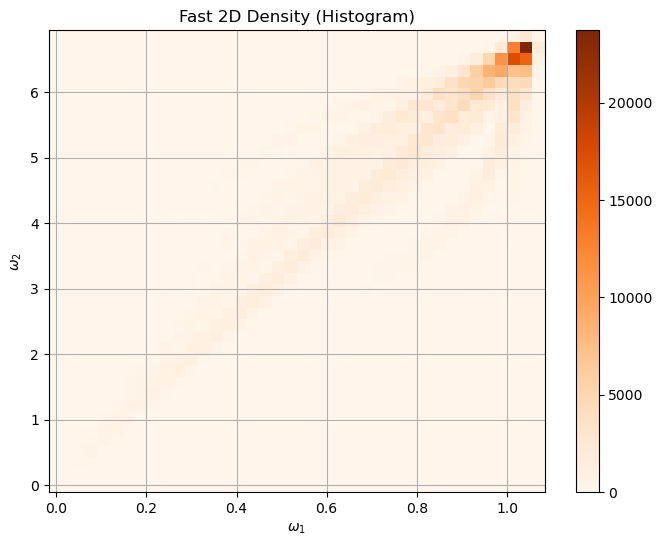

In [368]:
import matplotlib.pyplot as plt
import numpy as np

x0 = y[H_vec == 0, :2]
x1 = y[H_vec == 1, :2]

n = 40

plt.figure(figsize=(8,6))

# plt.hist2d(x0[:,0], x0[:,1], bins=n, cmap='Blues', alpha=0.5)
plt.hist2d(x1[:,0], x1[:,1], bins=n, cmap='Oranges', alpha=1)

plt.xlabel(r'$\omega_1$')
plt.ylabel(r'$\omega_2$')
plt.title('Fast 2D Density (Histogram)')
plt.colorbar()
# plt.xlim(y[:,0].min(), y[:,0].max())
plt.grid(True)

plt.show()

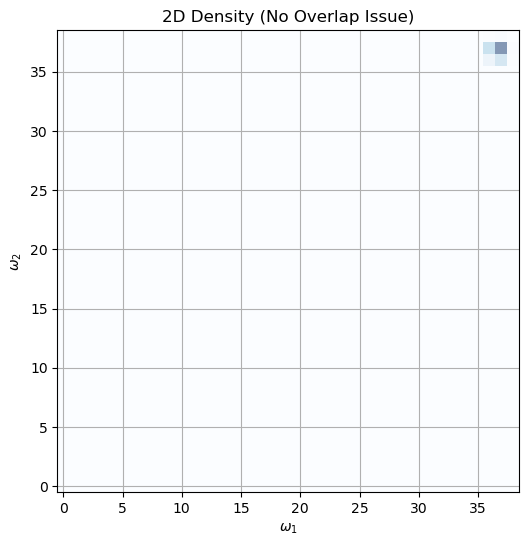

In [369]:
import matplotlib.pyplot as plt
import numpy as np

x0 = y[H_vec == 0, :2]
x1 = y[H_vec == 1, :2]

n = 40

# shared bin edges (IMPORTANT)
xedges = np.linspace(y[:,0].min(), y[:,0].max(), n)
yedges = np.linspace(y[:,1].min(), y[:,1].max(), n)

plt.figure(figsize=(8,6))

# compute histograms manually (so they don't overwrite each other)
H0, _, _ = np.histogram2d(x0[:,0], x0[:,1], bins=[xedges, yedges])
H1, _, _ = np.histogram2d(x1[:,0], x1[:,1], bins=[xedges, yedges])

# plot as contours instead of hist2d (cleaner overlay)
# plt.contour(H0.T, cmap='Blues')
# plt.contour(H1.T, cmap='Oranges')

plt.imshow(H0.T, cmap='Blues', alpha=0.5, origin='lower')
# plt.imshow(H1.T, cmap='Oranges', alpha=0.5, origin='lower')

plt.xlabel(r'$\omega_1$')
plt.ylabel(r'$\omega_2$')
plt.title('2D Density (No Overlap Issue)')
plt.grid(True)

plt.show()

In [370]:
y[H_vec == 0, :10]

array([[ 1.04911728,  6.78781628, 18.68637988, ...,  0.98650065,
         0.98617562,  1.39783174],
       [ 1.04923687,  6.62490749, 19.19200315, ...,  0.99920542,
         0.99488236,  1.47877355],
       [ 1.04587465,  6.72722306, 19.25974292, ...,  0.99721572,
         0.98987679,  1.69457912],
       ...,
       [ 1.01510638,  6.65185451, 19.01181992, ...,  0.99768522,
         0.99390694,  1.5185224 ],
       [ 1.03738763,  6.6573157 , 18.88900969, ...,  0.98604439,
         0.98593048,  1.65989458],
       [ 1.03728891,  6.62324975, 19.29481381, ...,  0.99856436,
         0.9940243 ,  1.41126869]], shape=(499173, 10))

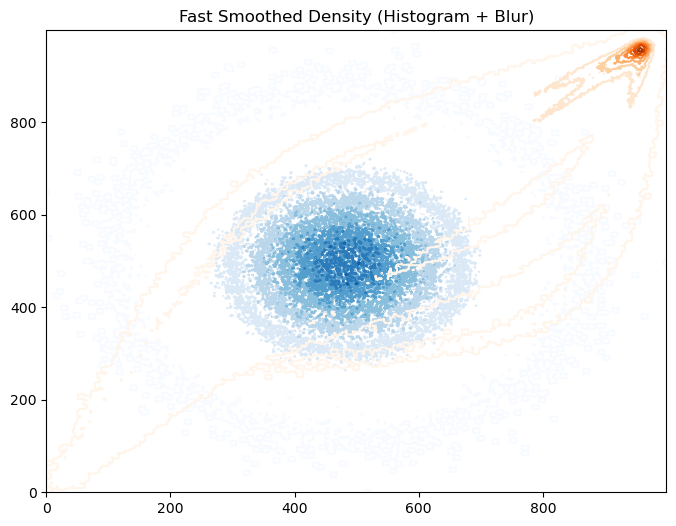

In [371]:
from scipy.ndimage import gaussian_filter
import numpy as np
import matplotlib.pyplot as plt

x0 = y[H_vec == 0, :2]
x1 = y[H_vec == 1, :2]

n = 1000

H0, xedges, yedges = np.histogram2d(x0[:,0], x0[:,1], bins=n)
H1, _, _ = np.histogram2d(x1[:,0], x1[:,1], bins=n)

H0 = gaussian_filter(H0, sigma=1)
H1 = gaussian_filter(H1, sigma=1)

plt.figure(figsize=(8,6))

plt.contour(H0.T, cmap='Blues')
plt.contour(H1.T, cmap='Oranges')

plt.title("Fast Smoothed Density (Histogram + Blur)")
plt.show()

## Simple histograms of the features

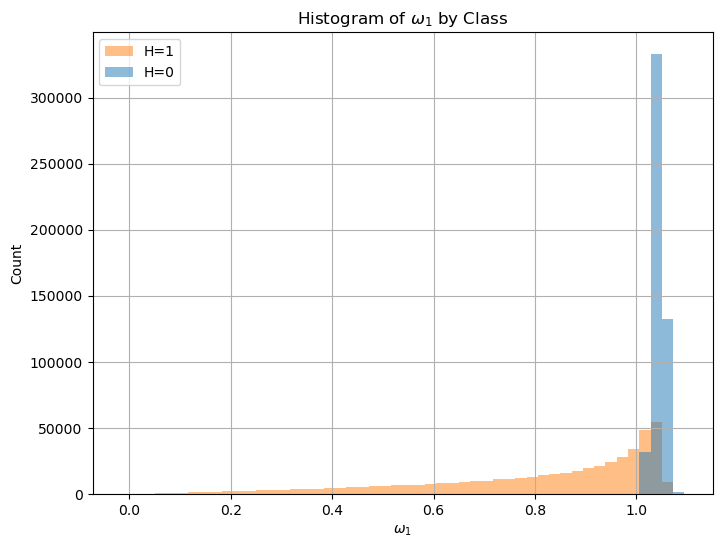

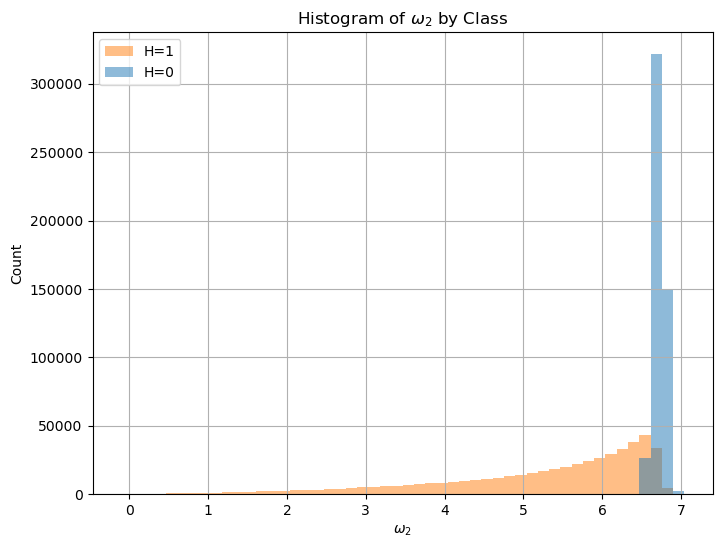

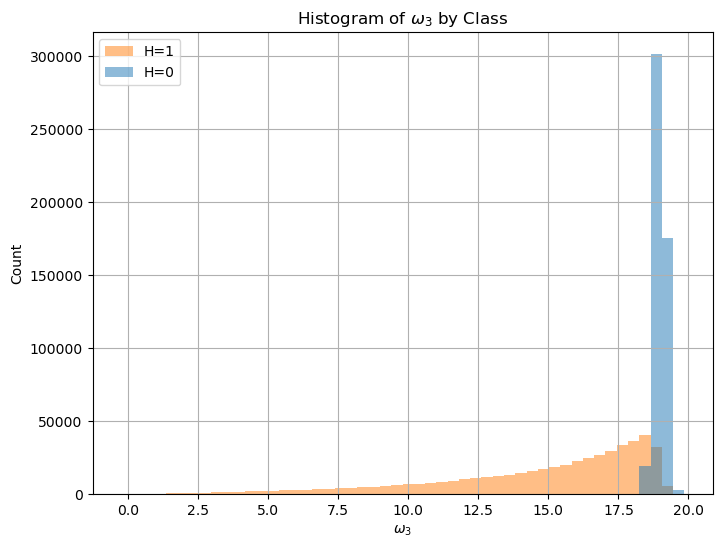

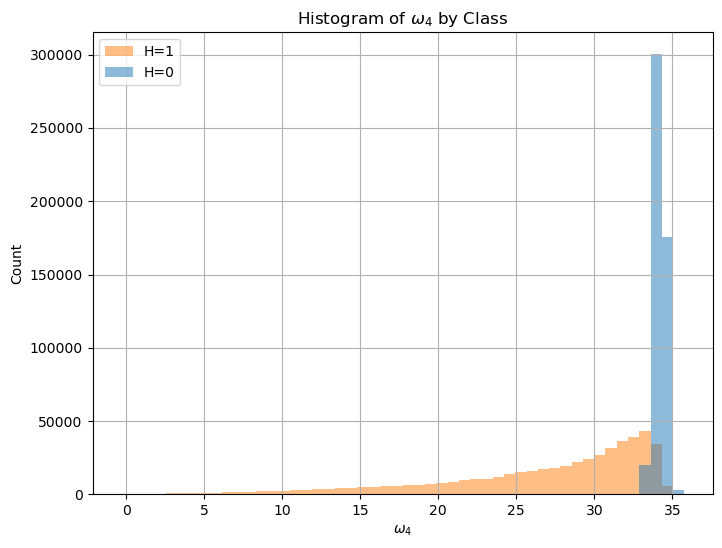

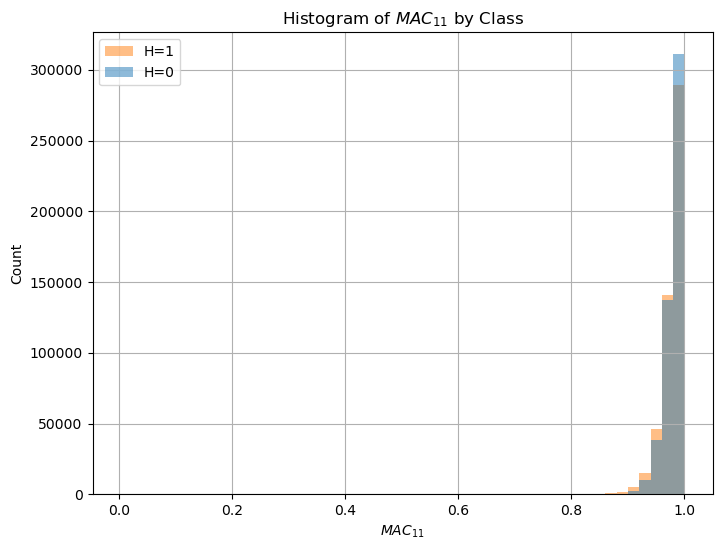

...

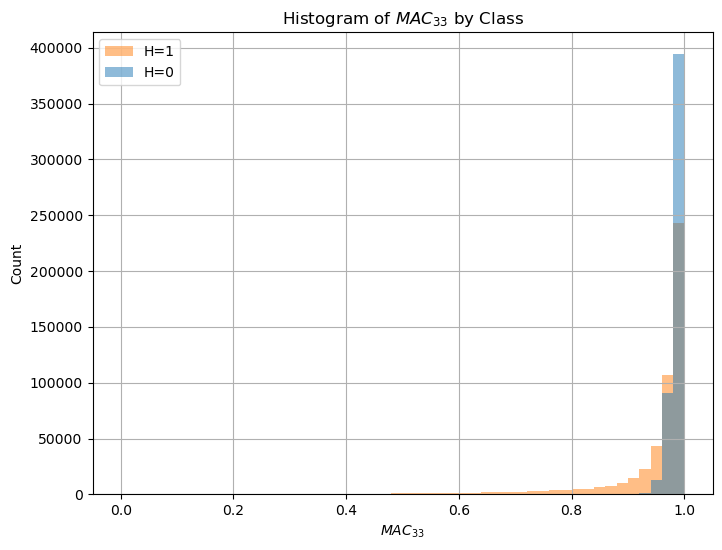

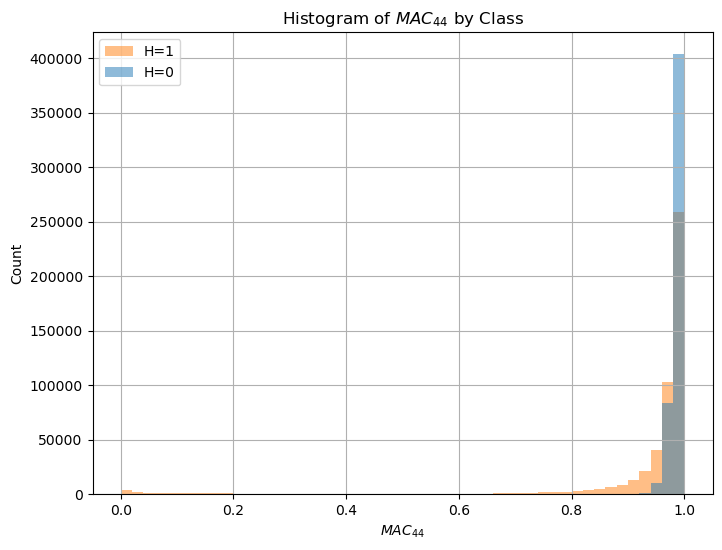

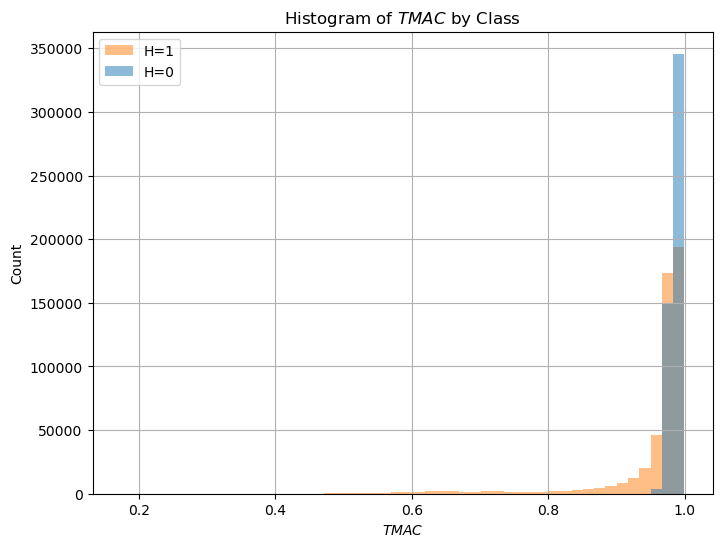

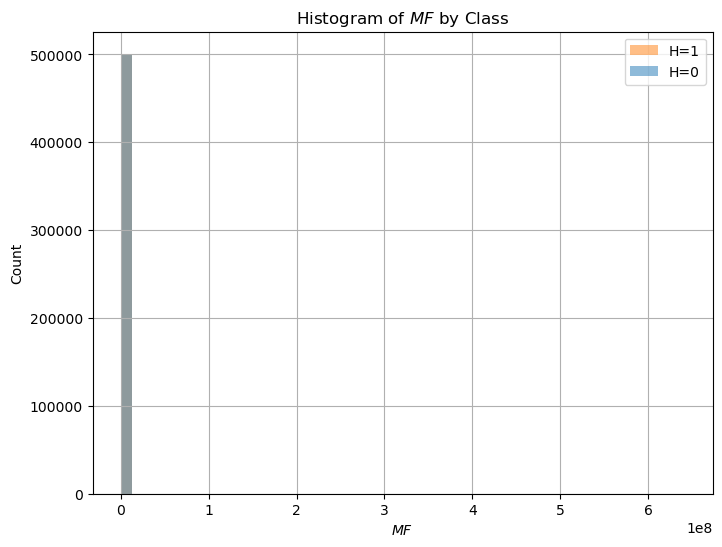

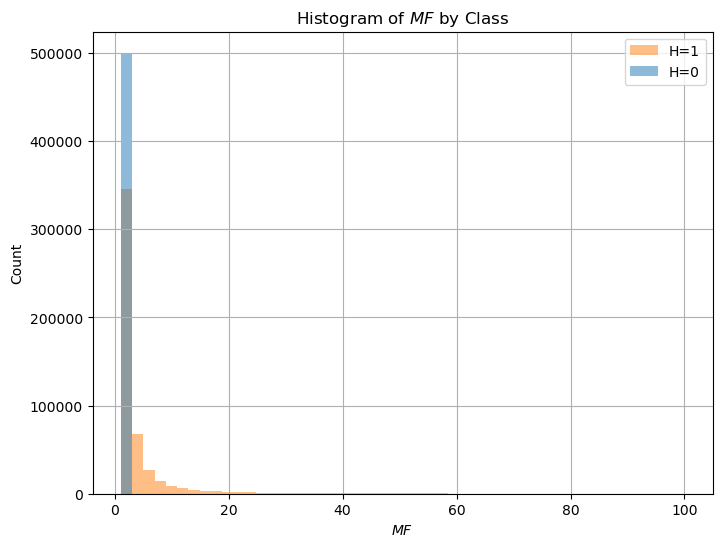

In [372]:
#| output: true
feature_names = [r'$\omega_1$', r'$\omega_2$', r'$\omega_3$', r'$\omega_4$', r'$MAC_{11}$', r'$MAC_{22}$', r'$MAC_{33}$', r'$MAC_{44}$', r'$TMAC$', r'$MF$']
for i in range(y.shape[1]):
    plt.figure(figsize=(8,6))
    plt.hist([y[H_vec == 0, i], y[H_vec == 1, i]], bins=50, alpha=0.5, label=['H=0', 'H=1'], rwidth=1.0, histtype='stepfilled')
    plt.ylabel('Count')
    plt.title(f'Histogram of {feature_names[i]} by Class')
    plt.xlabel(feature_names[i])
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(8,6))
plt.hist([y[(H_vec == 0) & (y[:, -1]  <= 10**2), i], y[(H_vec == 1) & (y[:, -1]  <= 10**2), i]], bins=50, alpha=0.5, label=['H=0', 'H=1'], rwidth=1.0, histtype='stepfilled')
plt.ylabel('Count')
plt.title(f'Histogram of {feature_names[i]} by Class')
plt.xlabel(feature_names[i])
plt.legend()
plt.grid(True)
plt.show()

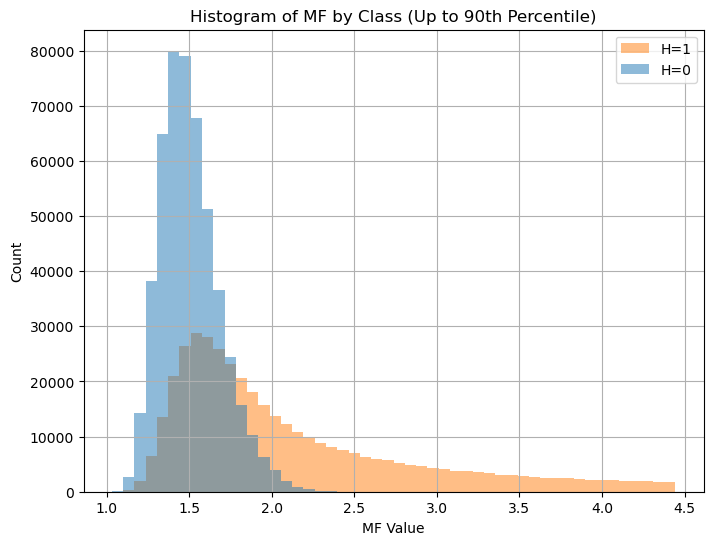

In [373]:
#| output: true
percentile = 90
MF_99 = np.percentile(y[:, -1], percentile)
plt.figure(figsize=(8,6))
plt.hist([y[(H_vec == 0) & (y[:, -1]  <= MF_99), -1], y[(H_vec == 1) & (y[:, -1]  <= MF_99), -1]], bins=50, alpha=0.5, label=['H=0', 'H=1'], rwidth=1.0, histtype='stepfilled')
plt.ylabel('Count')
plt.title(f'Histogram of MF by Class (Up to {percentile}th Percentile)')
plt.xlabel('MF Value')
plt.legend()
plt.grid(True)
plt.show()

In [374]:
y[y[:, -1] <= np.percentile(y[:, -1], 99.9), -1].mean(), np.percentile(y[:, -1], 50.2)

(np.float64(3.516205814861546), np.float64(1.6244635202177433))

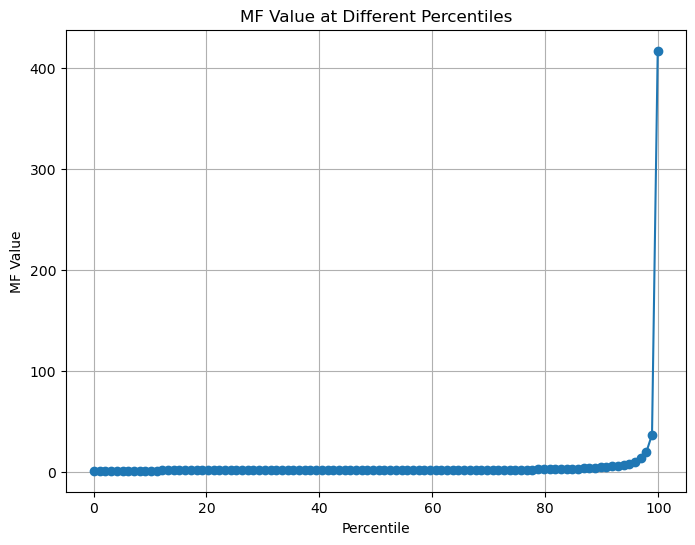

In [375]:
#| output: true
percentiles = np.linspace(0.1, 99.9, 100)
plt.figure(figsize=(8,6))
plt.plot(percentiles, np.percentile(y[:, -1], percentiles), marker='o')
plt.xlabel('Percentile')
plt.ylabel('MF Value')
plt.title('MF Value at Different Percentiles')
plt.grid(True)
plt.show()

## Simple statistics of the features

Here blow is there some box plots and an print of statistical information about the features for H = 0 and H = 1.

C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([y[H_vec == 0, i], y[H_vec == 1, i]], labels=['H=0', 'H=1'])
C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


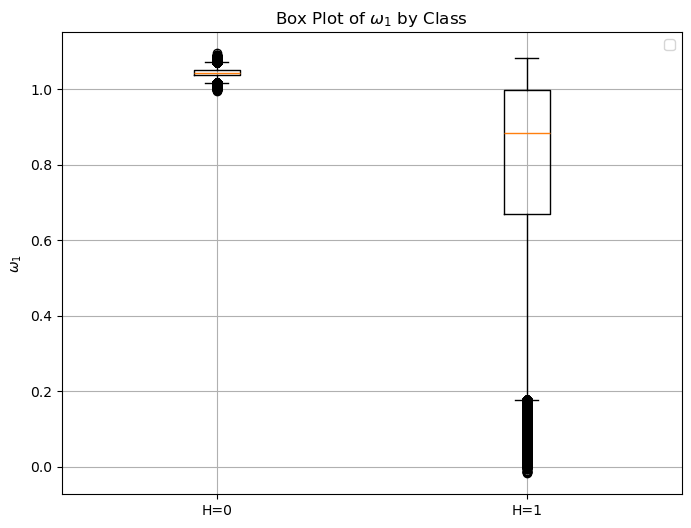

C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([y[H_vec == 0, i], y[H_vec == 1, i]], labels=['H=0', 'H=1'])
C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


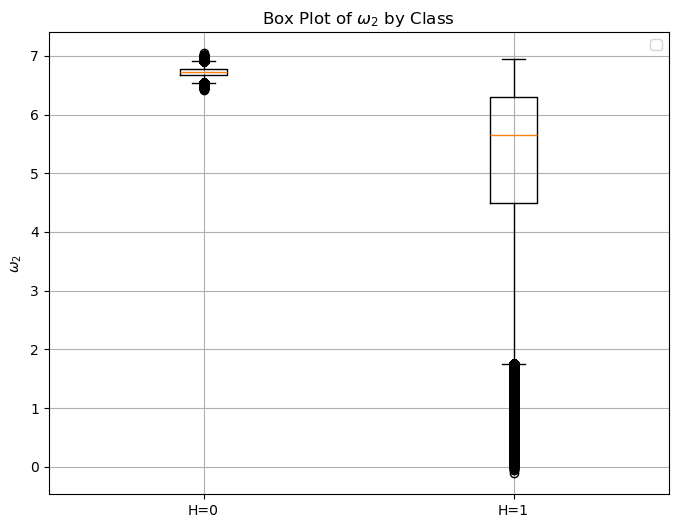

C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([y[H_vec == 0, i], y[H_vec == 1, i]], labels=['H=0', 'H=1'])
C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


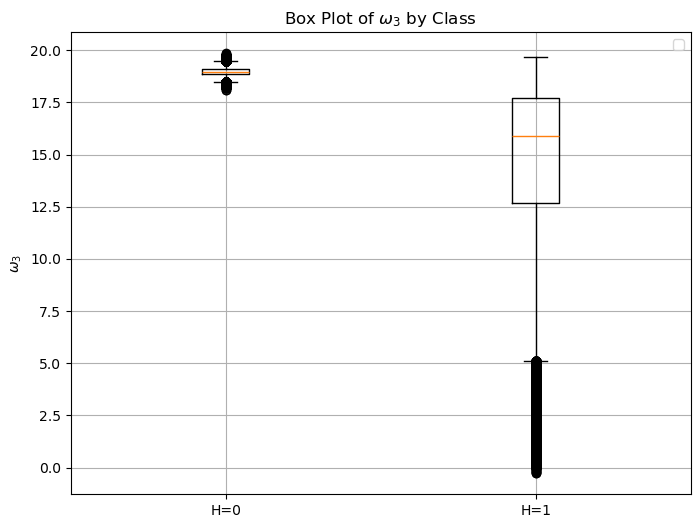

C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([y[H_vec == 0, i], y[H_vec == 1, i]], labels=['H=0', 'H=1'])
C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


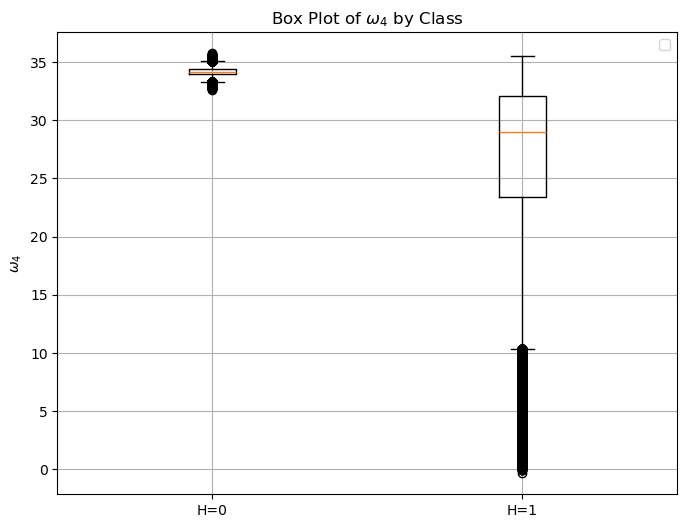

C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([y[H_vec == 0, i], y[H_vec == 1, i]], labels=['H=0', 'H=1'])
C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


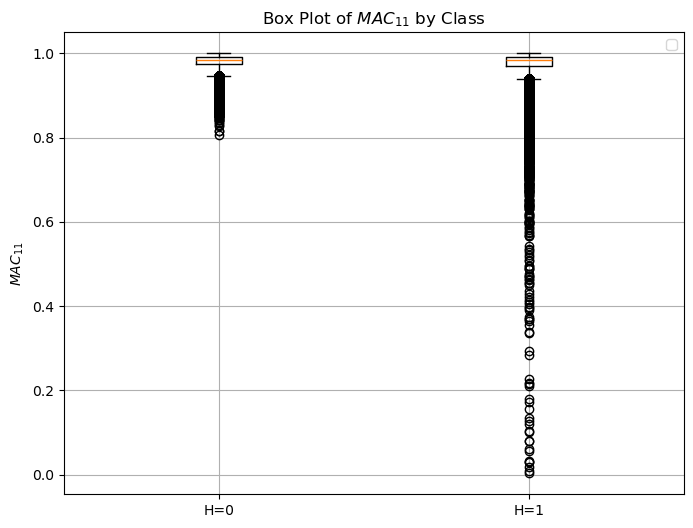

C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([y[H_vec == 0, i], y[H_vec == 1, i]], labels=['H=0', 'H=1'])
C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


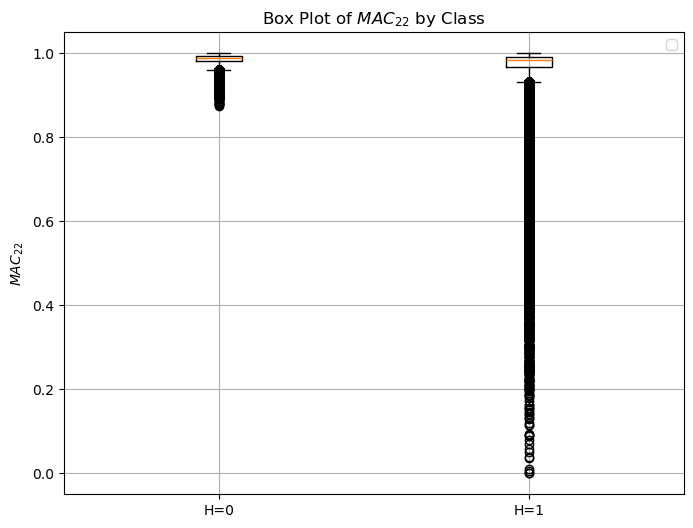

C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([y[H_vec == 0, i], y[H_vec == 1, i]], labels=['H=0', 'H=1'])
C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


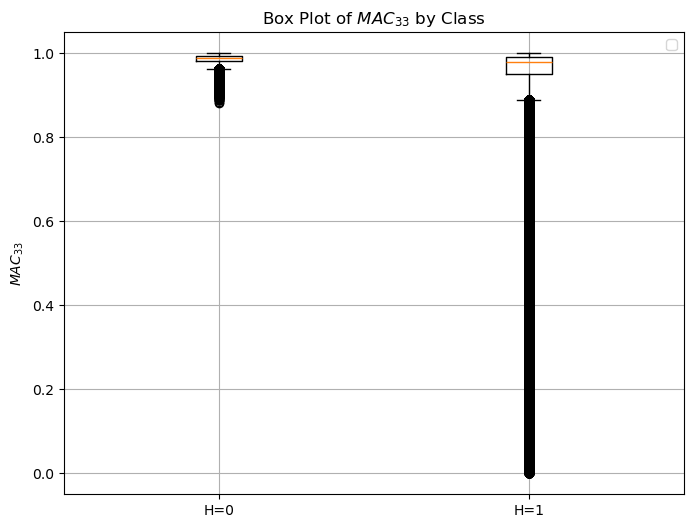

C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([y[H_vec == 0, i], y[H_vec == 1, i]], labels=['H=0', 'H=1'])
C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


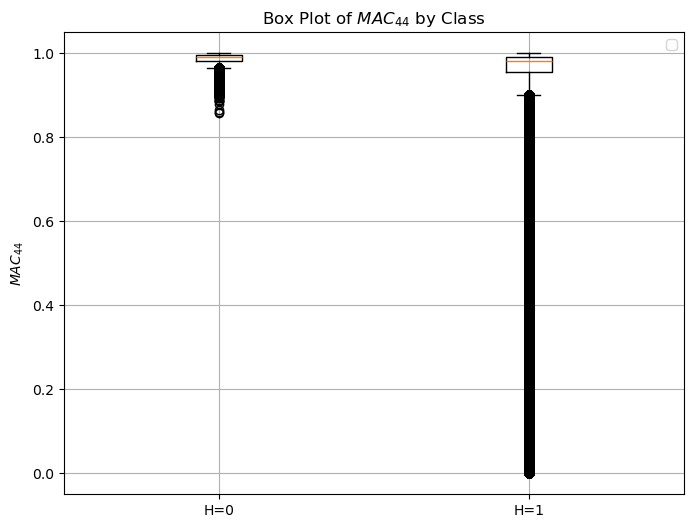

C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([y[H_vec == 0, i], y[H_vec == 1, i]], labels=['H=0', 'H=1'])
C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


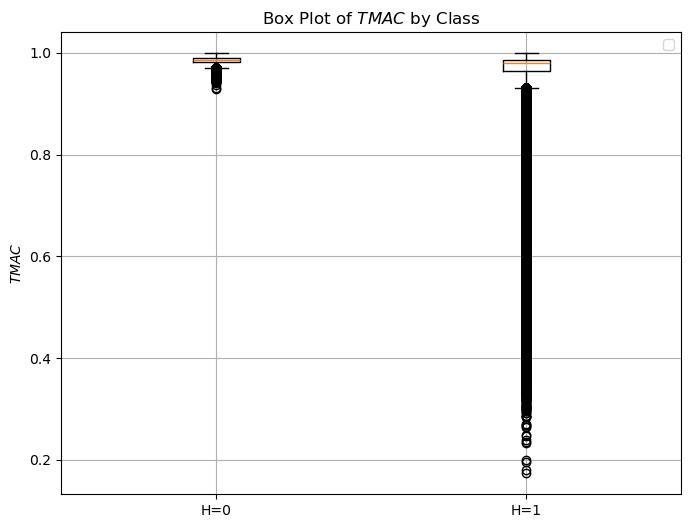

C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([y[H_vec == 0, i], y[H_vec == 1, i]], labels=['H=0', 'H=1'])
C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\149549545.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


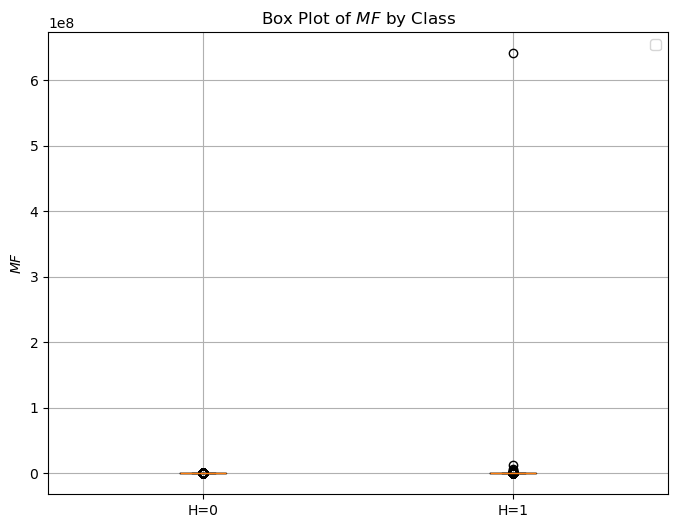

In [376]:
#| output: true
# make an box plot for H = 0 and H = 1 for all the features
import matplotlib.pyplot as plt
feature_names = [r'$\omega_1$', r'$\omega_2$', r'$\omega_3$', r'$\omega_4$', r'$MAC_{11}$', r'$MAC_{22}$', r'$MAC_{33}$', r'$MAC_{44}$', r'$TMAC$', r'$MF$']
for i in range(y.shape[1]):
    plt.figure(figsize=(8,6))
    plt.boxplot([y[H_vec == 0, i], y[H_vec == 1, i]], labels=['H=0', 'H=1'])
    plt.ylabel(feature_names[i])
    plt.title(f'Box Plot of {feature_names[i]} by Class')
    plt.legend()
    plt.grid(True)
    plt.show()

C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\913959463.py:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([y[(H_vec == 0) & (y[:, -1] < val), i], y[(H_vec == 1) & (y[:, -1] < val), i]], labels=['H=0', 'H=1'])
C:\Users\axiom\AppData\Local\Temp\ipykernel_15964\913959463.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


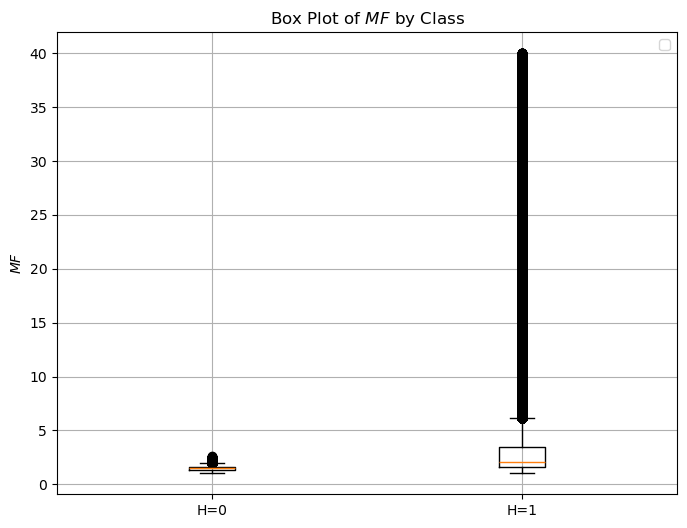

In [377]:
#| echo: true
#| output: true

i = -1
val = 40
plt.figure(figsize=(8,6))
plt.boxplot([y[(H_vec == 0) & (y[:, -1] < val), i], y[(H_vec == 1) & (y[:, -1] < val), i]], labels=['H=0', 'H=1'])
plt.ylabel(feature_names[i])
plt.title(f'Box Plot of {feature_names[i]} by Class')
plt.legend()
plt.grid(True)
plt.show()

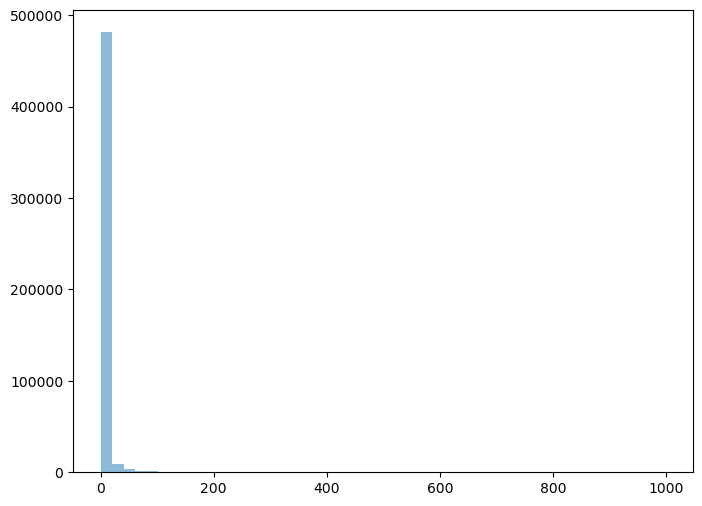

np.int64(420)

In [378]:
val = 10**3
plt.figure(figsize=(8,6))
plt.hist(y[(H_vec == 1) & (y[:, -1] < val), -1], bins=50, alpha=0.5, label='H=1')
plt.show()

sum(y[:, -1] > val)

In [379]:
y[(H_vec == 1) & (y[:, -1] > val)].min(axis=0), y[(H_vec == 1) & (y[:, -1] > val)].max(axis=0)

(array([-1.68949510e-02, -1.10967111e-01, -2.72435176e-01, -3.45077489e-01,
         2.94002137e-01,  9.21811701e-02,  3.42448984e-04,  2.05129251e-04,
         2.95455423e-01,  1.00010792e+03]),
 array([4.83258980e-02, 9.19011391e-01, 2.98065760e+00, 1.06508049e+01,
        9.99950196e-01, 9.99702125e-01, 9.99593760e-01, 9.99682954e-01,
        9.95771341e-01, 6.41042347e+08]))

In [380]:
#| output: true
# print mean, std, min max q50 for all the features for H = 0 and H = 1
for i in range(y.shape[1]):
    print(f"Feature {i}:")
    print(f"H=0: mean={y[H_vec==0, i].mean():.4f}, std={y[H_vec==0, i].std():.4f}, min={y[H_vec==0, i].min():.4f}, max={y[H_vec==0, i].max():.4f}, q50={np.percentile(y[H_vec==0, i], 50):.4f}")
    print(f"H=1: mean={y[H_vec==1, i].mean():.4f}, std={y[H_vec==1, i].std():.4f}, min={y[H_vec==1, i].min():.4f}, max={y[H_vec==1, i].max():.4f}, q50={np.percentile(y[H_vec==1, i], 50):.4f}")
    print()

Feature 0:
H=0: mean=1.0436, std=0.0104, min=0.9959, max=1.0945, q50=1.0437
H=1: mean=0.8053, std=0.2347, min=-0.0169, max=1.0833, q50=0.8840

Feature 1:
H=0: mean=6.7223, std=0.0672, min=6.4095, max=7.0430, q50=6.7224
H=1: mean=5.2201, std=1.3743, min=-0.1110, max=6.9474, q50=5.6496

Feature 2:
H=0: mean=18.9788, std=0.1895, min=18.0946, max=19.8528, q50=18.9788
H=1: mean=14.7098, std=3.8378, min=-0.2724, max=19.6928, q50=15.8796

Feature 3:
H=0: mean=34.1965, std=0.3416, min=32.6052, max=35.7654, q50=34.1970
H=1: mean=26.7902, std=6.8505, min=-0.3451, max=35.5405, q50=28.9695

Feature 4:
H=0: mean=0.9807, std=0.0158, min=0.8069, max=1.0000, q50=0.9848
H=1: mean=0.9777, std=0.0223, min=0.0032, max=1.0000, q50=0.9832

Feature 5:
H=0: mean=0.9857, std=0.0117, min=0.8748, max=1.0000, q50=0.9887
H=1: mean=0.9706, std=0.0452, min=0.0001, max=1.0000, q50=0.9833

Feature 6:
H=0: mean=0.9867, std=0.0108, min=0.8813, max=1.0000, q50=0.9895
H=1: mean=0.9432, std=0.1037, min=0.0000, max=1.0000, 

# Feature selection (Step 3)

::: {.callout-note title="Note"}
feature vector:
$$
y = [\omega_1, ... , \omega_n, MAC_{1,1}, ... , MAC_{n,n}, TMAC, MF, dummy]
$$

I have chossen to add an domy variable there holdes no information about the damage states, this is add as the last feature in the feature vector.
:::

## Feature selection 

- “Mutual information” ([Herlau et al., p. 89](zotero://select/library/items/4P269CF8)) ([pdf](zotero://open-pdf/library/items/Y7FREX6H?page=103&annotation=TKVLMR96)): Measures dependency between feature and label
     - ´from sklearn.feature_selection import mutual_info_classif´

- Statistical tests 
    - t-test (binary classification) (ANOVA (multi-class))

- Model-based feature importance
    - Random Forest feature importance
    - Lasso regression coefficients 

- Recursive Feature Elimination (RFE)
    - Train model
    - Remove least important feature
    - Repeat

::: {.callout-note title="Note"}
If I want can i do K-fold cross validation to evaluate the performance of the feature selection method, and to select the optimal number of features. This has some of the smae vibes as RFE, but it is more computational expensive if i have a lot of features or an lot of model parametes to optimize.
:::

::: {.callout-note title="Principle component analysis (PCA)"}
Why is it bad for feature selection? 

- ignore the class labels
- keeps features with high variance, but this is not always the components that hold the most information about the class labels.
- may discard low-variance features that are actually very discriminative for the classification.

Note: PCA is a dimensionality reduction technique that transforms the original features into a new set of uncorrelated features (principal components) that capture the most variance in the data. However, it does not consider the class labels, which can lead to suboptimal feature selection for classification tasks.
:::

::: {.content-hidden}
Note: add an completly random variable as an feature.
:::

## Statistical tests

Focus on 

- t-test (binary classification) (ANOVA (multi-class))
- ANOVA (multi-class)

<!-- ### Covariance matrix for the features {.level2} -->

In [381]:
# cal

### ANOVA (difference between means) {.level2}

We can use the ANOVA test to compare the means of the features between the two classes (H=0 and H=1) to see if there is a statistically significant difference between the mean values in the two classes.

[t-test](https://en.wikipedia.org/wiki/Student%27s_t-test) = [ANOVA](https://en.wikipedia.org/wiki/Analysis_of_variance) for binary classification

What is the null hypothesis for the t-test?

- $H_0$: The mean of the feature is the same for both classes (no difference between classes).
- $H_1$: The mean of the feature is different for the two classes (there is a difference between classes).


iamge form page 354 in the book form the introduction to statistics on DTU.

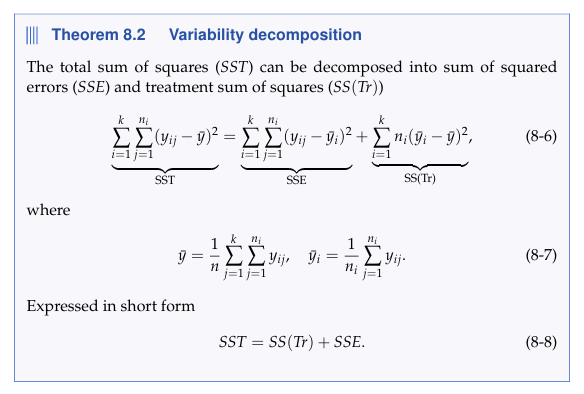

where:

- n is the number of samples
- k is the number of groups (classes)


F-value, Test statistic for ANOVA:

$$
F = \frac{\text{between-group variability}}{\text{within-group variability}}  = \frac{SS /(k-1)}{SSE / (n-k)}
$$

P-value:

- The probability of observing an F-value as extreme as, or more extreme than, the one calculated is found in [F-distribution](https://en.wikipedia.org/wiki/F-distribution) under the null hypothesis. [scipy.stats.f](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.f.html#scipy.stats.f)

::: {.notes}
- SS is the variability between the groups
- SSE is the variability within the groups
- SST is the total variability in the data
:::


In [382]:
# # student t distribution
# from scipy.stats import t as t_dist

# 1 - t_dist.cdf(test_0[:, -1].mean(), df=len(test_0[:, -1]) - 1, loc=y_new.mean(axis=0)[-1], scale=test_0[:, -1].std())
# 1 - t_dist.cdf(test_1[:, -1].mean(), df=len(test_1[:, -1]) - 1, loc=y_new.mean(axis=0)[-1], scale=test_1[:, -1].std())

::: {.callout-note title="Note"}
Here can the values for the ANOVA test be seen, for all data included in the model.

- It can be seen that the Modal flexibility values have an Low F-value and a high p-value, this means that the mean of the Modal flexibility values for class 0 and class 1 are not significantly different. 
    - This is do to the big variance in the Modal flexibility whit in the groups. this variance comes from the power teram of the natrual frequenci in the denominator of the Modal flexibility formula, where the natural frequencies have a big variance.
:::

::: {.callout-note title="Note on P-value"}
The p-value is the probability of observing a test statistic as extreme as, or more extreme than, the one calculated, assuming that the null hypothesis is true. 
:::

In [383]:
#| output: true
# create data
np.random.seed(41)
rand = np.random.randn(y_features.shape[0])
X = np.concatenate([y_features, rand.reshape(-1, 1)], axis=1)

X[:, :-2] = (X[:, :-2] - X[:, :-2].mean(axis=0)) / X[:, :-2].std(axis=0) # standardize features except the last one (MF)
# y[y[:, -1] <= np.percentile(y[:, -1], 99.9), -1].mean(), np.percentile(y[:, -1], 50.2)
X [:, -2] = (y[:, -1] - y[y[:, -1] <= np.percentile(y[:, -1], 99.9), -1].mean()) / y[y[:, -1] <= np.percentile(y[:, -1], 99.9), -1].std() # standardize the last feature (MF) separately
X[:, -1] = (rand - rand.mean()) / rand.std() # standardize the random feature
X[H_vec == 1, -2] = X[H_vec == 1, -2] + np.random.rand(sum(H_vec == 1)) * 100 + 0.5 # add a random shift to the MF feature for H = 1 to make it more important


# analysis 
index = np.ones(y.shape[0], dtype=bool) # use all data points for the ANOVA test
test_0 = X[(H_vec == 0) & index, :]
test_1 = X[(H_vec == 1) & index, :]
X_new = X[index, :]
H_vec_new = H_vec[index]

SS = len(test_0) * (test_0.mean(axis=0) - X_new.mean(axis=0))**2 + len(test_1) * (test_1.mean(axis=0) - X_new.mean(axis=0))**2
SSE = np.sum((test_0 - test_0.mean(axis=0))**2, axis=0) + np.sum((test_1 - test_1.mean(axis=0))**2, axis=0)
SST = np.sum((X_new - X_new.mean(axis=0))**2, axis=0)

k = 2
n = len(X_new)
F = (SS / (k - 1)) / (SSE / (n - k))
print(f"F-statistic: \n{F}")

from scipy.stats import f as f_dist
dfn = k - 1
dfd = n - k
print(f"\np-value:\n{1- f_dist.cdf(F, dfn, dfd)}")

print(f"\nWithin group variance (SSE):\n{SSE}")

F-statistic: 
[5.13793338e+05 5.95003440e+05 6.16149884e+05 5.82021160e+05
 6.02140937e+03 5.27007496e+04 8.72770266e+04 5.70997350e+04
 7.88654425e+04 2.44733455e+00 9.39035713e-02]

p-value:
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.11772494 0.75927208]

Within group variance (SSE):
[6.60591705e+05 6.26957428e+05 6.18754020e+05 6.32102332e+05
 9.94014619e+05 9.49937482e+05 9.19728657e+05 9.45984432e+05
 9.26899514e+05 2.57651588e+15 9.99999906e+05]


here is the result form ANOVA only use features up to the 99.9 quantile of the modal flexibility.

- here can it be seen that the variaction in mean values between class 0 and class 1 for the Modal flexibility is more significant.

In [384]:
#| output: true
from sklearn.feature_selection import f_classif
# F, p_values = f_classif(X[:, :], H_vec)

index = y_features[:, -1] <= np.percentile(y_features[:, -1], 99.9)
F_val, p_values = f_classif(X[index, :], H_vec[index])

print("Feature Importance (F-values):\n", F_val)
print("\nFeature Importance (p-values):\n", p_values)

# (X[H_vec == 0, -2]).mean(), X[H_vec == 1, -2].mean()
# (X[(H_vec == 0) & index, -2].mean(), X[(H_vec == 1) & index, -2].mean())

Feature Importance (F-values):
 [5.17154402e+05 6.01069799e+05 6.22650334e+05 5.88019396e+05
 5.99569843e+03 5.27811385e+04 8.76988201e+04 5.67667389e+04
 7.87979781e+04 1.54496937e+06 9.76022482e-02]

Feature Importance (p-values):
 [0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.75472629]


### Mutual information {.level2}

How much does knowing this feature reduce uncertainty about the class? 

“5.5.3 Mutual information” ([Herlau et al., p. 89](zotero://select/library/items/4P269CF8)) ([pdf](zotero://open-pdf/library/items/Y7FREX6H?page=103&annotation=P5C6SSLY))

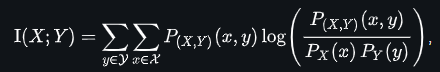


$$ 
I(X; Y) = \sum_{x \in X} \sum_{y \in Y} P_{X, Y}(X, Y) \log\left(\frac{P_{X, Y}(X, Y)}{P_X(X) P_Y(Y)}\right)
$$

where: 

- $I(X; Y)$ is the mutual information between feature $X$ and class label $Y$.
- $P(Y)$ is the probability of being in each class.
    - this is 0.5 given in the cration of the data set.
- $P(X, Y)$ is the joint probability of feature $X$ and class label $Y$.
    - This distribution is pratically unknown, but it can be estimated from the data by the use of [K-nearest neighbor (kNN) density estimation](https://scikit-learn.org/stable/modules/neighbors.html#nearest-neighbors-regression), [Density Estimation](https://scikit-learn.org/stable/modules/density.html#density-estimation)
- $P(X)$ is the probability of feature $X$.
    -This distribution is pratically unknown, but it can be estimated from the data by the use of [K-nearest neighbor (kNN) density estimation](https://scikit-learn.org/stable/modules/neighbors.html#nearest-neighbors-regression), [Density Estimation](https://scikit-learn.org/stable/modules/density.html#density-estimation)

In [385]:
#| output: true
from sklearn.feature_selection import mutual_info_classif
code_run = True
code_run = False
if code_run:
    mi = mutual_info_classif(X, H_vec)
    # save
    np.savez("data/feature_importance_mutual_info.npz", F_val=F_val, p_values=p_values, mi=mi)
data = np.load("data/feature_importance_mutual_info.npz")
mi = data["mi"]
print("Feature Importance (Mutual Information):\n", np.round(mi, 3))
# mi = mutual_info_classif(np.concatenate([X, H_vec.reshape(-1, 1)], axis=1), H_vec)
# print("Feature Importance (Mutual Information):\n", mi)

Feature Importance (Mutual Information):
 [0.459 0.529 0.538 0.533 0.004 0.045 0.1   0.093 0.113 0.693 0.   ]


::: {.callout-note title="What can we see?"}
feature vector:
$$
y = [\omega_1, ... , \omega_n, MAC_{1,1}, ... , MAC_{n,n}, TMAC, MF, dummy]
$$

- It can be seen that omega and MF is quite informative
- it can alos be seen that the Mac values are lees informative
    - MAC 1,1 and 2,2 give an samller value of informaiton then
    - MAC 3.3 and 4.4 which are more informative.
    - TMAC is the most informative MAC value?? 
- It is angine seen that the dummy variable is captured as holing no relevant informaiton about the class labels.
:::

In [386]:
# from sklearn.feature_selection import SelectKBest
# from sklearn.feature_selection import f_classif
# X_new = SelectKBest(f_classif, k=2).fit_transform(X, H_vec)
# X_new.shape

# X_new 

## Model-based feature importance

- Logistic regression coefficients
- Random Forest feature importance for an Decision Tree model
- Permutation importance (for any model)

### Logistic regression coefficients {.level2}

- The features whit the higset absolute vights are the most important?

::: {.callout-note title="Code cell 1: L2 regularization (default)"}
code cell 1 uses L2 regularization, which penalizes large coefficients and in some cases can lead to better generalization performance. 

Penalty:
$$
\sum b_i^2
$$

where $b_i$ are the coefficients of the logistic regression model.
:::

In [387]:
#| echo: true
#| output: true
from sklearn.linear_model import LogisticRegression

model_log = LogisticRegression(penalty='l2')
# model_log.fit(X, H_vec)
model_log.fit(X_new, H_vec_new)

importance = model_log.coef_
print("Feature Importance (Logistic Regression Coefficients):\n",  np.round(importance, 3))

c:\Users\axiom\miniconda3\envs\all\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(


Feature Importance (Logistic Regression Coefficients):
 [[ -6.097  -9.208 -10.349  -8.983   0.018   0.077   0.346   1.03    0.718
   14.023  -0.266]]


::: {.callout-note title="Code cell 2: L1 regularization (Lasso-style)"}
code cell 2 uses L1 regularization, which have an small punishment on large coefficients, but it can lead to sparse models where some coefficients are exactly zero, effectively performing feature selection.

Penalty:
$$
\sum |b_i|
$$

where $b_i$ are the coefficients of the logistic regression model.
:::

In [388]:
#| echo: true
#| output: true
from sklearn.linear_model import LogisticRegression

# Logistic regression with L1 regularization
model_log = LogisticRegression(
    penalty='l1',
    solver='liblinear',
    C=1.0
)
# model_log.fit(X, H_vec)
model_log.fit(X_new, H_vec_new)

importance = model_log.coef_
print("Feature Importance (Logistic Regression Coefficients):\n",  np.round(importance, 3))

c:\Users\axiom\miniconda3\envs\all\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\axiom\miniconda3\envs\all\Lib\site-packages\sklearn\linear_model\_logistic.py:1160: UserWarning: Inconsistent values: penalty=l1 with l1_ratio=0.0. penalty is deprecated. Please use l1_ratio only.
  warnings.warn(


Feature Importance (Logistic Regression Coefficients):
 [[-0.046 -1.626 -1.089 -1.091  0.112  0.006  0.221  0.825 -0.235  0.
  -0.   ]]


c:\Users\axiom\miniconda3\envs\all\Lib\site-packages\sklearn\svm\_base.py:1258: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


### Random Forest feature importance {.level2}

“9.1 Classification trees” ([Herlau et al., p. 154](zotero://select/library/items/4P269CF8)) ([pdf](zotero://open-pdf/library/items/Y7FREX6H?page=168&annotation=3YUTNVQG))

The general idea is to find the decision rule that leads to the biggest purity gain. In the book, it is given as below.

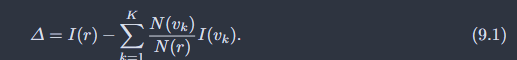

where: 

- $I()$ is the impurity measure (e.g., Gini impurity, entropy)
- $N(v_k)$ is the total number of samples of class $k$ in branch $v$
- $N(r)$ is the number of samples in the root

here is the most common impurity measures: (sklearn uses Gini impurity)

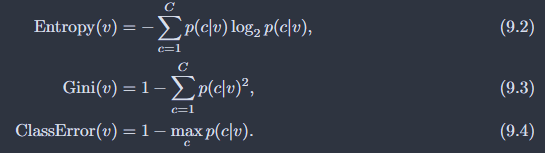

- $p(c|v)$ is the proportion (fraction) of samples of class $c$ in branch $v$.

<!-- :::{.callout-note title="Random Forest"}
Random Forest is an ensemble learning technique where multiple decision trees are trained on different subsets of the data created using bootstrapping (sampling with replacement) and random feature selection. The final prediction is made by averaging the predictions of the individual trees for regression tasks or by majority voting for classification tasks. This approach helps reduce overfitting and improves generalization performance compared to a single decision tree.
::: -->

The total feature purity gain can then be computed by 

$$
\text{Feature Importance}(X_j) = \sum_{\text{split on } X_j}^{T} \Delta
$$

- where $T$ is the total number of splits in the forest that use feature $X_j$.

In the code is this then normalized whit the sum of all feature importance values.

$$
importance(X_j) = \frac{\text{Feature Importance}(X_j)}{\sum_{k=1}^{M} \text{Feature Importance}(X_k)}
$$



In [389]:
#| echo: true
#| output: true
code_run = True
code_run = False
if code_run:
    from sklearn.ensemble import RandomForestClassifier

    model_rf = RandomForestClassifier()
    # model_rf.fit(X, H_vec)
    model_rf.fit(X_new, H_vec_new)

    # Save ML model whit pickle
    import pickle
    with open("data/ML/random_forest_model.pkl", "wb") as f:
        pickle.dump(model_rf, f)
else:
    # Load ML model with pickle
    import pickle
    with open("data/ML/random_forest_model.pkl", "rb") as f:
        model_rf = pickle.load(f)

importance = model_rf.feature_importances_
print("Feature Importance (Random Forest):\n", np.round(importance, 3))

Feature Importance (Random Forest):
 [0.08  0.099 0.202 0.161 0.    0.001 0.01  0.001 0.009 0.436 0.   ]


### Permutation importance {.level2}

what does "sklearn.inspection.permutation_importance" do?

- It computes the model's performance on the test set.
- Then it randomly permutes/shuffles the values of a single feature.
- Then it computes the model performance on the test set again with the permuted feature.
- This is done for all features, and the importance of each feature is then computed as the decrease in model performance when that feature is permuted.

::: {.callout-note title="Note on permutation importance"}
- This gives some insight to how much the an specific desigin model is relying on an specific feature for making its predictions.

Results are only valid for the specific desigin model.
:::

In [390]:
#| echo: true
#| output: true

from sklearn.inspection import permutation_importance
result = permutation_importance(model_log, X_new, H_vec_new, n_repeats=4)

importance = result.importances_mean
print("Feature Importance (Permutation Importance):\n", np.round(importance, 3))

Feature Importance (Permutation Importance):
 [-0.001  0.144  0.099  0.094  0.001  0.     0.003  0.008  0.004  0.
 -0.   ]


In [391]:
#| echo: true
#| output: true
# from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance
from sklearn.linear_model import LogisticRegression

# Split
X_train, X_test, y_train, y_test = train_test_split(
    X_new, H_vec_new, random_state=42
)

# Train model
# model = RandomForestClassifier(random_state=42)
# model.fit(X_train, y_train)
model_log2 = LogisticRegression()
# model_log.fit(X, H_vec)
model_log2.fit(X_train, y_train)

# Compute permutation importance
result = permutation_importance(
    model_log2,
    X_test,
    y_test,
    n_repeats=10, # number of times to permute a feature
    random_state=42
)

# Print importance scores
print("Feature Importance (Permutation Importance):\n", np.round(result.importances_mean, 3))

Feature Importance (Permutation Importance):
 [ 0.044  0.074  0.083  0.071  0.     0.     0.     0.    -0.     0.323
  0.   ]


### Recursive Feature Elimination (RFE) {.level2}

what dos Recursive Feature Elimination (RFE) do?

- It trains a model.
- measure feature importance (Only some model claculate feature importance)
- Remove the least important feature.
- Repeat until the desired number of features is reached.


::: {.content-hidden}
::: {.callout-note title="Note on RFE"}
improtance is called form "model.coef_" or model.feature_importances_
:::
:::

In [392]:
#| echo: true
#| output: true
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()

rfe = RFE(
    estimator=model,
    n_features_to_select=1
)

rfe.fit(X_train, y_train)
print("Feature Ranking (RFE):\n", rfe.ranking_)

Feature Ranking (RFE):
 [ 5  4  1  2 10 11  9  6  7  3  8]


### Other Options for feature selection: {.level2}

- Do K-fold cross validation to evaluate the decision model performance for different subsets of features, and then select the subset that gives the best performance. 

note: This is more computational expensive if i have a lot of features or an lot of model parametes to optimize.

## Chsoen data split

I have chosen to use the reduced feature set of all of all omega value and then the modal flexibility.

In [393]:
#| echo: true
#| output: true
# select the first 4 features and and MF that is number 8
selected_features = [0, 1, 2, 3, 8]
X_reduced = X[:, selected_features].copy()
X_reduced

# split the reduced data + matching delta_E_samples
X_train, X_test, y_train, y_test, delta_E_train, delta_E_test, states_train, states_test = train_test_split(
    X_reduced,
    H_vec,
    delta_E_samples,
    states_bar,
    test_size=0.2,
    random_state=42
)

# make the same 

In [394]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((800000, 5), (200000, 5), (800000,), (200000,))

# Training of decision model (Step 4)

I have 2 options for building an decision rule:

1. Fit an Density Estimator on my data an ude Bayes rule to make a decision.
    - Gaussian Mixture Model (GMM)
    - K-nearest neighbor (kNN) density estimation
    - Kernel Density Estimation (KDE)
2. Train a Black box model to make a decision.
    - Logistic regression
    - Decision Tree
        - Random Forest
    - K-nearest neighbor (kNN) classification


<!-- - Logistic regression (for estimating $P(H_i \mid y)$ directly) -->

## Density Estimation

What is my options now?

- Probabilistic models
    - Estimate $P(y \mid H_i)$ from data (Simy supervised learning)
    - Estimate $P(y \mid \theta_i)$ from data (Simy supervised learning)
    - Estimate $P(\theta_{new} \mid y)$ from data (100% unsupervised learning)
        - $\theta_{new}$ the new damage states that the unsupervised model constructs based on the features.

It is hard to estimate this probabilitys analytically, one because we do not kow the OMA error function??? and two if we did would we not get a nice Analytical form suliton for the modal flexibility, and the MAC values.

[Density Estimation](https://scikit-learn.org/stable/modules/density.html#kernel-density) form data?

- Gaussian Mixture Model (GMM)
- K-nearest neighbor (kNN) density estimation
- Kernel Density Estimation (KDE)

### Gaussian Mixture Model (GMM) - Genral idea {.level2}

A single Gaussian distribution is:

$$
\mathcal{N}(\mu, \Sigma)
$$

where:

* $\mu$ = mean vector
* $\Sigma$ = covariance matrix

A GMM combines several Gaussians:

$$
p(x)=\sum_{k=1}^{K}\pi_k \mathcal{N}(x \mid \mu_k,\Sigma_k)
$$

where:

* $K$ = number of clusters
* $\pi_k$ = cluster probability
* $\mu_k$ = cluster mean
* $\Sigma_k$ = covariance matrix



::: {.callout-note title="Covariance matrix for GMM in sklearn"}

covariance_type='full':

- Each cluster gets its own full covariance matrix.

covariance_type='diag':

- Each cluster gets its own diagonal covariance matrix. 

covariance_type='spherical':

- Each cluster has one variance value. (clusters are circular)

covariance_type='tied':

- All clusters share one covariance matrix.

:::

::: {.callout-tip title="What have i done?"}
Here in the code below have i trained the GMM for 2 clusters, each whit there own full covariance matrix. this corespond to.

$$
P(\theta_{new} \mid x) 
$$

- This is whith the assumption that the data can be well described by 2 Gaussian distributions, each with its own mean and covariance matrix.
- $x$ is the feature vector.

Note: This model makes 2 new classes but it is not equal to the classes being H=0 and H=1.
:::

::: {.callout-note title="Baddd Generalization"}
- This model hass learned the worng prior wights, because of the importance sampling the data set.
- there for whut the priors need to be updated to what was expected in an real casse (GMM Weights)
::: 

GMM Converged: True
GMM Weights: [0.56634945 0.43365055]
GMM Means:
 [[ 0.57569601  0.60176465  0.60736899  0.59697979  0.27123454]
 [-0.75085048 -0.78528921 -0.79271114 -0.77919865 -0.35331963]]


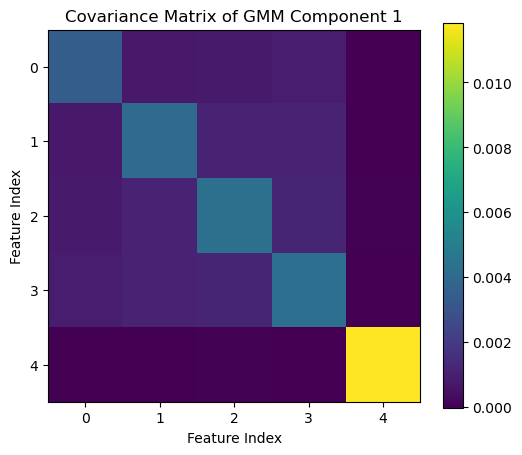

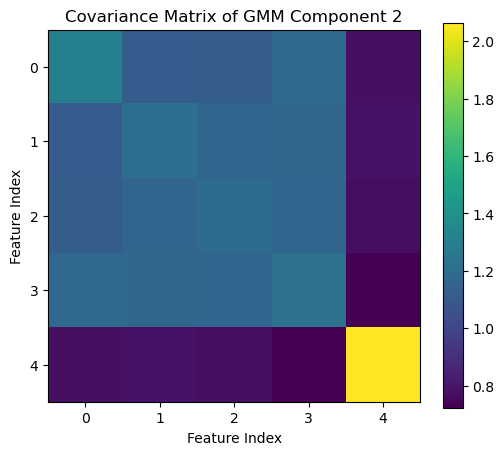

In [395]:
#| echo: false
#| output: true
from sklearn.mixture import GaussianMixture

gmm = GaussianMixture(
    n_components=2,
    # n_components=2,
    covariance_type='full', # 'full', 'tied', 'diag', 'spherical'
    max_iter=100, # maximum number of iterations
    n_init=2, # number of initializations to perform
    random_state=42
)

gmm.fit(X_train)


print("GMM Converged:", gmm.converged_)
print("GMM Weights:", gmm.weights_)
print("GMM Means:\n", gmm.means_)
# print("GMM Covariances:\n", gmm.covariances_)

# plto COV matrix of the GMM components
if gmm.covariance_type != 'tied':
    for i in range(gmm.n_components):
        plt.figure(figsize=(6, 5))
        plt.imshow(gmm.covariances_[i], cmap='viridis')
        plt.colorbar()
        plt.title(f'Covariance Matrix of GMM Component {i+1}')
        plt.xlabel('Feature Index')
        plt.ylabel('Feature Index')
        plt.grid(False)
        plt.show()

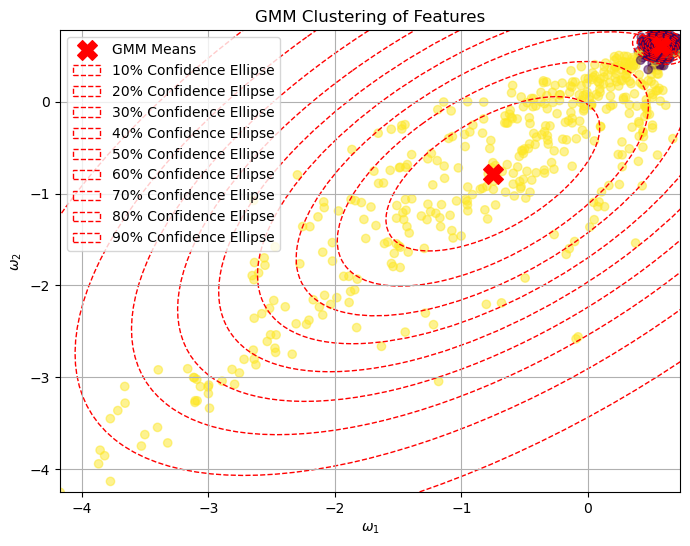

In [396]:
#| echo: false
#| output: true
data = X_test[:10**3, :]
gmm_labels = gmm.predict(data)
# print("GMM Cluster Assignments:\n", gmm_labels)

plt.figure(figsize=(8,6))
plt.scatter(data[:, 0], data[:, 1], c=gmm_labels, cmap='viridis', alpha=0.5)
plt.xlabel(r'$\omega_1$')
plt.ylabel(r'$\omega_2$')
plt.title('GMM Clustering of Features')
# plot the GMM means
plt.scatter(gmm.means_[:, 0], gmm.means_[:, 1], c='red', marker='X', s=200, label='GMM Means')
# PLOT the 10, 20 , 30 , 40 , 50, 60, 70, 80, 90% quantity contour of the GMM components
prob = gmm.predict_proba(data)
from scipy.stats import chi2
if gmm.covariance_type != 'tied':
    for i in range(gmm.n_components):
        mean = gmm.means_[i]
        cov = gmm.covariances_[i]
        # compute the eigenvalues and eigenvectors of the covariance matrix
        eigvals, eigvecs = np.linalg.eigh(cov)
        # sort the eigenvalues and eigenvectors in descending order
        order = np.argsort(eigvals)[::-1]
        eigvals = eigvals[order]
        eigvecs = eigvecs[:, order]
        # compute the angle of the ellipse
        angle = np.arctan2(eigvecs[1, 0], eigvecs[0, 0])
        # compute the width and height of the ellipse for different confidence levels
        for conf in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]:
            chi2_val = chi2.ppf(conf, df=2)
            width = 2 * np.sqrt(eigvals[0] * chi2_val)
            height = 2 * np.sqrt(eigvals[1] * chi2_val)
            # plot the ellipse
            from matplotlib.patches import Ellipse
            ellipse = Ellipse(
                xy=mean,
                width=width,
                height=height,
                angle=np.degrees(angle),
                edgecolor='red',
                facecolor='none',
                linestyle='--',
                label=f'{int(conf*100)}% Confidence Ellipse' if i == 0 else None
            )
            plt.gca().add_patch(ellipse)
plt.legend()
plt.ylim(data[:, 1].min(), data[:, 1].max())
plt.xlim(data[:, 0].min(), data[:, 0].max())
plt.grid(True)
plt.show()

GMM Component Probabilities for First Test Sample:
 [[9.99957206e-01 4.27938498e-05]]
Sum of Probabilities (should be 1): 0.9999999999999996
y value for the first test sample: 0


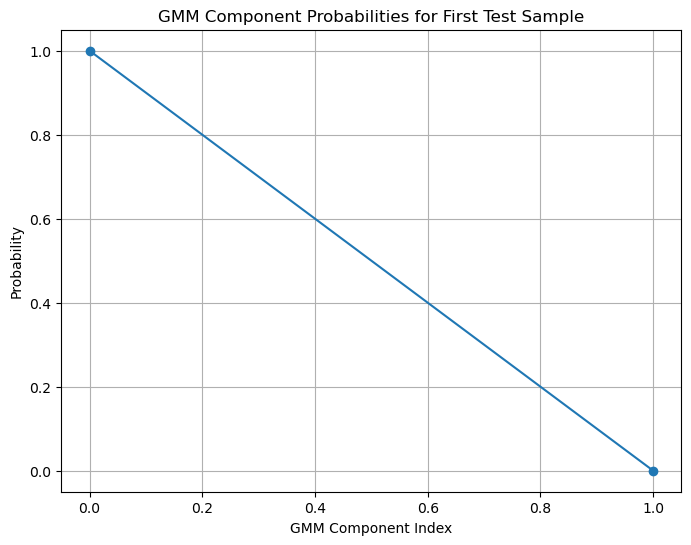

In [397]:
P = gmm.predict_proba(X_test[0:1, :])
print("GMM Component Probabilities for First Test Sample:\n", P)
print("Sum of Probabilities (should be 1):", P.sum())
print(f"y value for the first test sample: {y_test[0]}")

plt.figure(figsize=(8,6))
plt.plot(P[0], marker='o')
plt.xlabel('GMM Component Index')
plt.ylabel('Probability')
plt.title('GMM Component Probabilities for First Test Sample')
plt.grid(True)
plt.show()


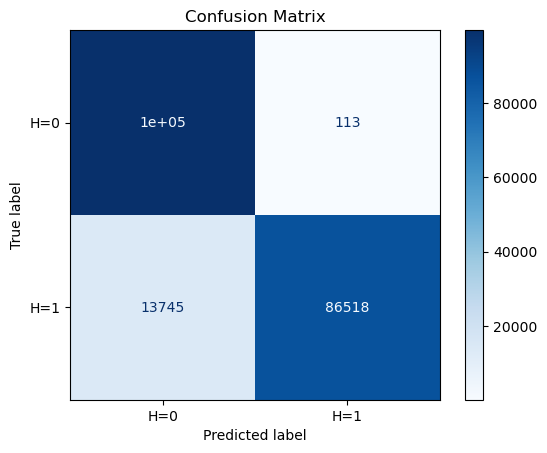

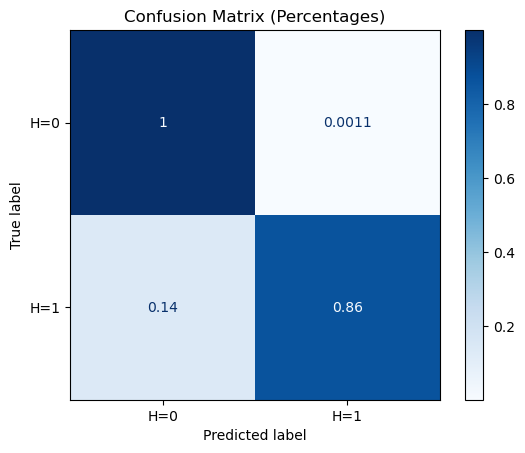

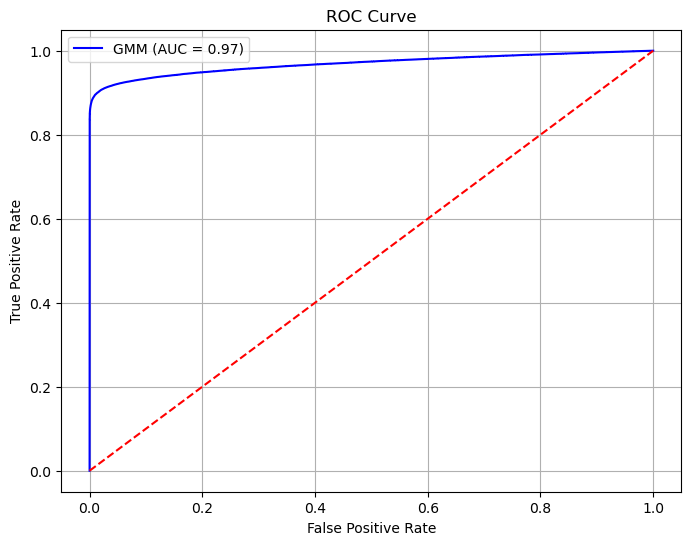

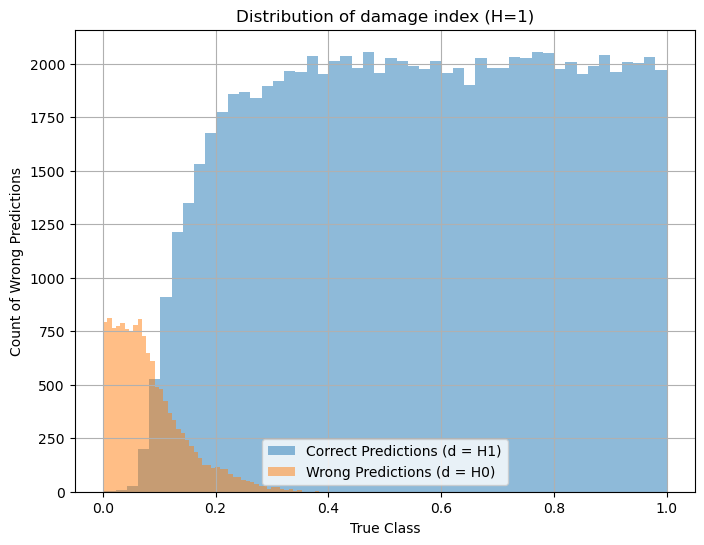

In [398]:
#| echo: false
#| output: true
test_pred = gmm.predict(X_test[:, :])

# make a confusion matrix for the GMM predictions
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test, test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['H=0', 'H=1'])
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

# Plot of confusion matrix with percentages
cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
disp_percent = ConfusionMatrixDisplay(confusion_matrix=cm_percent, display_labels=['H=0', 'H=1'])
disp_percent.plot(cmap='Blues')
plt.title('Confusion Matrix (Percentages)')
plt.show()

# plto the ROC curve for the GMM predictions
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(y_test, gmm.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='blue', label=f'GMM (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.grid(True)
plt.show()


# plot histogram of damage index for worng predictions 
wrong_pred_1 = (test_pred != y_test ) & (y_test == 1) # only look at the wrong predictions for H = 1
# plot histogram of damage index for correct predictions
correct_pred_1 = (test_pred == y_test ) & (y_test == 1) # only look at the correct predictions for H = 1
plt.figure(figsize=(8,6))
plt.hist(delta_E_test[correct_pred_1], bins=50, alpha=0.5, rwidth=1.0, histtype='stepfilled', label='Correct Predictions (d = H1)')
plt.hist(delta_E_test[wrong_pred_1], bins=50, alpha=0.5, rwidth=1.0, histtype='stepfilled', label='Wrong Predictions (d = H0)')
plt.xlabel('True Class')
plt.ylabel('Count of Wrong Predictions')
plt.title('Distribution of damage index (H=1)')
plt.legend()
plt.grid(True)
plt.show()



::: {.callout-note title="How to read an roc curve?"}
[Receiver Operating Characteristic (ROC) curve](https://www.displayr.com/what-is-a-roc-curve-how-to-interpret-it/), [StatQuest](https://www.youtube.com/watch?v=4jRBRDbJemM):

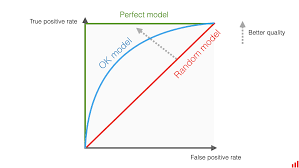{width=50%}

- y-axis: True Positive Rate (TPR) = $\frac{TP}{TP + FN}$
    - Number of true positives (TP) relative to the total number of actual positives (H=1).
- x-axis: False Positive Rate (FPR) = $\frac{FP}{FP + TN}$
    - Number of false positives (FP) relative to the total number of actual negatives (H=0).
- Area Under the Curve (AUC): A single scalar value that summarizes the overall performance of the classifier. AUC ranges from 0 to 1, where 1 indicates perfect classification and 0.5 indicates random guessing.

Note: Each point on the ROC curve corresponds to a different threshold for classifying a sample. 

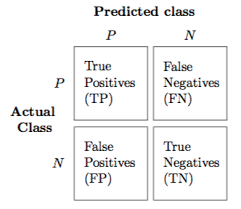{width=20%}

:::

### K-nearest neighbor (kNN) density estimation {.level2}

::: {.callout-note title="Reference"}
- [Density Estimation: k-Nearest Neighbor](https://faculty.washington.edu/yenchic/18W_425/Lec7_knn_basis.pdf)
- “K-nearest neighbor (KNN) density estimation” ([Falk, p. 4](zotero://select/library/items/FR9MG5DA)) ([pdf](zotero://open-pdf/library/items/RXEYQQS4?page=4&annotation=TGZEFRV8))
:::

General idea: 

1. find the distance to the k-th nearest neighbor. $r_k(x)$
2. Compute the volume  $V(x)$
3. Estimate the density $\hat{p}(x)$

$$
\hat{p}(x) = \frac{k}{n V(x)}
$$

where:

- $k$ is the number of nearest neighbors
- $n$ is the total number of samples
- $V(x) = c_d r_k(x)^d$ is the volume of the hypersphere defined by the distance to the k-th nearest neighbor.
    - $c_d = \frac{\pi^{d/2}}{\Gamma(\frac{d}{2} + 1)}$ is a constant depending on the dimension $d$
    - $r_k(x)$ is the distance from the point $x$ to its k-th nearest neighbor.
    - $d$ is the dimensionality of the feature space.

::: {.callout-tip title="What have i done?"}
I split the Training data up into 2 classes H=0 and H=1, and then i trained a kNN density estimator for each class. this corespond to.

$$
P(x \mid H) = \frac{k}{n V(x)}, \quad \text{where } x = H, \quad H \in \{0, 1\}
$$

- $x$ is the feature vector.

Note: this is the liklihood function that i can use in Bayes rule to compute the posterior distribution $P(H \mid x)$
:::

In [399]:
from sklearn.neighbors import NearestNeighbors
from scipy.special import gamma

class KNN_density_estimator:
    def __init__(self, n_neighbors=20):
        self.n_neighbors = n_neighbors

    def P_H1_given_X_train(self, X_train_H1):
        self.n_H1, self.d_H1 = X_train_H1.shape
        # fit neighbor search
        self.nbrs_H1 = NearestNeighbors(
            n_neighbors= 20, # k nearest neighbors
            algorithm='auto',
            metric='euclidean'
        )
        self.nbrs_H1.fit(X_train_H1)
        print(f"Training done with KNN density estimator with {self.n_H1} samples and {self.d_H1} features")
    
    def P_H0_given_X_train(self, X_train_H0):
        self.n_H0, self.d_H0 = X_train_H0.shape
        # fit neighbor search
        self.nbrs_H0 = NearestNeighbors(
            n_neighbors= 20, # k nearest neighbors
            algorithm='auto',
            metric='euclidean'
        )
        self.nbrs_H0.fit(X_train_H0)
        print(f"Training done with KNN density estimator with {self.n_H0} samples and {self.d_H0} features")


    def probability_density(self, nbrs, n , d):
        # distances to k nearest neighbors
        distances, indices = nbrs.kneighbors(X_test)

        # distance to kth neighbor
        rk = distances[:, -1]

        # volume constant for d-dimensional sphere
        cd = np.pi**(d/2) / gamma(d/2 + 1)

        # hypersphere volume
        V = cd * (rk ** d)

        # density estimate
        density = self.n_neighbors / (n * V)

        return density



    def P_H1_given_X(self, X_test):
        # density estimate for H=1
        p_H1 = self.probability_density(self.nbrs_H1, self.n_H1, self.d_H1)

        return p_H1

    def P_H0_given_X(self, X_test):
        # density estimate for H=0
        p_H0 = self.probability_density(self.nbrs_H0, self.n_H0, self.d_H0)

        return p_H0
    

In [400]:
#| echo: true
#| output: true
knn_density = KNN_density_estimator(n_neighbors=20)
knn_density.P_H1_given_X_train(X_train[y_train == 1])
knn_density.P_H0_given_X_train(X_train[y_train == 0])

p_H1 = knn_density.P_H1_given_X(X_test)
p_H0 = knn_density.P_H0_given_X(X_test)

Training done with KNN density estimator with 400564 samples and 5 features
Training done with KNN density estimator with 399436 samples and 5 features


::: {.callout-note title="Bayesian rule for decision making"}
Use the law of total probability: 
$$
P(H \mid x) \propto P(x \mid H) P(H)
$$

Use an index of 0.5 to make a decision:
$$
d = \begin{cases}
1 & \text{if } P(H=1 \mid x) > 0.5 \\
0 & \text{otherwise}   
\end{cases}
$$

:::

In [401]:
#| echo: true
#| output: true
# Bayesian decision rule
knn_prior = np.array([0.5, 0.5]).T # prior probabilities for H=0 and H=1

posterior = np.multiply(knn_prior, np.array([p_H0, p_H1]).T) # unnormalized posterior probabilities
posterior = posterior / posterior.sum(axis=1, keepdims=True) # normalize to get proper probabilities

# classify based on maximum posterior probability
knn_predictions = np.argmax(posterior, axis=1)


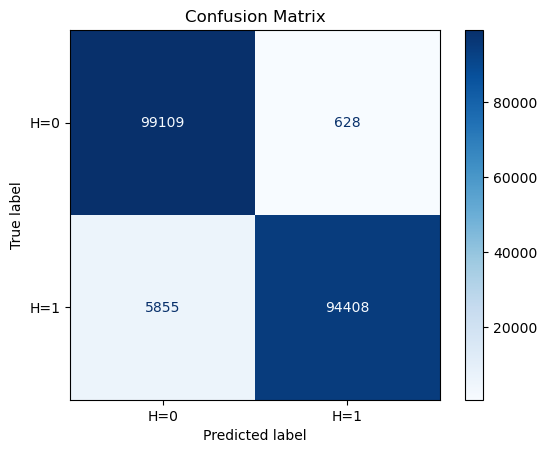

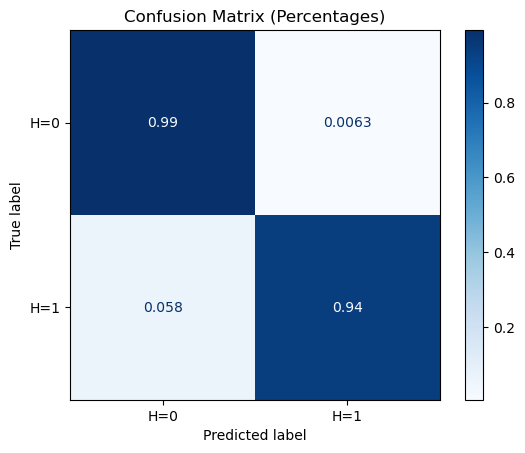

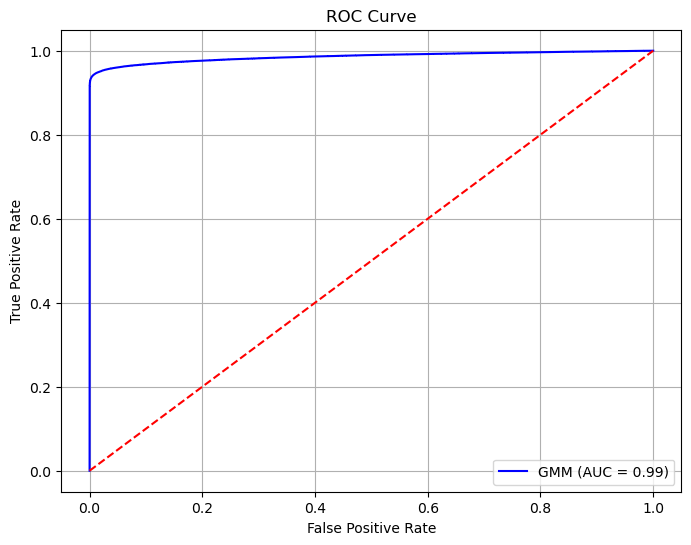

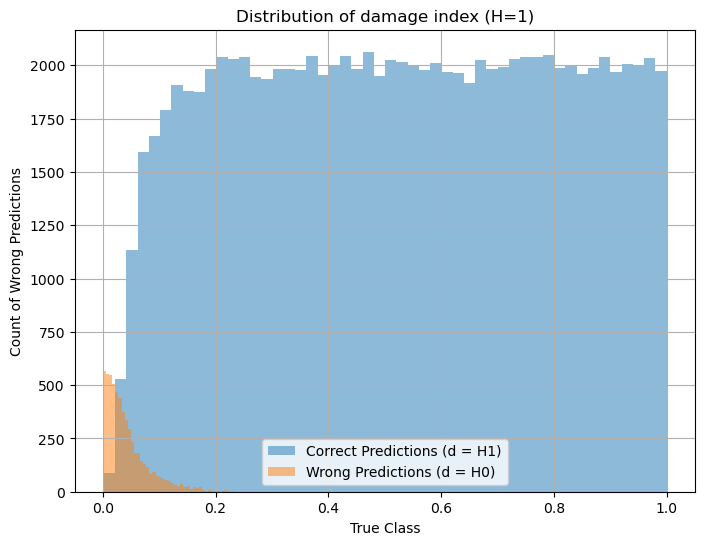

In [402]:
#| echo: false
#| output: true
test_pred = knn_predictions

# make a confusion matrix for the GMM predictions
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test, test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['H=0', 'H=1'])
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

# Plot of confusion matrix with percentages
cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
disp_percent = ConfusionMatrixDisplay(confusion_matrix=cm_percent, display_labels=['H=0', 'H=1'])
disp_percent.plot(cmap='Blues')
plt.title('Confusion Matrix (Percentages)')
plt.show()

# plto the ROC curve for the GMM predictions
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(y_test, posterior[:, 1])
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='blue', label=f'GMM (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.grid(True)
plt.show()


# plot histogram of damage index for worng predictions 
wrong_pred_1 = (test_pred != y_test ) & (y_test == 1) # only look at the wrong predictions for H = 1
# plot histogram of damage index for correct predictions
correct_pred_1 = (test_pred == y_test ) & (y_test == 1) # only look at the correct predictions for H = 1
plt.figure(figsize=(8,6))
plt.hist(delta_E_test[correct_pred_1], bins=50, alpha=0.5, rwidth=1.0, histtype='stepfilled', label='Correct Predictions (d = H1)')
plt.hist(delta_E_test[wrong_pred_1], bins=50, alpha=0.5, rwidth=1.0, histtype='stepfilled', label='Wrong Predictions (d = H0)')
plt.xlabel('True Class')
plt.ylabel('Count of Wrong Predictions')
plt.title('Distribution of damage index (H=1)')
plt.legend()
plt.grid(True)
plt.show()



::: {.callout-note title="This Histogram is somewhat misleading"}
This histogram is misleading because i have the same number of bines for both casses, i would be better to use some scaling rull like the one in the prob-book bassed on the number of samples 
:::

### Kernel Density Estimation (KDE) {.level2}


Note don !!

# Analysis 1

- **Evaluation method**: Monte Carlo simulation with importance sampling
- **likelihood**: Explicit likelihood for Modal properties (no use of features)
- **Decision rule**: Maximum a posteriori (MAP) decision rule $d(y) = \arg\max_{H} p(H \mid y)$  

New stuff:

- **Continuous damage reduction factor**: $\delta E$
    - **$P(\delta E \mid \theta)$**: Probability of level of stiffness reduction
- **$P(\text{failure} \mid \delta E, \theta)$**: Probability of failure given stiffness reduction and damage state
- **Updated cost function**: Expected cost given damage


# Test

## Likelihood evaluation P(y | theta)

In [403]:
# using quadrature to compute the likelihood
import numpy as np
from scipy.special import roots_jacobi
from scipy.special import roots_jacobi, beta as beta_func
from scipy.stats import norm

def beta_gauss_jacobi_likelihood(y, g, alpha, beta, sigma, n_points=20):
    """
    Computes p(y) using Gauss–Jacobi quadrature.

    Parameters:
    ----------
    y : float
    g : callable (black-box function)
    alpha, beta : Beta parameters
    sigma : noise std
    n_points : number of quadrature nodes
    """

    # Get Gauss-Jacobi nodes (t) and weights (w) on [-1, 1]
    # NOTE: scipy uses parameters (alpha-1, beta-1)
    t, w = roots_jacobi(n_points, alpha - 1, beta - 1)

    # Transform nodes to [0,1]
    x = (t + 1) / 2

    # Evaluate black-box function
    gx = np.array([g(xi) for xi in x])

    # Gaussian likelihood term
    likelihood_vals = norm.pdf(y, loc=gx, scale=sigma)

    # Combine everything
    # IMPORTANT: scaling factor due to transformation
    integral = np.sum(w * likelihood_vals)

    # Normalize Beta function constant
    # SciPy's weights already incorporate the polynomial weight,
    # so we only adjust by scaling factor:
    integral *= 0.5  # due to dx/dt = 1/2
    integral /= beta_func(alpha, beta)

    return integral

def log_likelihood(y, g, alpha, beta, sigma, n_points=20):
    t, w = roots_jacobi(n_points, alpha - 1, beta - 1)
    x = (t + 1) / 2

    gx = np.array([g(xi) for xi in x])
    log_vals = norm.logpdf(y, loc=gx, scale=sigma)

    # log-sum-exp trick
    m = np.max(log_vals)
    integral = np.sum(w * np.exp(log_vals - m))


    return np.log(0.5) + m + np.log(integral) - np.log(beta_func(alpha, beta))


"""This one works? """
from numpy.polynomial.legendre import leggauss
from scipy.stats import norm, beta as beta_dist
import numpy as np

def stable_quadrature(y, g, alpha, beta_param, sigma, n_points=50):
    
    # Gauss-Legendre nodes on [-1,1]
    t, w = leggauss(n_points)
    
    # map to [0,1]
    x = 0.5 * (t + 1)
    
    gx = np.array([g(xi) for xi in x])
    
    # FULL integrand (including Beta)
    integrand = norm.pdf(y, loc=gx, scale=sigma) * beta_dist.pdf(x, alpha, beta_param)
    
    return 0.5 * np.sum(w * integrand)

In [404]:
# Using Monte carlo sampling to estimate the likelihood
import numpy as np
from scipy.stats import beta, norm

def mc_likelihood(y, g, alpha, beta_param, sigma, S=1000, seed=None):
    rng = np.random.default_rng(seed)
    
    # Sample x ~ Beta
    x_samples = rng.beta(alpha, beta_param, size=S)
    
    # Evaluate black-box function
    gx = np.array([g(x) for x in x_samples])
    
    # Compute Gaussian likelihood values
    likelihood_vals = norm.pdf(y, loc=gx, scale=sigma)
    
    # Monte Carlo estimate
    return np.mean(likelihood_vals)

def mc_log_likelihood(y, g, alpha, beta_param, sigma, S=1000, seed=None):
    rng = np.random.default_rng(seed)
    x_samples = rng.beta(alpha, beta_param, size=S)
    
    gx = np.array([g(x) for x in x_samples])
    log_vals = norm.logpdf(y, loc=gx, scale=sigma)
    
    # log-sum-exp trick
    m = np.max(log_vals)
    return m + np.log(np.mean(np.exp(log_vals - m)))

def mc_log_likelihood_shared(y_data, g, alpha, beta_param, sigma, S=5000, seed=42):
    rng = np.random.default_rng(seed)
    
    # sample ONCE
    x_samples = rng.beta(alpha, beta_param, size=S)
    gx = np.array([g(x) for x in x_samples])
    
    total = 0.0
    
    for y in y_data:
        log_vals = -0.5 * ((y - gx)/sigma)**2 - np.log(np.sqrt(2*np.pi)*sigma)
        
        m = np.max(log_vals)
        total += m + np.log(np.mean(np.exp(log_vals - m)))
    
    return total


In [405]:
def g(x):
    # totally arbitrary black-box
    return np.sin(5*x) + x**2
    # return x**2
    # return 0

y = 0.2
alpha, beta = 2.0, 5.0
sigma = 0.1

p_y = beta_gauss_jacobi_likelihood(y, g, alpha, beta, sigma, n_points=100)
print(p_y)

p_y_mc = mc_likelihood(y, g, alpha, beta, sigma, S=10**4, seed=42)
print(p_y_mc)


py = log_likelihood(y, g, alpha, beta, sigma)
print(np.exp(py))

py_mc_log = mc_log_likelihood(y, g, alpha, beta, sigma, S=10**5, seed=10**6)
print(np.exp(py_mc_log))

py_stable = stable_quadrature(y, g, alpha, beta, sigma, n_points=100)
print(py_stable)

19.97332219038685
0.27203770917896974
19.0985350523472
0.26355120563014944
0.26181423323200265


In [406]:

def g(x):
    # totally arbitrary black-box
    return np.sin(5*x) + x**2
    # return x**2
    return 0

p_ref = mc_likelihood(y, g, alpha, beta, sigma, S=10_000_000, seed=42)
# p_ref = mc_log_likelihood_shared(y, g, alpha, beta, sigma, S=10_000_000, seed=42)
p_quad = beta_gauss_jacobi_likelihood(y, g, alpha, beta, sigma, n_points=200)
p_mc   = mc_likelihood(y, g, alpha, beta, sigma, S=1_000_000, seed=42)

print(p_ref, p_quad, p_mc)

# norm.pdf(y, loc=0, scale=sigma)

stable_quadrature(y, g, alpha, beta, sigma, n_points=30) - p_ref

0.26207359905803296 19.973322190386842 0.26262109565941394


np.float64(-0.0001567202165473347)

## Main approaches to build the full distribution

| Method            | One-time cost | Reusable | Accuracy  |
| ----------------- | ------------- | -------- | --------- |
| Monte Carlo per y | cheap         | ❌        | high      |
| Quadrature        | medium        | ❌        | high      |
| Sampling + KDE    | expensive     | ✅        | high      |
| Gaussian mixture  | expensive     | ✅        | very high |

### Grid evaluation (slow to build, but fast to evaluate)

✅ Pros:

- simple
- robust

❌ Cons:

- expensive to build
- resolution limited

In [407]:

ys = np.linspace(-10, 10, 10**3)

p_vals = [
    # mc_likelihood(y, g, alpha, beta, sigma, S=100000)
    
    stable_quadrature(y, g, alpha, beta, sigma, n_points=50)
    for y in ys
]

In [408]:
from scipy.interpolate import interp1d

p_interp = interp1d(ys, p_vals, kind='cubic')


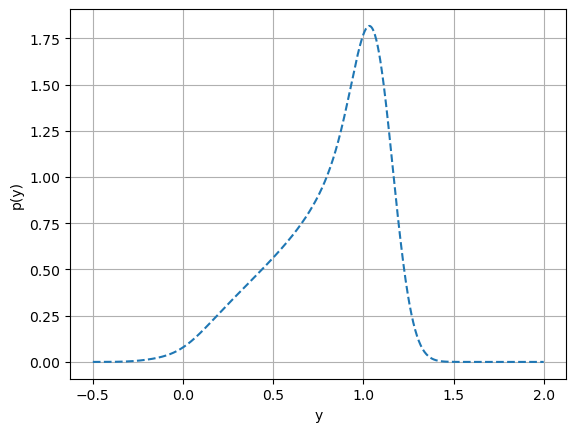

In [409]:
# plt.plot(ys, p_vals, label='MC Likelihood')
x = np.linspace(-0.5, 2, 1000)
plt.plot(x, p_interp(x), label='Interpolated', linestyle='--')
plt.xlabel('y')
plt.ylabel('p(y)')
plt.grid()

### Build density from y samples? (fast to build, but slow to evaluate)

- generate y samples
- build density from the samples (e.g., kernel density estimation, histogram, etc.)

✅ Pros:

- very flexible
- works perfectly with black-box g
- reusable

❌ Cons:

- KDE smoothing error

In [410]:
def sample_y(g, alpha, beta_param, sigma, N=100000):
    x = np.random.beta(alpha, beta_param, size=N)
    noise = np.random.normal(0, sigma, size=N)
    y = np.array([g(xi) for xi in x]) + noise
    return y

In [411]:
from scipy.stats import gaussian_kde

y_samples = sample_y(g, alpha, beta, sigma, N=100000)
kde = gaussian_kde(y_samples)

kde(0.2)  # estimate p(y)

array([0.26004217])

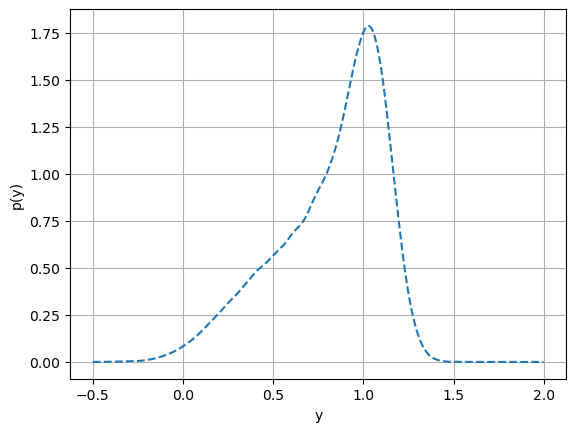

In [412]:
# plt.plot(ys, p_vals, label='MC Likelihood')
x = np.linspace(-0.5, 2, 1000)
plt.plot(x, kde(x), label='Interpolated', linestyle='--')
plt.xlabel('y')
plt.ylabel('p(y)')
plt.grid()

### Mixture approximation (simple and precise, but slow to evaluate)

::: {.callout-note title="Note"}
- This is what i have done with MC sampling earlier
:::

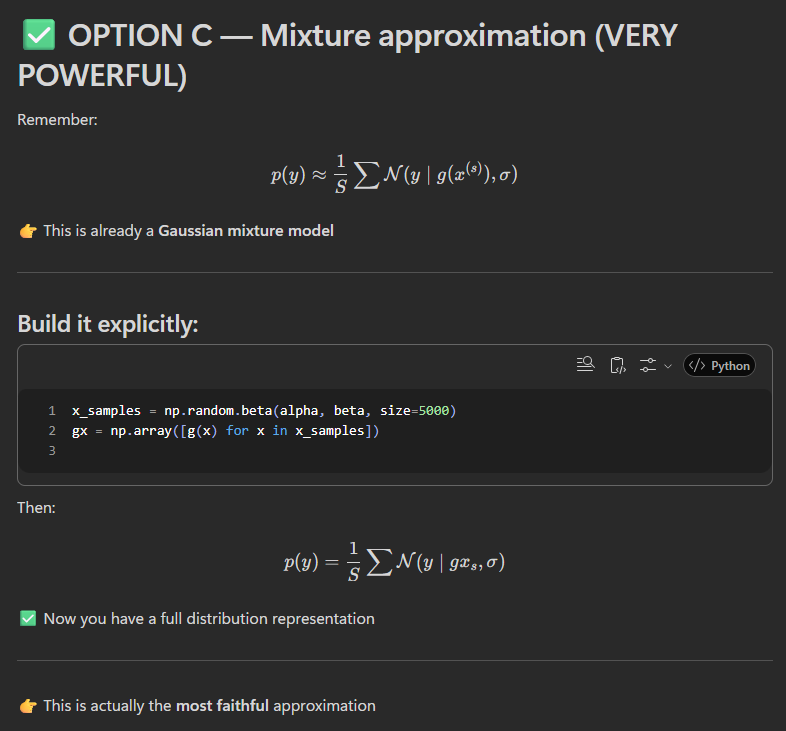

In [413]:
import numpy as np

def build_gmm(g, alpha, beta_param, sigma, S=5000, seed=42):
    rng = np.random.default_rng(seed)
    
    # Sample latent variable
    x_samples = rng.beta(alpha, beta_param, size=S)
    
    # Pass through black-box function
    gx = np.array([g(x) for x in x_samples])
    
    # Store mixture components
    return {
        "means": gx,           # μ_s = g(x_s)
        "sigma": sigma         # same variance for all
    }


In [414]:
from scipy.stats import norm

def gmm_pdf(y, gmm):
    means = gmm["means"]
    sigma = gmm["sigma"]
    
    return np.mean(norm.pdf(y, loc=means, scale=sigma))

def gmm_logpdf(y, gmm):
    means = gmm["means"]
    sigma = gmm["sigma"]
    
    log_vals = norm.logpdf(y, loc=means, scale=sigma)
    
    m = np.max(log_vals)
    return m + np.log(np.mean(np.exp(log_vals - m)))


In [415]:
# def g(x):
#     return np.sin(5*x) + x**2

# alpha, beta_param = 2.0, 5.0
# sigma = 0.1

# Build mixture once
gmm = build_gmm(g, alpha, beta, sigma, S=10**2)
print(f"gmm means (first 5): {gmm['means'][:5]}")
print(f"gmm sigma: {gmm['sigma']}")

# Evaluate many times cheaply
print(gmm_pdf(0.2, gmm))
print(gmm_pdf(0.5, gmm))
print(gmm_logpdf(0.2, gmm))

gmm means (first 5): [0.99853527 1.06938808 1.0807676  1.08618348 1.04235609]
gmm sigma: 0.1
0.25533954910148426
0.5360727031316584
-1.3651610544664652


In [416]:
gmm['means'].shape

(100,)

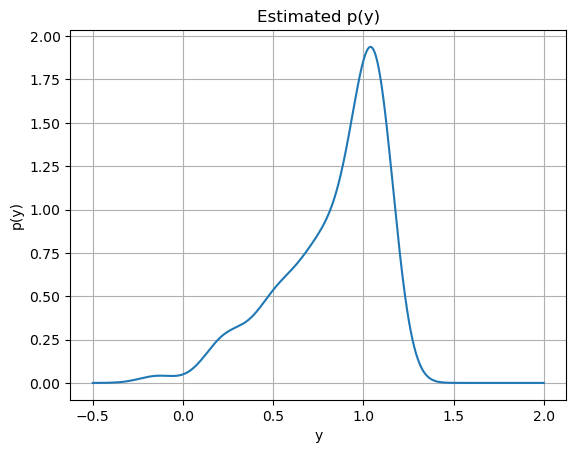

In [417]:
import matplotlib.pyplot as plt

x = np.linspace(-0.5, 2, 1000)
vals = [gmm_pdf(y, gmm) for y in x]

plt.plot(x, vals)
plt.title("Estimated p(y)")
plt.xlabel('y')
plt.ylabel('p(y)')
plt.grid()
plt.show()


### Surrogate model of g(x)

1. Approximate g(x) with a smooth model
2. Use fast integration afterward

# case study Overview

::: {.content-hidden}
## Goal of this Cass study

::: {.incremental}
- Setup an new stochastic model
- Evaluate the Bayes risk whit the new stochastic model
- Try out new decision rules
- Implement importance sampling in MCS
:::
:::

## Chosen Features

Modal properties: 

- x first natural frequencies
- x first mode shapes


Features: 

- natural frequencies
- Total Modal Assurance Criterion (TMAC)
  - $MAC(\phi_a,\phi_b)=\frac{|\phi_a^T\phi_b|^2}{(\phi_a^T\phi_a)(\phi_b^T\phi_b)}$
  - with no damage as reference $H_0$
- Modal Flexibility
  - $F = \sum_{i=1}^{n} \frac{\phi_i \phi_i^T}{\omega_i^2}$




## Evaluation of the Bayes risk

Numarical integration: 

- MCS with importance sampling 

Decision rules:

- Explicit likelihood for Modal properties (no use of features)
    - Maximum a posteriori (MAP) decision rule $\delta(y) = \arg\max_{a} p(H \mid y)$
- Supervised Machine learning (ML) classification based on the features (no use of likelihood)
    - Logistic regression

## Prior distibution

::: {.notes}
I have chosen to use uniformed priors for the damage states? 
:::

In [418]:
#| echo: fallse
#| output: true
H_1 = 0.01
H_0 = 1-H_1

# uninformed prior
N_prior = 2**4
prior_H = np.array([H_0, H_1])
prior_theta = np.concatenate(([H_0], np.repeat(H_1 / (N_prior - 1), N_prior - 1)))

print(f"Prior probabilities for H: {prior_H}")
print(f"\nPrior probabilities for θ: {np.round(prior_theta, 4)}")

Prior probabilities for H: [0.99 0.01]

Prior probabilities for θ: [9.9e-01 7.0e-04 7.0e-04 7.0e-04 7.0e-04 7.0e-04 7.0e-04 7.0e-04 7.0e-04
 7.0e-04 7.0e-04 7.0e-04 7.0e-04 7.0e-04 7.0e-04 7.0e-04]


## Cost function

::: {.nonincremental}
::: panel-tabset
### Total Cost

$$
C_\text{total} = C_\text{prediction}(H, d) + C_\text{sensors}(e)
$$

### Sensor Cost's 

$$
C_\text{sensors}(e) = 5 + 1 \cdot \text{number of sensors}
$$

### Prediction Cost Matrix

$$
C_\text{prediction} = \begin{bmatrix}
0 & 50 \\
10000 & 10
\end{bmatrix} = 
\begin{bmatrix}
\text{True Negative} & \text{False Positive} \\
\text{False Negative} & \text{True Positive}
\end{bmatrix}
$$

where:

- Positive: is the prediction of damage.
- Negative: is the prediction of no damage.
- True Positive (TP): Correctly predicting damage when it is present.
- False Positive (FP): Incorrectly predicting damage when it is not present.
- True Negative (TN): Correctly predicting no damage when it is not present.
- False Negative (FN): Incorrectly predicting no damage when there is actually damage.


### code


In [419]:
#| echo: true
#| output: true
# C [H, d] = the prediction cost
prediction_cost = np.array([[0,   50],  # TN, FP
                            [10000, 100]   # FN, TP
                            ])  

H = 1; d = 1 
print(f"Prediction cost: {prediction_cost[H, d]}, which is the cost of predicting {d} when the true state is {H}.")

def sensor_cost(n_sensors):
    return 5 + 1 * n_sensors

Prediction cost: 100, which is the cost of predicting 1 when the true state is 1.


:::
:::

::: {.content-hidden}
# Running the document 
:::

In [420]:
#| echo: false
#| output: false
#-- åben pdf
import os
def open_pdf(file_path):
    try:
        os.startfile(file_path)
        print("PDF-filen er åbnet.")
    except Exception as e:
        print(f"Der opstod en fejl: {e}")
def close_adobe_acrobat():
    os.system("taskkill /f /im Acrobat.exe")  # Luk Adobe Acrobat Reader
#-- hent filnaven
from IPython import get_ipython
ip = get_ipython()
path = None
if '__vsc_ipynb_file__' in ip.user_ns:
    path = ip.user_ns['__vsc_ipynb_file__']
notebook_name = os.path.splitext(os.path.basename(path))[0]
#-- test count
countPDF = 0; countHTML = 0;countGitHub = 0
# countPDF = 0; countHTML = 1;countGitHub = 0
# countPDF = 0; countHTML = 1;countGitHub = 1

In [421]:
#| echo: false
#| output: false
# countPDF += 1
# if countPDF > 1: #!quarto render notebook_name.ipynb --to pdf
#   os.system(f"quarto render {notebook_name}.ipynb --to beamer")
#   #open_pdf(f"{notebook_name}.pdf")
#   os.system(f"start {notebook_name}.pdf")

In [422]:
#| echo: false
#| output: false
# quarto render P_new2.ipynb --to revealjs --output P_new2.html
# quarto render P_new2.ipynb --to revealjs --output P_new2.html 
# P_new2.html

countHTML += 1
if countHTML > 1: #!quarto render notebook_name.ipynb --to html
  os.system(f"quarto render {notebook_name}.ipynb --to revealjs --output {notebook_name}.html")
  os.system(f"start {notebook_name}.html")

In [424]:
#| echo: false 
#| output: false
# save an copy notebook_name.html in the "research-notebook" folder and rename it "index.html"ArithmeticError
countGitHub += 1
if countGitHub > 1:
  from quarto_files.git_add import git_add_and_push
  # add index.html to git and push to GitHub
  git_add_and_push(notebook_name, output_name="P_new",  type="html")
  # add Readme.md to git and push to GitHub
#   git_add_and_push("Readme", type="md")
  


Current directory: c:\Users\axiom\OneDrive - Danmarks Tekniske Universitet\5. kandidat - Semester
✅ Source file exists: P_new2.html
File size: 12643689 bytes
✅ Destination directory exists: research-notebook
Files in destination: ['.git', 'index.html', 'README.md', 'Theory Of The Model.md', 'week_16', 'week_17', 'week_18', 'week_19']
Copy command output:         1 file(s) copied.

Copy command errors: 
Copy command return code: 0
✅ File successfully copied to research-notebook\P_new.html

Changed to directory: c:\Users\axiom\OneDrive - Danmarks Tekniske Universitet\5. kandidat - Semester\research-notebook
❌ Git operation failed: [WinError 2] The system cannot find the file specified

Returned to: c:\Users\axiom\OneDrive - Danmarks Tekniske Universitet\5. kandidat - Semester
